<div style="align-items: center; justify-content: center; flex-wrap: wrap;">
<center><br> <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/e/ef/Twitter_and_X_logos.svg/485px-Twitter_and_X_logos.svg.png?20230724093320" style="width: 150px;"></center><br>
</div>

<div style="display: flex; align-items: center; justify-content: center; flex-wrap: wrap;">
    <div style="flex: 1; max-width: 400px; display: flex; justify-content: center;">
        <img src="https://i.ibb.co/JBPWVYR/Logo-Nova-IMS-Black.png" style="max-width: 50%; height: auto; margin-top: 50px; margin-bottom: 50px;margin-left: 6rem;">
    </div>
    <div style="flex: 2; text-align: center; margin-top: 20px;margin-left: 8rem;">
        <div style="font-size: 28px; font-weight: bold; line-height: 1.2;">
            <span style="color: #24A3F1;">TM Project |</span> <span style="color: #2a2a83;">Stock Market Sentiment Tweets Analysis</span>
        </div>
        <div style="font-size: 17px; font-weight: bold; margin-top: 10px;">
            Spring Semester | 2024 - 2025
        </div>
        <div style="font-size: 17px; font-weight: bold;">
            Master in Data Science and Advanced Analytics
        </div>
        <div style="margin-top: 20px;">
            <div>André Silvestre, 20240502</div>
            <div>Filipa Pereira, 20240509</div>
            <div>João Henriques, 20240499</div>
            <div>Umeima Mahomed, 20240543</div>
        </div>
        <div style="margin-top: 20px; font-weight: bold;">
            Group 37
        </div>
    </div>
</div>

# <span style="color: #ffffff;">1 & 2 | Business & Data Understanding</span>

<div style="background: linear-gradient(to right, #24A3F1, #0B62A3, #113d7c, #000000);
            padding: 15px; color: white; border-radius: 300px; text-align: center;">
    <center><h1 style="margin-left: 100px;margin-top: 10px; margin-bottom: 4px; color: white;
                       font-size: 32px; font-family: 'Avenir Next LT Pro', sans-serif;"><b>1 & 2 | Business & Data Understanding</b></h1></center>
</div>

<br><br>


### **📝 Project Overview**

This project focuses on understanding how tweets reflect stock market sentiment. Market sentiment, often described as "bullish" (expecting prices to rise) or "bearish" (expecting prices to fall), influences investor behavior. This work involves building a tool to automatically classify tweets based on the sentiment they express towards the market.

### **🎯 Project Goals**

The primary goal is to develop a Natural Language Processing (NLP) model using Python. This model needs to read a tweet and decide if it shows a Bearish (coded as **0**), Bullish (coded as **1**), or Neutral (coded as **2**) attitude. We will use libraries like NLTK, Scikit-learn, and Hugging Face to build and test this classification model.

### **🎲 Dataset**

- **Dataset Name**: Stock Market Sentiment Tweets (derived name)
- **Dataset Description**: The data consists of tweets related to the stock market. It's split into a training file (`train.csv`) and a testing file (`test.csv`). The training file contains the tweet text and its corresponding sentiment label (0, 1, or 2). The test file contains tweet text and an ID, but no labels; the task is to predict these missing labels.
- **Dataset Source**: Provided for this course project.
- **Dataset Size**: The training set (`train.csv`) contains 9543 tweets. The test set (`test.csv`) contains 299 tweets.
- **Dataset Format**: Comma-Separated Values (.csv)

### **🔎 Dataset Attributes**

Our analysis uses datasets with the following structures:

<center>

<b>Table 1 | </b> `train.csv` Attributes with Descriptions. <br>

<br>

|       | **Field** | **Explanation**                                                   | **Type** |
|-------|-----------|-------------------------------------------------------------------|----------|
| **1** | `text`    | The actual content of the tweet.                                  | Text     |
| **2** | `label`   | The sentiment category: 0 (Bearish), 1 (Bullish), or 2 (Neutral). | Integer  |

</center>

<br>

<center>

<b>Table 2 | </b> `test.csv` Attributes with Descriptions. <br>

<br>

|       | **Field** | **Explanation**                                                              | **Type** |
|-------|-----------|------------------------------------------------------------------------------|----------|
| **1** | `id`      | A unique identifier for each tweet in the test set.                          | Integer  |
| **2** | `text`    | The actual content of the tweet for which sentiment needs to be predicted. | Text     |

</center>

<br><br>

<div style="background: linear-gradient(to right, #24A3F1, #0B62A3, #113d7c, #000000);
            padding: 7px; color: white; border-radius: 500px; text-align: center;">
</div>

## 📚 **Libraries Import**

In [1]:
# # Downgrade numpy to version if necessary
# !pip install numpy==1.26.4
# # Note: Restart the kernel after downgrading numpy to ensure compatibility.

# # Download libraries (if not already installed)
# !pip install nltk emoji wordcloud
# !pip install demoji
# !pip install lingua-language-detector
# !pip install gensim

In [2]:
# # Source to install PyTorch: https://pytorch.org/get-started/locally/
# !pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126

# # To install Locally/Google Collab
# !pip install transformers
# !pip install accelerate

In [3]:
# # Install Keras and Keras-Preprocessing (if not already installed)
# !pip install keras
# !pip install Keras-Preprocessing

In [4]:
# Imports for System Operations
import os
import sys
import time
import datetime
from typing import List, Union

# Imports for Data Manipulation
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

# Imports for Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
from collections import Counter
import itertools

# Imports for Model Evaluation
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, \
    precision_score, recall_score, f1_score

# Imports for Text Processing
import re
from tqdm import tqdm                       # Locally Run Progress Bar
# from tqdm.notebook import tqdm            # Google Colab Progress Bar

import string
import demoji
demoji.download_codes()
from lingua import Language, LanguageDetectorBuilder      # For language detection

# Imports for Natural Language Processing
from nltk.corpus import stopwords
from nltk.tokenize import TweetTokenizer
from nltk.stem import WordNetLemmatizer
from nltk import download as nltk_download
nltk_download('punkt')
nltk_download('stopwords')
nltk_download('wordnet')

from wordcloud import WordCloud

# Imports for Feature Engineering (Bag of Words, TF-IDF, GloVe)
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import gensim.downloader

# Imports for Deep Learning (LSTM) using Keras and PyTorch
# Since Transformers models are compatible with PyTorch, we will use PyTorch for training and evaluation LSTM models.
# Source: https://keras.io/guides/writing_a_custom_training_loop_in_torch/
os.environ["KERAS_BACKEND"] = "torch"  # Set Keras backend to PyTorch

import torch
import keras

from keras.models import Model
from keras.layers import Input, LSTM, Dense, Dropout, Bidirectional, Masking
from keras.optimizers import Adam
from keras.metrics import CategoricalAccuracy, AUC, F1Score, Precision, Recall
from keras.losses import CategoricalCrossentropy
from keras.callbacks import EarlyStopping, ModelCheckpoint, CSVLogger, ReduceLROnPlateau
from keras.utils import to_categorical
from keras_preprocessing.sequence import pad_sequences
from itertools import product

# Make the model start with same weights for reproducibility
torch.manual_seed(2025)

# Imports for Transformer Models
import transformers
# Source: https://huggingface.co/models
from transformers import pipeline, AutoModel, AutoTokenizer, AutoModelForCausalLM

# Disable warnings for the pipeline
# Source: https://huggingface.co/docs/transformers/en/main_classes/logging
from transformers import logging
logging.set_verbosity_error()  # Suppress warnings from the transformers library

[nltk_data] Downloading package punkt to C:\Users\André
[nltk_data]     Silvestre\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\André
[nltk_data]     Silvestre\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\André
[nltk_data]     Silvestre\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [5]:
# Source https://github.com/pytorch/torchtune/issues/1185
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

print(transformers.__version__)
print(torch.__version__)

4.52.0
2.7.0+cu128


In [6]:
torch.cuda.empty_cache()  # Clear cache
torch.cuda.is_available() # Check if GPU is available
# (if False in Google Colab: Make sure your Hardware accelerator is set to GPU. | Runtime > Change runtime type > Hardware Accelerator)

# automatically chose CPU or GPU for inference, depending on your hardware
device = torch.cuda.current_device() if torch.cuda.is_available() else -1
# -1 == CPU ; 0 == GPU
print(device)

0


In [7]:
# Auxiliary function to display multiple dataframes side by side
# Source: https://python.plainenglish.io/displaying-multiple-dataframes-side-by-side-in-jupyter-lab-notebook-9a4649a4940
from IPython.display import display_html
from itertools import chain,cycle
def display_side_by_side(*args, super_title, titles=cycle([''])):
    """ Display multiple DataFrames side by side in a Jupyter notebook.
    Args:
        args: Variable number of DataFrame objects to be displayed side by side.
        super_title: The main title to be displayed at the top of the combined view.
        titles: An iterable containing titles for each DataFrame to be displayed. Defaults to an infinite cycle of empty strings.

    Returns:
        None. The function generates and displays HTML content side by side for given DataFrames.
    """
    html_str = ''
    html_str += f'<h1 style="text-align: left; margin-bottom: -15px;">{super_title}</h1><br>'
    html_str += '<div style="display: flex;">'
    for df, title in zip(args, chain(titles, cycle(['</br>']))):
        html_str += f'<div style="margin-right: 20px;"><h3 style="text-align: center;color:#555555;">{title}</h3>'
        html_str += df.to_html().replace('table', 'table style="display:inline; margin-right: 20px;"')
        html_str += '</div>'
    html_str += '</div>'
    display_html(html_str, raw=True)

---

## 🧮 **Import Databases**

In [8]:
# Load the dataset
tweets_train_data = pd.read_csv('./data/train.csv')
tweets_test_data = pd.read_csv('./data/test.csv')

# Display the first 5 rows of the train dataset
tweets_train_data.head(5)

,text,label
0,$BYND - JPMorgan reels in expectations on Beyo...,0
1,$CCL $RCL - Nomura points to bookings weakness...,0
2,"$CX - Cemex cut at Credit Suisse, J.P. Morgan ...",0
3,$ESS: BTIG Research cuts to Neutral https://t....,0
4,$FNKO - Funko slides after Piper Jaffray PT cu...,0


In [9]:
# Display the first 5 rows of the test dataset
tweets_test_data.head(5)

,id,text
0,0,ETF assets to surge tenfold in 10 years to $50...
1,1,Here’s What Hedge Funds Think Evolution Petrol...
2,2,$PVH - Phillips-Van Heusen Q3 2020 Earnings Pr...
3,3,China is in the process of waiving retaliatory...
4,4,"Highlight: “When growth is scarce, investors s..."


> As we are expecting, the difference between the training and test datasets is that the training dataset has a label column, while the test dataset does not.

In [10]:
# Number of rows and columns
print("\033[1mTrain Dataset \033[0m")
print("  Number of rows:", tweets_train_data.shape[0])
print("  Number of columns:", tweets_train_data.shape[1])

print("\n\033[1mTest Dataset \033[0m")
print("  Number of rows:", tweets_test_data.shape[0])
print("  Number of columns:", tweets_test_data.shape[1])

Train Dataset 
  Number of rows: 9543
  Number of columns: 2

Test Dataset 
  Number of rows: 2388
  Number of columns: 2


> We have $2388$ tweets in the **test** dataset (instead of $299$ that was mentioned in the project description) and $9543$ tweets in the **train** dataset. 


In [11]:
# Columns that train_data have more than test_data
tweets_train_data.columns.difference(tweets_test_data.columns)

Index(['label'], dtype='object')

---

## 📋 **Evaluate Data**

### 🔄 **Duplicates**

In [12]:
# Check for duplicates in the train and test datasets
duplicates_train = tweets_train_data.duplicated().sum()
print(f"\033[1mDuplicates in Train Dataset: \033[0m{duplicates_train}")

duplicates_test = tweets_test_data.duplicated().sum()
print(f"\033[1mDuplicates in Test Dataset: \033[0m{duplicates_test}")

Duplicates in Train Dataset: 0
Duplicates in Test Dataset: 0


### 🔢🔠 **Data Types**

In [13]:
# Check the data types of the columns in the train dataset
data_types_df = pd.DataFrame(tweets_train_data.dtypes, columns=["Data Types"])
data_types_df

,Data Types
text,object
label,int64


In [14]:
# Check the data types of the columns in the test dataset
data_types_test_df = pd.DataFrame(tweets_test_data.dtypes, columns=["Data Types"])
data_types_test_df

,Data Types
id,int64
text,object


### 🔎 **Missing Values and Distinct Values**

Checking the number of **`null`** values or **`NAs`** in the columns.

In [15]:
# Check for missing values (n = number of missing values & % = percentage of missing values)
pd.DataFrame({
    "n NAs | Train": tweets_train_data.isnull().sum(),
    "% NAs | Train": round(tweets_train_data.isnull().mean() * 100, 1),
    "n NAs | Test": tweets_test_data.isnull().sum(),
    "% NAs | Test": round(tweets_test_data.isnull().mean() * 100, 1)}
)

,n NAs | Train,% NAs | Train,n NAs | Test,% NAs | Test
id,NaN,NaN,0.0,0.0
label,0.0,0.0,NaN,NaN
text,0.0,0.0,0.0,0.0


---

# <span style="color: #ffffff;">3 | Data Preparation</span>

<br>
<style>
@import url('https://fonts.cdnfonts.com/css/avenir-next-lt-pro?styles=29974');
</style>

<div style="background: linear-gradient(to right, #24A3F1, #0B62A3, #113d7c, #000000);
            padding: 10px; color: white; border-radius: 300px; text-align: center;">
    <center><h1 style="margin-top: 10px; margin-bottom: 4px; color: white;
                       font-size: 32px; font-family: 'Avenir Next LT Pro', sans-serif;">
        <b>3 | Data Preparation</b></h1></center>
</div>

<br><br>

In [16]:
# Create a new directory for saving the visualizations
if not os.path.exists("EDA"):
    os.makedirs("EDA")

## 🔎 **EDA - Exploratory Data Analysis**

In [17]:
# Define the color palette for visualizations
color_palette = [
    "#000000",  # Black               0
    "#113D7C",  # Intense Blue        1
    "#0B62A3",  # Vibrant Blue        2
    "#0987C3",  # Light Blue          3
    "#24A3F1",  # Sky Blue            4
]

In [18]:
# Set Seaborn style
sns.set_style("white")

### **⭐ Rating and Text Length Distribution**


In [19]:
# Dictionary to map sentiment labels | Bearish (0), Bullish (1), or Neutral (2)
sentiment_labels = {
    0: "Bearish (0)",
    1: "Bullish (1)",
    2: "Neutral (2)"
}

# Assign sentiment labels to a color palette
sentiment_colors_n = {
    '0': "#113D7C",  # Bearish
    '1': "#24A3F1",  # Bullish
    '2': "#c4c4c4"   # Neutral
}
sentiment_colors_labels = {
    'Bearish (0)': "#113D7C",
    'Bullish (1)': "#24A3F1",
    'Neutral (2)': "#c4c4c4"
}

In [20]:
# Absolute and Relative Frequencies of sentiment labels in the train dataset
pd.DataFrame({
    "n": tweets_train_data['label'].value_counts(),
    "%": round(tweets_train_data['label'].value_counts(normalize=True) * 100, 1)
}).rename(index=sentiment_labels).sort_index(ascending=False)

,n,%
label,,
Neutral (2),6178,64.7
Bullish (1),1923,20.2
Bearish (0),1442,15.1


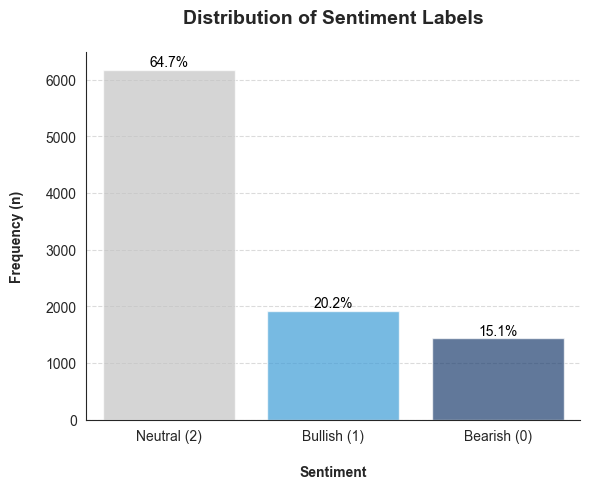

In [21]:
# Rating ('label') and Text ('text') Length Distribution
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 5))

# Barplot for 'label' column
sns.barplot(x=tweets_train_data['label'].replace(sentiment_labels).value_counts().index,
            y=tweets_train_data['label'].replace(sentiment_labels).value_counts().values,
            order=tweets_train_data['label'].replace(sentiment_labels).value_counts().index,
            palette=sentiment_colors_labels, alpha=0.7)
axs.set_title('Distribution of Sentiment Labels\n', fontsize=14, fontweight='bold')
axs.set_xlabel('\nSentiment', fontweight='bold', fontsize=10)
axs.set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs.grid(axis='y', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(tweets_train_data['label'].value_counts().values):
    percentage = (v / len(tweets_train_data)) * 100
    axs.text(i, v + 5, f"{percentage:.1f}%", ha='center', va='bottom', fontsize=10, color='black')

sns.despine(top=True, right=True)
plt.tight_layout()
plt.savefig("EDA/sentiment_label_distribution.png", dpi=300, bbox_inches='tight')
plt.show()

In [22]:
# Descriptive Statistics of the 'text' length in the Train & Test datasets
tweets_train_data['text_length'] = tweets_train_data['text'].apply(lambda x: len(str(x)))
tweets_test_data['text_length'] = tweets_test_data['text'].apply(lambda x: len(str(x)))

# Display descriptive statistics for text length
display_side_by_side(
    tweets_train_data['text_length'].describe().to_frame(),
    tweets_test_data['text_length'].describe().to_frame(),
    super_title="Descriptive Statistics of Text Length",
    titles=["Train Dataset", "Test Dataset"]
)

,text_length
count,9543.000000
mean,85.816934
std,35.097229
min,2.000000
25%,58.000000
50%,79.000000
75%,120.000000
max,190.000000
,text_length
count,2388.000000


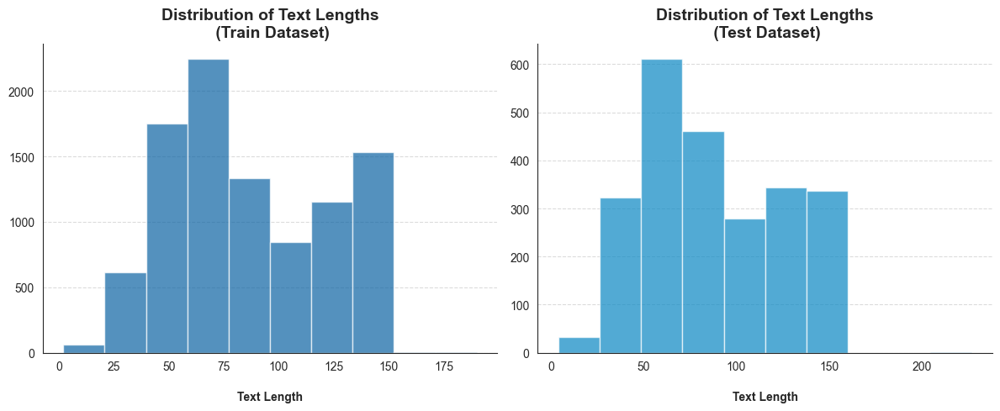

In [23]:
# Text ('text') Length Distribution
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Histogram for 'text' length distribution (Train dataset)
axs[0].hist(tweets_train_data['text'].str.len(), bins=10, color=color_palette[2], alpha=0.7)
axs[0].set_title('Distribution of Text Lengths\n (Train Dataset)', fontsize=14, fontweight='bold')
axs[0].set_xlabel('\nText Length', fontweight='bold', fontsize=10)
axs[0].grid(axis='y', linestyle='--', alpha=0.7)
    
# Histogram for 'text' length distribution (Test dataset)
axs[1].hist(tweets_test_data['text'].str.len(), bins=10, color=color_palette[3], alpha=0.7)
axs[1].set_title('Distribution of Text Lengths\n (Test Dataset)', fontsize=14, fontweight='bold')
axs[1].set_xlabel('\nText Length', fontweight='bold', fontsize=10)
axs[1].grid(axis='y', linestyle='--', alpha=0.7)

sns.despine(top=True, right=True)
plt.tight_layout()
# plt.savefig("EDA/text_length_distribution.png", format='png', dpi=1200)
plt.show()

In [24]:
# Descriptive Statistics of word counts in the 'text' column (Train Dataset)
tweets_train_data['word_count'] = tweets_train_data['text'].apply(lambda x: len(str(x).split()))
tweets_test_data['word_count'] = tweets_test_data['text'].apply(lambda x: len(str(x).split()))

# Display descriptive statistics for word count
display_side_by_side(
    tweets_train_data['word_count'].describe().to_frame(),
    tweets_test_data['word_count'].describe().to_frame(),
    super_title="Descriptive Statistics of Word Count",
    titles=["Train Dataset", "Test Dataset"]
)

,word_count
count,9543.000000
mean,12.178351
std,4.665599
min,1.000000
25%,9.000000
50%,11.000000
75%,15.000000
max,32.000000
,word_count
count,2388.000000


> The distribution of sentiment labels, shown earlier, reveals a significant imbalance. **Neutral** tweets (Class 2) make up about $64.7\%$ of the training data, while **Bullish** (Class 1) tweets account for $20.2\%$, and **Bearish** (Class 0) tweets for only $15.1\%$. 

- This class imbalance is an important factor to consider. When we split the data into *training* and *validation* sets, we should ensure this imbalance is preserved in both sets. 

- Techniques like **stratified sampling** are useful for this purpose. We could also address this imbalance during modeling, perhaps through methods like class weighting or resampling techniques (e.g., `SMOTE` for oversampling the minority classes or `RandomUnderSampler` for undersampling the majority class). However, we will not address this issue in this project, as we will use pre-trained models (e.g., ***BERT***, ***RoBERTa***) that are already trained on large datasets and can handle class imbalance effectively.

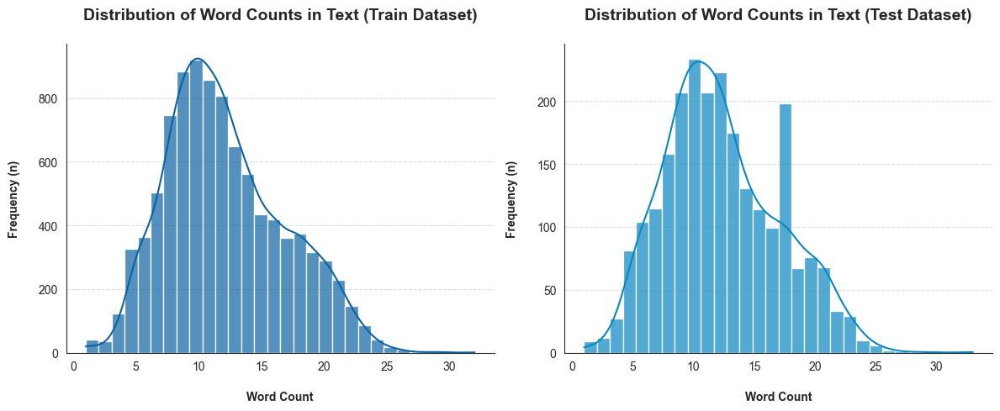

In [25]:
# Histogram of word counts in the 'text' column (Train & Test Dataset)
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Histogram for Train Dataset
sns.histplot(tweets_train_data['word_count'], bins=30, kde=True, color=color_palette[2], ax=axs[0], alpha=0.7)
axs[0].set_title('Distribution of Word Counts in Text (Train Dataset)\n', fontsize=14, fontweight='bold')
axs[0].set_xlabel('\nWord Count', fontweight='bold', fontsize=10)
axs[0].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

# Histogram for Test Dataset
sns.histplot(tweets_test_data['word_count'], bins=30, kde=True, color=color_palette[3], ax=axs[1], alpha=0.7)
axs[1].set_title('Distribution of Word Counts in Text (Test Dataset)\n', fontsize=14, fontweight='bold')
axs[1].set_xlabel('\nWord Count', fontweight='bold', fontsize=10)
axs[1].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[1].grid(axis='y', linestyle='--', alpha=0.7)

sns.despine(top=True, right=True)
plt.tight_layout()
plt.savefig("EDA/word_count_distribution.png", format='png', dpi=300)
plt.show()

---

### **💬 Identifying the Language of the Text**

In [26]:
# Setup for Language Detection
languages = [Language.ENGLISH]
detector = LanguageDetectorBuilder.from_languages(*languages).build()

# Function to detect language of a given text
def detect_language(text):
    try:
        return detector.detect_language_of(text)
    except:
        return 'Unknown'
    
# Apply the language detection function to the 'text' column of the train dataset
tweets_train_data['language'] = tweets_train_data['text'].apply(detect_language)

# Apply the language detection function to the 'text' column of the test dataset
tweets_test_data['language'] = tweets_test_data['text'].apply(detect_language)


# Table of absolute and relative frequencies of languages in the train dataset
train_lang_freq = tweets_train_data['language'].value_counts().fillna(0).astype(int) 
test_lang_freq = tweets_test_data['language'].value_counts().fillna(0).astype(int)

# Create a DataFrame to summarize language frequencies in train and test datasets
lang_freq = pd.DataFrame({'Train (n)': train_lang_freq,
                          'Train (%)': round(train_lang_freq / tweets_train_data['language'].count()*100,1),
                          'Test (n)': test_lang_freq,
                          'Test (%)':round(test_lang_freq / tweets_test_data['language'].count()*100,1)})
lang_freq.index.name = 'Linguagens'
lang_freq.rename(index={Language.ENGLISH: 'English'}, inplace=True)
lang_freq = lang_freq.fillna(0)
lang_freq['Train (n)'] = lang_freq['Train (n)'].astype(int)
lang_freq['Test (n)'] = lang_freq['Test (n)'].astype(int)
lang_freq

,Train (n),Train (%),Test (n),Test (%)
Linguagens,,,,
English,8883,100.0,2226,100.0


> The language of the tweets is identified using the `langdetect` library, which detects that all tweets are in **English**. This is important for ensuring that our NLP model is trained on text in the correct language, as language-specific nuances can significantly affect sentiment analysis (specifically, for choosing the right *Hugging Face* model).

---

### **🔢Numbers/ 🔣 Mentions / #️⃣ Hashtags Distribution**

In [27]:
# Helper function to get top N items from a list of lists of items (like numbers, mentions, hashtags)
def get_top_n_items(list_of_lists_of_items, n=10):
    """
    Counts the frequency of each item in a list of lists and returns the top N.
    
    Args:
        list_of_lists_of_items (list): A list where each element is a list of items (e.g., words, numbers).
        n (int): The number of top items to return.
        
    Returns:
        pd.DataFrame: A DataFrame with 'item' and 'frequency' columns for the top N items.
    """
    # Flatten the list of lists into a single list of all items
    all_items = list(itertools.chain.from_iterable(list_of_lists_of_items))
    
    # Count the frequency of each item
    item_counts = Counter(all_items)
    
    # Get the top N most common items
    top_items = item_counts.most_common(n)
    
    # Convert to a DataFrame for easier display
    top_items_df = pd.DataFrame(top_items, columns=['item', 'n'])
    
    # Calculate the percentage of each item
    top_items_df['%'] = round((top_items_df['n'] / top_items_df['n'].sum()) * 100, 1)
    
    # Sort by frequency in descending order
    top_items_df = top_items_df.sort_values(by='n', ascending=False).reset_index(drop=True)
    
    # Set the index to 'item'
    top_items_df.set_index('item', inplace=True)
    top_items_df.index.name = None  # Remove the index name for cleaner display
    
    return top_items_df

In [28]:
# ------------------------- EDA for Numbers in Tweets -------------------------
# Function to extract numbers from text
def extract_numbers(text):
    """Extracts all sequences of digits (numbers) from a given text."""
    return re.findall(r'\b\d+\b', str(text)) # \b ensures whole words/numbers

# Apply the function to the 'text' column of both train and test datasets
train_numbers_list = tweets_train_data['text'].apply(extract_numbers).tolist()
test_numbers_list = tweets_test_data['text'].apply(extract_numbers).tolist()

# Print the number of tweets containing numbers in both datasets
print(f"\033[1mNumber of tweets containing numbers in the training set:\033[0m {sum(len(numbers) > 0 for numbers in train_numbers_list)}")
print(f"\033[1mNumber of tweets containing numbers in the test set:\033[0m {sum(len(numbers) > 0 for numbers in test_numbers_list)}")

# Print the total distinct number of numbers extracted from both datasets
train_numbers_set = set(itertools.chain.from_iterable(train_numbers_list))
test_numbers_set = set(itertools.chain.from_iterable(test_numbers_list))

print(f"\n\033[1mTotal distinct numbers in the training set:\033[0m {len(train_numbers_set)}")
print(f"\033[1mTotal distinct numbers in the test set:\033[0m {len(test_numbers_set)}")

# Get top numbers
top_train_numbers_df = get_top_n_items(train_numbers_list, n=15)
top_test_numbers_df = get_top_n_items(test_numbers_list, n=15)

# Rename the index to 'Number' for clarity
top_train_numbers_df.index.name = 'Number'
top_test_numbers_df.index.name = 'Number'

# Display top numbers side by side
display_side_by_side(top_train_numbers_df, top_test_numbers_df,
                     titles=['Top 15 Numbers in Training Set', 'Top 15 Numbers in Test Set'],
                     super_title='Most Frequent Numbers in Tweets (Raw Text)')

Number of tweets containing numbers in the training set: 3301
Number of tweets containing numbers in the test set: 830

Total distinct numbers in the training set: 459
Total distinct numbers in the test set: 249


,n,%
Number,,
0,474,14.0
1,427,12.6
2019,299,8.9
3,294,8.7
2020,293,8.7
2,274,8.1
5,241,7.1
4,217,6.4
6,145,4.3


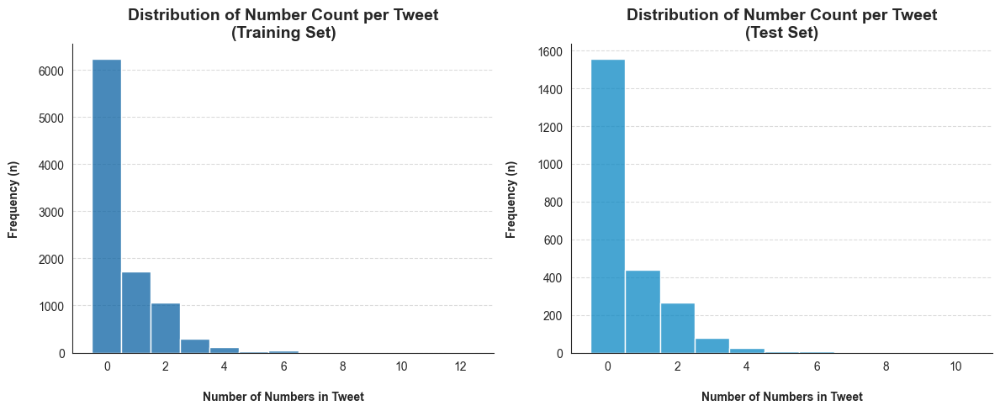

In [29]:
# Calculate the count of numbers per tweet
tweets_train_data['numbers_count'] = tweets_train_data['text'].apply(lambda x: len(extract_numbers(x)))
tweets_test_data['numbers_count'] = tweets_test_data['text'].apply(lambda x: len(extract_numbers(x)))

# Plot distribution of number counts per tweet
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

sns.histplot(tweets_train_data['numbers_count'], bins=range(0, tweets_train_data['numbers_count'].max() + 2), ax=axs[0], color=color_palette[2], discrete=True)
axs[0].set_title('Distribution of Number Count per Tweet\n(Training Set)', fontsize=14, fontweight='bold')
axs[0].set_xlabel('\nNumber of Numbers in Tweet', fontweight='bold', fontsize=10)
axs[0].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

sns.histplot(tweets_test_data['numbers_count'], bins=range(0, tweets_test_data['numbers_count'].max() + 2), ax=axs[1], color=color_palette[3], discrete=True)
axs[1].set_title('Distribution of Number Count per Tweet\n(Test Set)', fontsize=14, fontweight='bold')
axs[1].set_xlabel('\nNumber of Numbers in Tweet', fontweight='bold', fontsize=10)
axs[1].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[1].grid(axis='y', linestyle='--', alpha=0.7)

sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

In [30]:
# Display some examples of tweets containing frequent numbers

# Taking a few top numbers from the previously generated top_train_numbers_df
example_numbers_to_find = top_train_numbers_df.index.tolist() 
if not example_numbers_to_find:                                         # Handle case where df might be empty
    example_numbers_to_find = ['2020', '3', '10']                       # Default examples

for num_str in example_numbers_to_find:
    count = 0
    print(f"\n\033[1mExamples of Tweets Containing '{num_str}':\033[0m")
    for index, row in tweets_train_data.sample(frac=1, random_state=42).iterrows(): # Shuffle to get diverse examples
        if num_str in extract_numbers(row['text']):
            print(f"- {row['text']}")
            count += 1
            if count >= 2: # Show 2 examples per number
                break
    if count == 0:
        print(f"No direct examples found for '{num_str}' in sample.")


Examples of Tweets Containing '0':
- $MTSC - MTS Systems declares $0.30 dividend https://t.co/QRVl05IT61
- Ebix declares $0.075 dividend

Examples of Tweets Containing '1':
- Dow up 0.2%; S&P 500 rises 0.1%
- 'Hope' Vs 'Nope' - Dow Soars 1000 Points As Gold Spikes Near $1,700  https://t.co/gy9Ll5GZmK

Examples of Tweets Containing '2019':
- More than half of Generation Z is already saving for a home, according to Bank of America's 2019 Fall Homebuyer Ins… https://t.co/G20gBc8DMo
- $IESC - IES Holdings, Inc. 2019 Q4 - Results - Earnings Call Presentation. Follow this and any other stock on Seeki… https://t.co/vgFgOd2BRC

Examples of Tweets Containing '3':
- General Announcement::SIIC Environment to Build 3,800 tonnes per day Waste Treatment Proje... #SIIC #Stock… https://t.co/OzKMWezAnp
- GlobalSCAPE jumps ~12% on $55M credit facility and special dividend of $3.35

Examples of Tweets Containing '2020':
- CrowdStrike reported better-than-expected fiscal Q3 2020 results yesterday. “We th

In [31]:
# ------------------------- EDA for Mentions (@) in Tweets -------------------------

# Function to extract mentions
def extract_mentions(text):
    """Extracts all mentions (e.g., @username) from a given text."""
    return re.findall(r'@(\w+)', str(text)) # Captures the username without @

# Apply extraction
train_mentions_list = tweets_train_data['text'].apply(extract_mentions).tolist()
test_mentions_list = tweets_test_data['text'].apply(extract_mentions).tolist()

# Print the number of tweets containing mentions in both datasets
print(f"\033[1mNumber of tweets containing mentions in the training set:\033[0m {sum(len(mentions) > 0 for mentions in train_mentions_list)}")
print(f"\033[1mNumber of tweets containing mentions in the test set:\033[0m {sum(len(mentions) > 0 for mentions in test_mentions_list)}")

# Print the total distinct number of mentions extracted from both datasets
train_mentions_set = set(itertools.chain.from_iterable(train_mentions_list))
test_mentions_set = set(itertools.chain.from_iterable(test_mentions_list))

print(f"\n\033[1mTotal distinct mentions in the training set:\033[0m {len(train_mentions_set)}")
print(f"\033[1mTotal distinct mentions in the test set:\033[0m {len(test_mentions_set)}")

# Get top mentions
top_train_mentions_df = get_top_n_items(train_mentions_list, n=15)
top_test_mentions_df = get_top_n_items(test_mentions_list, n=15)

# Rename the index to 'Mention' for clarity
top_train_mentions_df.index.name = 'Mention (@username)'
top_test_mentions_df.index.name = 'Mention (@username)'

# Display top mentions side by side
display_side_by_side(top_train_mentions_df, top_test_mentions_df,
                     titles=['Top 15 Mentions in Training Set', 'Top 15 Mentions in Test Set'],
                     super_title='Most Frequent Mentions in Tweets (Raw Text)')

Number of tweets containing mentions in the training set: 294
Number of tweets containing mentions in the test set: 76

Total distinct mentions in the training set: 213
Total distinct mentions in the test set: 68


,n,%
Mention (@username),,
business,15,13.9
CNBCMakeIt,14,13.0
JimCramer,13,12.0
bopinion,10,9.3
TradingNation,9,8.3
rickjnewman,7,6.5
BW,6,5.6
bcheungz,5,4.6
CMEGroup,5,4.6


In [32]:
# Display some examples of tweets containing frequent mentions
example_mentions_to_find = top_train_mentions_df.index.tolist()   # Taking a few top mentions from the previously generated top_train_mentions_df
if not example_mentions_to_find:
    example_mentions_to_find = ['CNBC', 'Reuters', 'MarketWatch'] # Default examples if list is empty

# Display examples of tweets containing the top mentions
for mention_str in example_mentions_to_find:
    count = 0
    print(f"\n\033[1mExamples of Tweets Containing '@{mention_str}':\033[0m")
    for index, row in tweets_train_data.sample(frac=1, random_state=42).iterrows():
        if mention_str in extract_mentions(row['text']):
            print(f"- {row['text']}")
            count += 1
            if count >= 2: # Show 2 examples per mention
                break
    if count == 0:
        print(f"No direct examples found for '@{mention_str}' in sample.")


Examples of Tweets Containing '@business':
- Teva, drugmakers in talks With U.S. to end generics probes https://t.co/Gq01nHEEaP via @business https://t.co/M0ICENAbiX
- Amazon sues over loss of Pentagon cloud deal to Microsoft https://t.co/8V4JiazrzH via @business https://t.co/sI3cF5Guz4

Examples of Tweets Containing '@CNBCMakeIt':
- A former car salesman advises that you never say this 1 thing when negotiating a deal. (via @CNBCMakeIt) https://t.co/Z8bAUPhyUd
- This is the best answer I ever received to the question, "Tell me about yourself." (via @CNBCMakeIt) https://t.co/O328RzdGIU

Examples of Tweets Containing '@JimCramer':
- .@JimCramer's latest thought on U.S.-China trade negotiations? "I think it's time to walk away." Read his full reas… https://t.co/mCqYMLgt6S
- .@realDonaldTrump has repeatedly touted his friendship with China's President Xi. @JimCramer says @BernieSanders wo… https://t.co/ixnYugXsRX

Examples of Tweets Containing '@bopinion':
- Can LVMH give Tiffany's diamon

In [33]:
# ------------------------- EDA for Hashtags (#) in Tweets -----------------------------
# Function to extract hashtags
def extract_hashtags(text):
    """Extracts all hashtags (e.g., #topic) from a given text."""
    return re.findall(r'#(\w+)', str(text)) # Captures the tag without #

# Apply extraction
train_hashtags_list = tweets_train_data['text'].apply(extract_hashtags).tolist()
test_hashtags_list = tweets_test_data['text'].apply(extract_hashtags).tolist()

# Print the number of tweets containing hashtags in both datasets
print(f"\033[1mNumber of tweets containing hashtags in the training set:\033[0m {sum(len(hashtags) > 0 for hashtags in train_hashtags_list)}")
print(f"\033[1mNumber of tweets containing hashtags in the test set:\033[0m {sum(len(hashtags) > 0 for hashtags in test_hashtags_list)}")

# Print the total distinct number of hashtags extracted from both datasets
train_hashtags_set = set(itertools.chain.from_iterable(train_hashtags_list))
test_hashtags_set = set(itertools.chain.from_iterable(test_hashtags_list))
print(f"\n\033[1mTotal distinct hashtags in the training set:\033[0m {len(train_hashtags_set)}")
print(f"\033[1mTotal distinct hashtags in the test set:\033[0m {len(test_hashtags_set)}")

# Get top hashtags
top_train_hashtags_df = get_top_n_items(train_hashtags_list, n=15)
top_test_hashtags_df = get_top_n_items(test_hashtags_list, n=15)

# Rename the index to 'Hashtag' for clarity
top_train_hashtags_df.index.name = 'Hashtag (#topic)'
top_test_hashtags_df.index.name = 'Hashtag (#topic)'

# Display top hashtags side by side
display_side_by_side(top_train_hashtags_df, top_test_hashtags_df,
                     titles=['Top 15 Hashtags in Training Set', 'Top 15 Hashtags in Test Set'],
                     super_title='Most Frequent Hashtags in Tweets (Raw Text)')

Number of tweets containing hashtags in the training set: 896
Number of tweets containing hashtags in the test set: 224

Total distinct hashtags in the training set: 436
Total distinct hashtags in the test set: 136


,n,%
Hashtag (#topic),,
MarketScreener,477,28.8
Stock,379,22.9
economy,222,13.4
markets,81,4.9
trading,80,4.8
finance,80,4.8
stocks,72,4.4
business,71,4.3
investing,69,4.2


In [34]:
# Display some examples of tweets containing frequent hashtags
example_hashtags_to_find = top_train_hashtags_df.index.tolist()
if not example_hashtags_to_find:
    example_hashtags_to_find = ['stocks', 'trading', 'investing'] # Default examples if list is empty

for hashtag_str in example_hashtags_to_find:
    count = 0
    print(f"\n\033[1mExamples of Tweets Containing '#{hashtag_str}':\033[0m")
    for index, row in tweets_train_data.sample(frac=1, random_state=42).iterrows():
        if hashtag_str in extract_hashtags(row['text']):
            print(f"- {row['text']}")
            count += 1
            if count >= 2: # Show 2 examples per hashtag
                break
    if count == 0:
        print(f"No direct examples found for '#{hashtag_str}' in sample.")

# One final cleanup of helper columns added to tweets_train_data for this EDA, if you don't need numbers_count later
if 'numbers_count' in tweets_train_data.columns:
    tweets_train_data.drop(columns=['numbers_count'], inplace=True)
if 'numbers_count' in tweets_test_data.columns:
    tweets_test_data.drop(columns=['numbers_count'], inplace=True)


Examples of Tweets Containing '#MarketScreener':
- Ocean Grown Abalone : Results of Meeting #OceanGrownAbalone #Stock #MarketScreener https://t.co/c1IHVfDZdH https://t.co/DjXh9ai2EK
- GS Acquisition : Vertiv Investor Presentation #GS #Stock #MarketScreener https://t.co/IJRFVMfzWQ https://t.co/PyBD2UBrlD

Examples of Tweets Containing '#Stock':
- Ocean Grown Abalone : Results of Meeting #OceanGrownAbalone #Stock #MarketScreener https://t.co/c1IHVfDZdH https://t.co/DjXh9ai2EK
- General Announcement::SIIC Environment to Build 3,800 tonnes per day Waste Treatment Proje... #SIIC #Stock… https://t.co/OzKMWezAnp

Examples of Tweets Containing '#economy':
- $ING - ING May Be Through The Worst Point Of The Cycle. Read more: https://t.co/wTGUTspx6E #stockmarket #economy #investing
- World Coal Association : CCS regains momentum, but more ambition is needed #WorldCoalAssociation #economy… https://t.co/H1mhT5NaSu

Examples of Tweets Containing '#markets':
- $SPLK - Splunk: Full Steam Ahead. Follo

---

## ⚖️ **Training/Validation Split**

Before starting the feature engineering process that will be carried out in the next steps, we will divide the training data into training and validation sets. This will allow us to evaluate the performance of the models we will develop.

In [35]:
# Splitting the data into training and validation sets
X = tweets_train_data.drop(columns = ['label'])
y = tweets_train_data['label']

# Splitting the data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X, y,                # X and y
                                                  test_size = 0.25,    # 75% train, 25% validation
                                                  random_state = 2025, # Seed
                                                  stratify = y,        # Keep the same proportion of target classes (because of imbalance)
                                                  shuffle = True)      # Shuffle the data

In [36]:
# Check the shape of the training and validation sets
X_train.shape, X_val.shape

((7157, 4), (2386, 4))

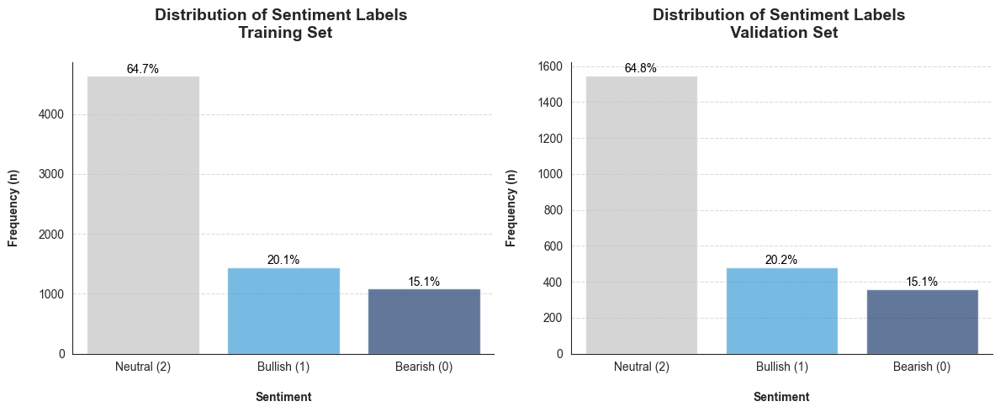

In [37]:
# Plot the distribution of sentiment labels in the training and validation sets
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Barplot for training set
sns.barplot(x=y_train.replace(sentiment_labels).value_counts().index,
            y=y_train.replace(sentiment_labels).value_counts().values,
            order=y_train.replace(sentiment_labels).value_counts().index,
            palette=sentiment_colors_labels,
            ax=axs[0], alpha=0.7)
axs[0].set_title('Distribution of Sentiment Labels \n Training Set\n', fontsize=14, fontweight='bold')
axs[0].set_xlabel('\nSentiment', fontweight='bold', fontsize=10)
axs[0].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(y_train.value_counts().values):
    percentage = (v / len(y_train)) * 100
    axs[0].text(i, v + 5, f"{percentage:.1f}%", ha='center', va='bottom', fontsize=10, color='black')

# Barplot for validation set
sns.barplot(x=y_val.replace(sentiment_labels).value_counts().index,
            y=y_val.replace(sentiment_labels).value_counts().values,
            order=y_val.replace(sentiment_labels).value_counts().index,
            palette=sentiment_colors_labels,
            ax=axs[1], alpha=0.7)
axs[1].set_title('Distribution of Sentiment Labels \n Validation Set\n', fontsize=14, fontweight='bold')
axs[1].set_xlabel('\nSentiment', fontweight='bold', fontsize=10)
axs[1].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[1].grid(axis='y', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(y_val.value_counts().values):
    percentage = (v / len(y_val)) * 100
    axs[1].text(i, v + 5, f"{percentage:.1f}%", ha='center', va='bottom', fontsize=10, color='black')

# Remove the top and right spines
sns.despine(top=True, right=True)
plt.tight_layout()
# plt.savefig("EDA/label_distribution_train_val.png", format='png', dpi=1200)
plt.show()

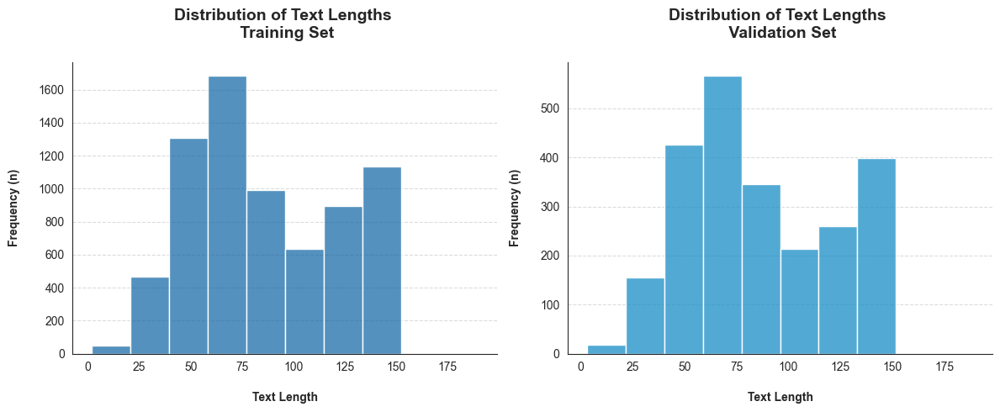

In [38]:
# Plot the distribution of text lengths in the training and validation sets
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Histogram for training set
sns.histplot(X_train['text'].str.len(), bins=10, color=color_palette[2], ax=axs[0], alpha=0.7)
axs[0].set_title('Distribution of Text Lengths \n Training Set\n', fontsize=14, fontweight='bold')
axs[0].set_xlabel('\nText Length', fontweight='bold', fontsize=10)
axs[0].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

# Histogram for validation set
sns.histplot(X_val['text'].str.len(), bins=10, color=color_palette[3], ax=axs[1], alpha=0.7)
axs[1].set_title('Distribution of Text Lengths \n Validation Set\n', fontsize=14, fontweight='bold')
axs[1].set_xlabel('\nText Length', fontweight='bold', fontsize=10)
axs[1].set_ylabel('Frequency (n)\n', fontweight='bold', fontsize=10)
axs[1].grid(axis='y', linestyle='--', alpha=0.7)

# Remove the top and right spines
sns.despine(top=True, right=True)
plt.tight_layout()
# plt.savefig("EDA/text_length_distribution_train_val.png", format='png', dpi=1200)
plt.show()

---

## 🔧🗨️ **Text Pre-Proccessing**

In [39]:
# Set the random seed for reproducibility
np.random.seed(42)

# Display 10 random samples 'text' and 'label' from the train dataset
pd.set_option('display.max_colwidth', None)      # Set max column width to None to display full text
tweets_train_data.sample(10)[["text", "label"]]

,text,label
5470,When staffers in WeWork's New York City headquarters received a calendar invite for a mandatory meeting with a note… https://t.co/dB8igjtRCt,2
8982,ADMA Biologics down 9% premarket after pricing equity offering,0
4704,Illegal Tender podcast: What it was like to befriend convicted socialite scammer Anna Delvey,2
1954,The Splunk Data-to-Everything Platform Brings Speed and Scale to McLaren,2
3146,OPEC's share of Indian oil imports in October hits lowest since 2011,2
1123,$M - Macy's to test new concept https://t.co/GDPbKYfu65,2
7185,China's Xi Visits Hospital in Beijing,2
2288,$MTSC - MTS Systems declares $0.30 dividend https://t.co/QRVl05IT61,2
1034,"Tesla Cybertruck Hits 200,000 Orders Just Days After Botched Launch",1
8761,LHC,2


### **Considerations about the Text Pre-Processing**
- **Lowercase**: Convert all text to lowercase for consistency (e.g., "Stock" and "stock" treated as the same).
- **Remove URLs**: Eliminate URLs (e.g., http, www) as they typically don't contribute to sentiment.
- **Remove Mentions**: Strip out user mentions (e.g., @username) to focus on content rather than user identifiers.
- **Remove Hashtag Symbols**: Remove the '#' symbol from hashtags while preserving the sentiment-rich words (e.g., #bullish becomes bullish).
- **Transform Emojis**: Convert emojis to their textual descriptions to capture potential sentiment for model processing.
- **Normalize Numbers**: Replace numbers with meaningful tags (e.g., percentages as PERCENT_TAG, monetary values as MONEY_TAG) to reduce sparsity and retain context.
- **Remove Punctuation**: Eliminate punctuation marks to simplify tokenization and focus on words.
- **Tokenization**: Split text into individual words using NLTK's TweetTokenizer, optimized for tweet-specific patterns.
- **Remove Stop Words**: Filter out common English words (e.g., "the", "is") while preserving sentiment- and finance-relevant terms (e.g., "bullish", "rise").
- **Lemmatization**: Reduce words to their base form (e.g., "stocks" becomes "stock") to group related terms and improve model generalization.
- **Join Tokens**: Combine cleaned tokens into a single string with spaces for downstream processing.

In [40]:
# Function to clean the text data
def clean_text(text, verbose=False):
    """
    Cleans input text using several preprocessing steps suitable for financial tweets.

    This function prepares text for NLP models by removing noise and standardizing format.
    Compared to a basic cleaning process, it includes specific steps for tweet elements
    like URLs, mentions, and hashtags.

    Args:
        text (str): The raw tweet text to be cleaned.
        verbose (bool): If True, prints the text after each major cleaning step. Defaults to False.

    Returns:
        str: The cleaned text, ready for feature extraction.
    """
    # Ensure the input is treated as a string
    text = str(text)
    if verbose:
        print(f"\n\033[1mOriginal text: \033[0m{text}")

    # 1. Lowercase the text
    # Reason: Ensures consistency. "Stock" and "stock" are treated as the same word.
    text = text.lower()
    if verbose:
        print(f"\n\033[1mLowercased text: \033[0m{text}")

    # 2. EXTRA: Remove URLs
    # Reason: Web links (http, www) usually don't add sentiment information themselves
    #         and can clutter the text data for analysis. This step isn't in the basic example.
    text = re.sub(r"http\S+|www\S+|https\S+", "", text, flags=re.MULTILINE)
    if verbose:
        print(f"\033[1mText after removing URLs:\033[0m{text}")

    # 3. EXTRA: Remove Mentions (@username)
    # Reason: User mentions typically identify users, not sentiment content.
    text = re.sub(r"@\w+", "", text)
    if verbose:
        print(f"\033[1mText after removing mentions: \033[0m{text}")

    # 4. Remove Hashtag Symbol Only (#)
    # Reason: Hashtags often contain sentiment-rich words (e.g., #bullish, #crash),
    #         especially in financial tweets. Instead of removing the entire hashtag,
    #         we keep the word and remove only the '#' symbol to preserve potentially meaningful content.
    text = re.sub(r"#", "", text)
    if verbose:
        print(f"\033[1mText after removing hashtag symbols: \033[0m{text}")

    # 5. EXTRA: Transform Emojis to text
    # Reason: Emojis can convey sentiment but are complex to interpret consistently by models
    #         without specialized handling. We convert them to text for easier processing.
    # Source: https://www.geeksforgeeks.org/convert-emoji-into-text-in-python/
    emojis_text = demoji.findall(text)              # Find all emojis in the text
    for emoji, meaning in emojis_text.items():      # For each emoji found, get its meaning
        text = text.replace(emoji, meaning)         # Replace the emoji with its meaning in the text    
    if verbose:
        print(f"\033[1mEmojis found: \033[0m{emojis_text}")
        print(f"\033[1mText after transform emojis: \033[0m{text}")
        
    # 8. Normalize Numbers
    # Reason: Numbers like percentages, years, and monetary values often carry sentiment in financial texts.
    #         Instead of removing them, we replace them with meaningful tags to reduce sparsity and improve generalization.

    # Replace percentages (e.g., 25%, 10 percent) with a tag
    text = re.sub(r"\b\d+(\.\d+)?%|\d+(\.\d+)?\s?percent\b", "PERCENT", text)

    # Replace years (e.g., 2020, 1999) with a tag
    text = re.sub(r"\b(19|20)\d{2}\b", "YEAR", text)

    # Replace monetary values (e.g., $500, 5M, 2b) with a tag
    text = re.sub(r"\$\d+[mkb]?", "MONEY", text, flags=re.IGNORECASE)
    text = re.sub(r"\b\d+[mkb]\b", "MONEY", text, flags=re.IGNORECASE)
    
    # Replace decimal numbers (e.g., 109.88) with a tag
    text = re.sub(r"\b\d+\.\d+\b", "NUMBER", text)

    # Replace any remaining standalone numbers (e.g., 100, 42) with a tag
    text = re.sub(r"\b\d+\b", "NUMBER", text)

    if verbose:
        print(f"\033[1mText after number normalization: \033[0m{text}")

    # 7. Remove Punctuation
    # Reason: Punctuation marks generally don't carry significant sentiment weight
    #         and can interfere with word separation (tokenization). Replaces them with spaces.
    text = re.sub(f"[{re.escape(string.punctuation)}]", " ", text) # Escape punctuation for regex
    if verbose:
        print(f"\033[1mText after removing punctuation: \033[0m{text}")

    # 9. Tokenize the text
    # Reason: Splits the cleaned text string into a list of individual words (tokens).
    #         This is necessary for steps like stopword removal and lemmatization.
    # Note: Uses NLTK's TweetTokenizer, which is designed for tokenizing tweets.
    # Source: https://www.nltk.org/api/nltk.tokenize.casual.html#nltk.tokenize.casual.TweetTokenizer
    tweet_tknz = TweetTokenizer(preserve_case=False, reduce_len=True)
    # Note: preserve_case=False converts all tokens to lowercase, reduce_len=True reduces repeated characters (e.g., "sooo" -> "so")
    # Tokenize the text
    tokens = tweet_tknz.tokenize(text)
    if verbose:
        print(f"\033[1mTokens: \033[0m{tokens}")
    
    # 10. Remove Stopwords
    # Reason: Filters out common English words ("the", "a", "is", "in") that appear frequently
    #         but usually don't help determine financial sentiment. Focuses on content words.
    stop_words = set(stopwords.words("english"))

    # Keep sentiment- and finance-relevant terms
    financial_terms_to_keep = ['up', 'down', 'off', 'more', 'above', 'below']

    for word in financial_terms_to_keep:
        stop_words.discard(word)

    tokens = [word for word in tokens if word not in stop_words]
    if verbose:
        print(f"\033[1mTokens after removing Stopwords: \033[0m{tokens}")

    # 11. Lemmatize the tokens
    # Reason: Reduces words to their base or dictionary form (e.g., "running" -> "run", "stocks" -> "stock").
    #         This groups related words, reducing the vocabulary size and helping the model generalize.
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    if verbose:
        print(f"\033[1mTokens after Lemmatization: \033[0m{tokens}")

    # 12. Join tokens back into a single string, separated by spaces.
    cleaned_text = " ".join(tokens)
    if verbose:
        print(f"\n\033[1mFinal cleaned text: \033[0m{cleaned_text}")

    return cleaned_text

# Example usage of the clean_text function
sample_tweet = "📈 $AAPL looks bullish! Going to the moon! 🚀 Check out https://example.com @analyst predicts #stocks UP! It's amazing!!!"
clean_text(sample_tweet, verbose=True)


Original text: 📈 $AAPL looks bullish! Going to the moon! 🚀 Check out https://example.com @analyst predicts #stocks UP! It's amazing!!!

Lowercased text: 📈 $aapl looks bullish! going to the moon! 🚀 check out https://example.com @analyst predicts #stocks up! it's amazing!!!
Text after removing URLs:📈 $aapl looks bullish! going to the moon! 🚀 check out  @analyst predicts #stocks up! it's amazing!!!
Text after removing mentions: 📈 $aapl looks bullish! going to the moon! 🚀 check out   predicts #stocks up! it's amazing!!!
Text after removing hashtag symbols: 📈 $aapl looks bullish! going to the moon! 🚀 check out   predicts stocks up! it's amazing!!!
Emojis found: {'🚀': 'rocket', '📈': 'chart increasing'}
Text after transform emojis: chart increasing $aapl looks bullish! going to the moon! rocket check out   predicts stocks up! it's amazing!!!
Text after number normalization: chart increasing $aapl looks bullish! going to the moon! rocket check out   predicts stocks up! it's amazing!!!
Text af

'chart increasing aapl look bullish going moon rocket check predicts stock up amazing'

In [41]:
# Apply the clean_text function to the 'text' column in the train corpus      (Avoid data leakage)
X_train['text_clean'] = [
    clean_text(txt, verbose=False)
    for txt in tqdm(X_train['text'], desc="Cleaning X_train", unit=" text")
]

# Apply the clean_text function to the 'text' column in the validation corpus
X_val['text_clean'] = [
    clean_text(txt, verbose=False)
    for txt in tqdm(X_val['text'], desc="Cleaning X_val", unit=" text")
]

# Apply the clean_text function to the 'text' column in the test corpus
tweets_test_data['text_clean'] = [
    clean_text(txt, verbose=False)
    for txt in tqdm(tweets_test_data['text'], desc="Cleaning tweets_test_data", unit=" text")
]

Cleaning tweets_test_data: 100%|██████████| 2388/2388 [00:02<00:00, 847.61 text/s]


---

#### **EDA after Text Pre-Processing**

In [42]:
# Descriptive Statistics of word counts in the 'text' column (Train, Validation and Test Dataset after Preprocessing)
tweets_train_data['word_count'] = X_train['text_clean'].str.split().apply(len)
tweets_test_data['word_count'] = tweets_test_data['text_clean'].str.split().apply(len)
X_val['word_count'] = X_val['text_clean'].str.split().apply(len)

# Display descriptive statistics for word counts
display_side_by_side(
    tweets_train_data['word_count'].describe().to_frame(name='Train'),
    tweets_test_data['word_count'].describe().to_frame(name='Test'),
    X_val['word_count'].describe().to_frame(name='Validation'),
    titles=['Word Count Statistics - Training Set', 'Word Count Statistics - Test Set', 'Word Count Statistics - Validation Set'],
    super_title='Descriptive Statistics of Word Counts in Tweets after Text Preprocessing'
)

,Train
count,7157.000000
mean,9.277071
std,3.309572
min,0.000000
25%,7.000000
50%,9.000000
75%,11.000000
max,33.000000
,Test
count,2388.000000


In [43]:
# Maximum word count in the training set
X_train.loc[X_train['word_count'].idxmax(), 'text_clean']

'recap number number unusual put f mar number p pagp feb number p db feb number p lk mar number p tme feb number p ftch jul number p ibn mar number …'

In [44]:
# Check duplicates in the cleaned train dataset
duplicates_train_clean = X_train['text_clean'].duplicated().sum()
print(f"\033[1mDuplicates in Cleaned Train Dataset: \033[0m{duplicates_train_clean}")
if duplicates_train_clean > 0:
    # Get frequency of each duplicated text
    train_duplicates_df = X_train[X_train['text_clean'].duplicated(keep=False)]
    train_duplicates_freq = train_duplicates_df['text_clean'].value_counts().reset_index()
    train_duplicates_freq.columns = ['text_clean', 'n']
    print("\033[1mFrequent Duplicated Texts in Train Dataset:\033[0m")
    display(train_duplicates_freq.head(5))
else:
    print("No duplicates found in the cleaned train dataset.")

# Check duplicates in the cleaned validation dataset
duplicates_val_clean = X_val['text_clean'].duplicated().sum()
print(f"\n\033[1mDuplicates in Cleaned Validation Dataset: \033[0m{duplicates_val_clean}")
if duplicates_val_clean > 0:
    # Get frequency of each duplicated text
    val_duplicates_df = X_val[X_val['text_clean'].duplicated(keep=False)]
    val_duplicates_freq = val_duplicates_df['text_clean'].value_counts().reset_index()
    val_duplicates_freq.columns = ['text_clean', 'n']
    print("\033[1mFrequent Duplicated Texts in Validation Dataset:\033[0m")
    display(val_duplicates_freq.head(5))
else:
    print("No duplicates found in the cleaned validation dataset.")

# Check duplicates in the cleaned test dataset
duplicates_test_clean = tweets_test_data['text_clean'].duplicated().sum()
print(f"\n\033[1mDuplicates in Cleaned Test Dataset: \033[0m{duplicates_test_clean}")
if duplicates_test_clean > 0:
    # Get frequency of each duplicated text
    test_duplicates_df = tweets_test_data[tweets_test_data['text_clean'].duplicated(keep=False)]
    test_duplicates_freq = test_duplicates_df['text_clean'].value_counts().reset_index()
    test_duplicates_freq.columns = ['text_clean', 'n']
    print("\033[1mFrequent Duplicated Texts in Test Dataset:\033[0m")
    display(test_duplicates_freq.head(5))
else:
    print("No duplicates found in the cleaned test dataset.")

Duplicates in Cleaned Train Dataset: 86
Frequent Duplicated Texts in Train Dataset:


,text_clean,n
0,news highlight top energy news day wti stock marketscreener,9
1,wire wire,7
2,comdx energy settlement price,7
3,,5
4,comdx metal settlement price,5



Duplicates in Cleaned Validation Dataset: 16
Frequent Duplicated Texts in Validation Dataset:


,text_clean,n
0,news highlight top energy news day wti stock marketscreener,4
1,comdx energy settlement price,3
2,comdx metal settlement price,2
3,,2
4,wire wire,2



Duplicates in Cleaned Test Dataset: 13
Frequent Duplicated Texts in Test Dataset:


,text_clean,n
0,comdx metal settlement price,5
1,hour,3
2,cbs viacom close merger dec number,2
3,news highlight top energy news day wti stock marketscreener,2
4,gold edge lower investor eyeing economic data silver stock marketscreener,2


In [45]:
# Function to check label consistency for duplicated texts
def check_label_consistency(X_df, y, dataset_name, label_col='label'):
    
    # If y is a Series, convert it to a DataFrame for consistency
    if isinstance(y, pd.Series):
        y_df = y.to_frame(name=label_col)
    else:
        y_df = y  # Assume y is already a DataFrame with the label column
    
    # Join X_df and y_df on their indices
    try:
        combined_df = X_df.join(y_df[label_col])
    except Exception as e:
        print(f"\033[1mError in {dataset_name} Dataset:\033[0m Failed to join X and y data: {e}")
        print("Ensure X and y have matching indices for the join.")
        return
    
    # Find duplicated texts (keep all instances)
    duplicates_df = combined_df[combined_df['text_clean'].duplicated(keep=False)]
        
    # Group by text_clean and check unique labels
    label_consistency = duplicates_df.groupby('text_clean')[label_col].nunique().reset_index()
    label_consistency.columns = ['text_clean', 'unique_label_count']
    
    # Join original 'text' column
    label_consistency = label_consistency.merge(X_df[['text_clean']], on='text_clean', how='left')
    label_consistency = label_consistency.drop_duplicates(subset=['text_clean'])   
    
    # Filter for texts with inconsistent labels (more than one unique label)
    inconsistent_labels = label_consistency[label_consistency['unique_label_count'] > 1]
    
    if len(inconsistent_labels) > 0:
        print(f"\033[1mLabel Consistency in {dataset_name} Dataset:\033[0m Found {len(inconsistent_labels)} texts with inconsistent labels.")
        # Merge with combined data to show labels for inconsistent texts
        inconsistent_texts = duplicates_df.merge(inconsistent_labels, on='text_clean')
        print(f"\033[1mInconsistent Duplicated Texts in {dataset_name} Dataset:\033[0m")
        display(inconsistent_texts[['text','text_clean', label_col]].sort_values('text_clean').head(10))
    else:
        print(f"\033[1mLabel Consistency in {dataset_name} Dataset:\033[0m All duplicated texts have consistent labels.")

# Check label consistency for train dataset
check_label_consistency(X_train, y_train, "Train", label_col='label')
print("\n\n")

# Check label consistency for validation dataset
check_label_consistency(X_val, y_val, "Validation", label_col='label')

Label Consistency in Train Dataset: Found 5 texts with inconsistent labels.
Inconsistent Duplicated Texts in Train Dataset:


,text,text_clean,label
1,$ECONX: November Nonfarm Private Payrolls 254K vs 175K https://t.co/M9gpUZQoF7 consensus https://t.co/fav5NvyRH3,econx november nonfarm private payroll money v money consensus,1
10,$ECONX: November Nonfarm Private Payrolls 125K vs 153K https://t.co/M9gpUZQoF7 consensus https://t.co/fav5NvyRH3,econx november nonfarm private payroll money v money consensus,0
0,$ECONX: November Unemployment Rate 4.9% vs 4.1% https://t.co/M9gpUZQoF7 consensus https://t.co/p5wq6wH9wr,econx november unemployment rate percent v percent consensus,0
5,$ECONX: November Unemployment Rate 3.5% vs 3.6% https://t.co/M9gpUZQoF7 consensus https://t.co/p5wq6wH9wr,econx november unemployment rate percent v percent consensus,1
2,"Elon Musk says Tesla has 146,000 orders for its Cybertruck, less than 48 hours after the broken-glass reveal https://t.co/yzgK4mbBTB",elon musk say tesla number number order cybertruck less number hour broken glass reveal,2
9,"Elon Musk says Tesla has 187,000 orders for its Cybertruck, less than 48 hours after the broken-glass reveal https://t.co/AtBQDgnjUP",elon musk say tesla number number order cybertruck less number hour broken glass reveal,1
4,"$SUMRX: Asian Markets Close: Nikkei -0.6%, Hang Seng -0.6%, Shanghai +0.5% https://t.co/jej2QmqnvP",sumrx asian market close nikkei percent hang seng percent shanghai percent,2
7,"$SUMRX: Asian Markets Close: Nikkei +2.0%, Hang Seng +2.1%, Shanghai +2.1% https://t.co/36MDQpNDxz",sumrx asian market close nikkei percent hang seng percent shanghai percent,1
8,"$SUMRX: Asian Markets Close: Nikkei +0.8%, Hang Seng +1.5%, Shanghai +0.7% https://t.co/Z2UYTyWAwU",sumrx asian market close nikkei percent hang seng percent shanghai percent,1
3,Wall Street Weekahead: Conditions may be set for Santa Claus rally https://t.co/H33Y0b2ZzZ https://t.co/4ubPdO0rvg,wall street weekahead condition may set santa claus rally,1





Label Consistency in Validation Dataset: Found 1 texts with inconsistent labels.
Inconsistent Duplicated Texts in Validation Dataset:


,text,text_clean,label
0,"$SUMRX: European Markets Update: DAX +0.5%, FTSE +0.9%, CAC +0.4% https://t.co/nTHSu2EJ0U",sumrx european market update dax percent ftse percent cac percent,1
1,"$SUMRX: European Markets Update: DAX -0.3%, FTSE -0.2%, CAC -0.4% https://t.co/UDYYOri06l",sumrx european market update dax percent ftse percent cac percent,0


---

### **📝 Text Analysis (N-grams and WordClouds)**

#### 🌥️ **Word Cloud** 

In [46]:
# Define a function to plot word cloud
# Source: https://example.com/wordcloud-source
#         https://kristendavis27.medium.com/wordcloud-style-guide-2f348a03a7f8 (for color palette)    
def plot_cloud(wordcloud):
    fig = plt.figure(figsize=(25, 17), dpi=80)
    plt.tight_layout(pad=0)
    plt.imshow(wordcloud, interpolation='bilinear', cmap='Blues_r')
    plt.axis("off")
    plt.box(False)
    plt.show()
    plt.close()

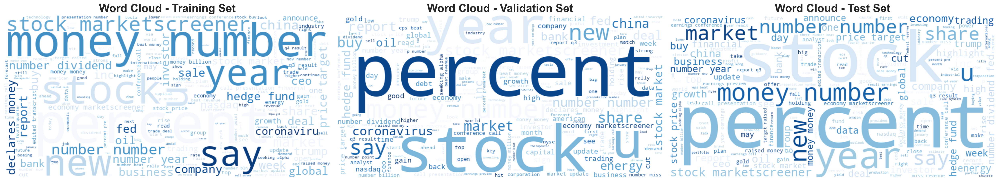

In [47]:
# Create a word cloud from each set
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(25, 5), dpi=200)

# Word cloud for the training set
wordcloud_train = WordCloud(width=800, height=400, background_color='white', colormap='Blues_r').generate(" ".join(X_train['text_clean']))
axs[0].imshow(wordcloud_train, interpolation='bilinear')
axs[0].axis('off')
axs[0].set_title('Word Cloud - Training Set', fontsize=20, fontweight='bold')

# Word cloud for the validation set
wordcloud_val = WordCloud(width=800, height=400, background_color='white', colormap='Blues_r').generate(" ".join(X_val['text_clean']))
axs[1].imshow(wordcloud_val, interpolation='bilinear')
axs[1].axis('off')
axs[1].set_title('Word Cloud - Validation Set', fontsize=20, fontweight='bold')

# Word cloud for the test set
wordcloud_test = WordCloud(width=800, height=400, background_color='white', colormap='Blues_r').generate(" ".join(tweets_test_data['text_clean']))
axs[2].imshow(wordcloud_test, interpolation='bilinear')
axs[2].axis('off')
axs[2].set_title('Word Cloud - Test Set', fontsize=20, fontweight='bold')

# Adjust layout and display the word clouds
plt.tight_layout()
# plt.savefig("EDA/wordclouds.png", format='png', dpi=1200)
plt.show()

---

## **🗂️ Feature Engineering**

### **💰 Bag of Words (Bow)**

Each word is a feature. Our feature space is defined by our vocabulary. Documents/pieces of text will be represented as sparse vectors.

In [48]:
# # Define a custom tokenizer function for CountVectorizer
# def tokenizer(text):
#     """
#     Custom tokenizer function to split text into tokens while preserving important punctuation.
    
#     Args:
#         text (str): The input text to tokenize.
        
#     Returns:
#         list: A list of tokens extracted from the input text.
#     """
#     # Define characters to preserve (same as in clean_text)
#     preserve_chars = '$<>#@&%€£¥+*-=/^~'
    
#     # 1. Protect important symbols to prevent tokenization split
#     # Reason: In financial contexts, $aapl, 10%, etc., should stay as single tokens.
#     # Protect $ followed by a word
#     text = re.sub(r'\$(\w+)', r'DOLLAR\1', text)
#     # Protect other symbols (e.g., %, €, £, ¥) followed by a word or number
#     for symbol in ['%', '€', '£', '¥', '&']:
#         pattern = r'{}([\w\d]+)'.format(re.escape(symbol))  # e.g., \%([\w\d]+) for %10, %aapl
#         text = re.sub(pattern, r'\1{}SYMBOL'.format(symbol), text)  # e.g., 10%SYMBOL
    
#     # 2. Use NLTK's TweetTokenizer for tokenization
#     tweet_tknz = TweetTokenizer(preserve_case=False, reduce_len=True)
#     tokens = tweet_tknz.tokenize(text)
    
#     # 3. Restore protected symbols
#     # Reason: Convert DOLLARaapl back to $aapl, 10%SYMBOL back to 10%, etc.
#     restored_tokens = []
#     for token in tokens:
#         if token.startswith('dollar'):
#             restored_tokens.append('$' + token[6:])  # Restore $aapl
#         elif any(token.endswith(f'{symbol}symbol') for symbol in ['%', '€', '£', '¥', '&']):
#             for symbol in ['%', '€', '£', '¥', '&']:
#                 if token.endswith(f'{symbol}symbol'):
#                     restored_tokens.append(token[:-len(f'{symbol}symbol')] + symbol)  # Restore e.g., 10%
#                     break
#         else:
#             restored_tokens.append(token)
    
#     return restored_tokens

################ We decided not to spend so much time on this, since we are going to use transformers with their own tokenizers.

# Create BoW from train corpus
bow = CountVectorizer(
    # tokenizer=tokenizer,  # Custom tokenizer
    binary=True           # binary=True = 1 or 0
)
X_train_BoW = bow.fit_transform(X_train["text_clean"])
X_train_BoW


<7157x11555 sparse matrix of type '<class 'numpy.int64'>'
	with 61404 stored elements in Compressed Sparse Row format>

In [49]:
# Get the vocabulary (dictionary of tokens and their indices)
vocab = bow.vocabulary_

# Find words starting with $
dollar_words = [word for word in vocab.keys() if word.startswith('$')]

# Print results
print(f"\033[1mNumber of words in BoW vocabulary starting with $: \033[0m{len(dollar_words)}")
if len(dollar_words) > 0:
    print("\033[1mWords starting with $ in the BoW vocabulary:\033[0m")
    # for word in sorted(dollar_words):  # Sort for readability
    #     print(f"- {word} (index: {vocab[word]})")
else:
    print("No words starting with $ found in the BoW vocabulary.")

Number of words in BoW vocabulary starting with $: 0
No words starting with $ found in the BoW vocabulary.


<div style="background-color:#f9f9f9; border:2px solid #ccc; border-radius:8px; padding:16px;">

- **Samples (Tweets)**: 7157
- **Features (Unique Words)**: 11555

</div>

In [50]:
# Create BoW from validation corpus (avoid data leakage - only transform)
X_val_BoW = bow.transform(X_val["text_clean"])
X_val_BoW

<2386x11555 sparse matrix of type '<class 'numpy.int64'>'
	with 18106 stored elements in Compressed Sparse Row format>

In [51]:
# Create BoW from test corpus (avoid data leakage - only transform)
X_test_BoW = bow.transform(tweets_test_data["text_clean"])
X_test_BoW

<2388x11555 sparse matrix of type '<class 'numpy.int64'>'
	with 18477 stored elements in Compressed Sparse Row format>

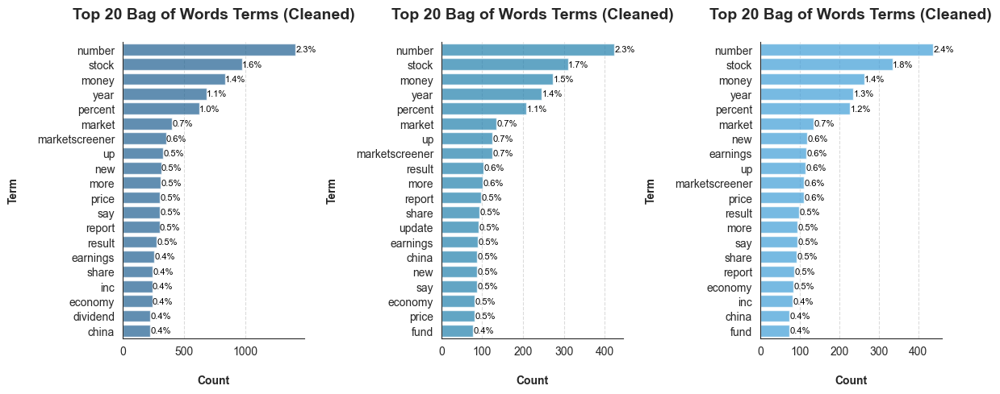

In [52]:
# Visualize top Bag of Words terms (Cleaned) | Train & Validation
# Ensure the lengths of terms and counts match for train data
train_clean_bow_sum = np.array(X_train_BoW.sum(axis=0)).flatten()
train_clean_terms = bow.get_feature_names_out()
train_clean_bow = pd.DataFrame({'term': train_clean_terms, 'count': train_clean_bow_sum}).sort_values(by='count', ascending=False)
train_clean_bow_top20 = train_clean_bow.head(20)

# Ensure the lengths of terms and counts match for validation data
val_clean_bow_sum = np.array(X_val_BoW.sum(axis=0)).flatten()
val_clean_terms = bow.get_feature_names_out()
val_clean_bow = pd.DataFrame({'term': val_clean_terms, 'count': val_clean_bow_sum}).sort_values(by='count', ascending=False)
val_clean_bow_top20 = val_clean_bow.head(20)

# Ensure the lengths of terms and counts match for test data
test_clean_bow_sum = np.array(X_test_BoW.sum(axis=0)).flatten()
test_clean_terms = bow.get_feature_names_out()
test_clean_bow = pd.DataFrame({'term': test_clean_terms, 'count': test_clean_bow_sum}).sort_values(by='count', ascending=False)
test_clean_bow_top20 = test_clean_bow.head(20)

# Plot the top Bag of Words terms (Cleaned) | Train & Validation & Test
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 5))

sns.barplot(data=train_clean_bow_top20, x='count', y='term', color=color_palette[2], order=train_clean_bow_top20['term'], alpha=0.7, ax=axs[0])
axs[0].set_title('Top 20 Bag of Words Terms (Cleaned)\n', fontsize=14, fontweight='bold')
axs[0].set_xlabel('\nCount', fontweight='bold', fontsize=10)
axs[0].set_ylabel('Term\n', fontweight='bold', fontsize=10)
axs[0].grid(axis='x', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(train_clean_bow_top20['count']):
    percentage = (v / train_clean_bow['count'].sum()) * 100
    axs[0].text(v + 1, i, f"{percentage:.1f}%", ha='left', va='center', fontsize=8, color='black')

sns.barplot(data=val_clean_bow_top20, x='count', y='term', color=color_palette[3], order=val_clean_bow_top20['term'], alpha=0.7, ax=axs[1])
axs[1].set_title('Top 20 Bag of Words Terms (Cleaned)\n', fontsize=14, fontweight='bold')
axs[1].set_xlabel('\nCount', fontweight='bold', fontsize=10)
axs[1].set_ylabel('Term\n', fontweight='bold', fontsize=10)
axs[1].grid(axis='x', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(val_clean_bow_top20['count']):
    percentage = (v / val_clean_bow['count'].sum()) * 100
    axs[1].text(v + 1, i, f"{percentage:.1f}%", ha='left', va='center', fontsize=8, color='black')

sns.barplot(data=test_clean_bow_top20, x='count', y='term', color=color_palette[4], order=test_clean_bow_top20['term'], alpha=0.7, ax=axs[2])
axs[2].set_title('Top 20 Bag of Words Terms (Cleaned)\n', fontsize=14, fontweight='bold')
axs[2].set_xlabel('\nCount', fontweight='bold', fontsize=10)
axs[2].set_ylabel('Term\n', fontweight='bold', fontsize=10)
axs[2].grid(axis='x', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(test_clean_bow_top20['count']):
    percentage = (v / test_clean_bow['count'].sum()) * 100
    axs[2].text(v + 1, i, f"{percentage:.1f}%", ha='left', va='center', fontsize=8, color='black')
    
# Remove the top and right spines
sns.despine(top=True, right=True)
plt.tight_layout()
# plt.savefig("EDA/bow_terms.png", format='png', dpi=1200)
plt.show()

In [53]:
# Function to generate word cloud from Bag of Words DataFrame
def generate_wordcloud_bow(df, ax, title):
    """
    Generates a word cloud from a DataFrame containing term frequencies.
    Args:
        df (pd.DataFrame): DataFrame with 'term' and 'count' columns.
        ax (matplotlib.axes.Axes): Axes object to plot the word cloud on.
        title (str): Title for the word cloud plot.
    """
    # Create a dictionary of word frequencies
    word_freq = dict(zip(df['term'], df['count']))
    
    # Remove words with zero count to avoid clutter
    word_freq = {word: freq for word, freq in word_freq.items() if freq > 0}
    
    # Generate word cloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='Blues_r',
        min_font_size=10,     # Minimum font size for better readability
        max_words=200,        # Limit number of words to avoid overcrowding
        relative_scaling=0.5  # Adjusts how much frequency affects size
    ).generate_from_frequencies(word_freq)
    
    # Display the word cloud
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title, fontsize=20, fontweight='bold')

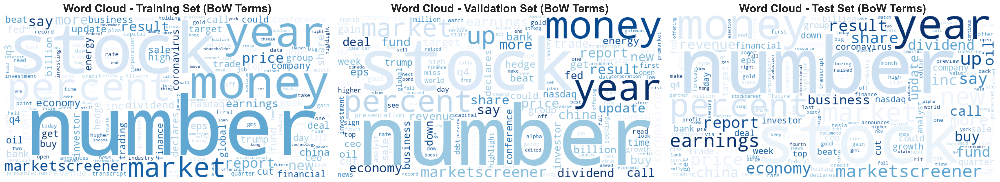

In [54]:
# Word cloud from BoW terms (Cleaned) | Train & Validation & Test
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(25, 5), dpi=200)

# Generate word clouds for each set
generate_wordcloud_bow(train_clean_bow, axs[0], 'Word Cloud - Training Set (BoW Terms)')
generate_wordcloud_bow(val_clean_bow, axs[1], 'Word Cloud - Validation Set (BoW Terms)')
generate_wordcloud_bow(test_clean_bow, axs[2], 'Word Cloud - Test Set (BoW Terms)')

# Adjust layout and display the word clouds
plt.tight_layout()
# plt.savefig("EDA/bow_wordclouds.png", format='png', dpi=1200)
plt.show()

---

### **✨TF-IDF (Term Frequency-Inverse Document Frequency)**

In [55]:
# Unigram and Bigram TF-IDF
# Create TF-IDF from train corpus
tfidf = TfidfVectorizer(ngram_range=(1, 2), max_df=0.8) # Unigram and Bigram
X_train_tfidf = tfidf.fit_transform(X_train["text_clean"])
X_train_tfidf

<7157x51996 sparse matrix of type '<class 'numpy.float64'>'
	with 117444 stored elements in Compressed Sparse Row format>

<div style="background-color:#f9f9f9; border:2px solid #ccc; border-radius:8px; padding:16px;">

- **Samples (Tweets)**: 7157
- **Features (Unique N-grams)**: 51996

</div>

In [56]:
# Create TF-IDF from validation corpus (avoid data leakage - only transform)
X_val_tfidf = tfidf.transform(X_val["text_clean"])
X_val_tfidf
X_val_tfidf

<2386x51996 sparse matrix of type '<class 'numpy.float64'>'
	with 24886 stored elements in Compressed Sparse Row format>

In [57]:
# Create TF-IDF from test corpus (avoid data leakage - only transform)
X_test_tfidf = tfidf.transform(tweets_test_data["text_clean"])
X_test_tfidf

<2388x51996 sparse matrix of type '<class 'numpy.float64'>'
	with 25311 stored elements in Compressed Sparse Row format>

In [58]:
# Visualize top TF-IDF terms (Cleaned) | Train & Validation
# Ensure the lengths of terms and sum of TF-IDF weights match for train data
train_clean_tfidf_sum = np.array(X_train_tfidf.sum(axis=0)).flatten()
train_clean_terms = tfidf.get_feature_names_out()
train_clean_tfidf = pd.DataFrame({'term': train_clean_terms, 'tfidf_weights': train_clean_tfidf_sum}).sort_values(by='tfidf_weights', ascending=False)
train_clean_tfidf_top20 = train_clean_tfidf.head(20)

# Ensure the lengths of terms and sum of TF-IDF weights match for validation data
val_clean_tfidf_sum = np.array(X_val_tfidf.sum(axis=0)).flatten()
val_clean_terms = tfidf.get_feature_names_out()
val_clean_tfidf = pd.DataFrame({'term': val_clean_terms, 'tfidf_weights': val_clean_tfidf_sum}).sort_values(by='tfidf_weights', ascending=False)
val_clean_tfidf_top20 = val_clean_tfidf.head(20)

# Ensure the lengths of terms and sum of TF-IDF weights match for test data
test_clean_tfidf_sum = np.array(X_test_tfidf.sum(axis=0)).flatten()
test_clean_terms = tfidf.get_feature_names_out()
test_clean_tfidf = pd.DataFrame({'term': test_clean_terms, 'tfidf_weights': test_clean_tfidf_sum}).sort_values(by='tfidf_weights', ascending=False)
test_clean_tfidf_top20 = test_clean_tfidf.head(20)

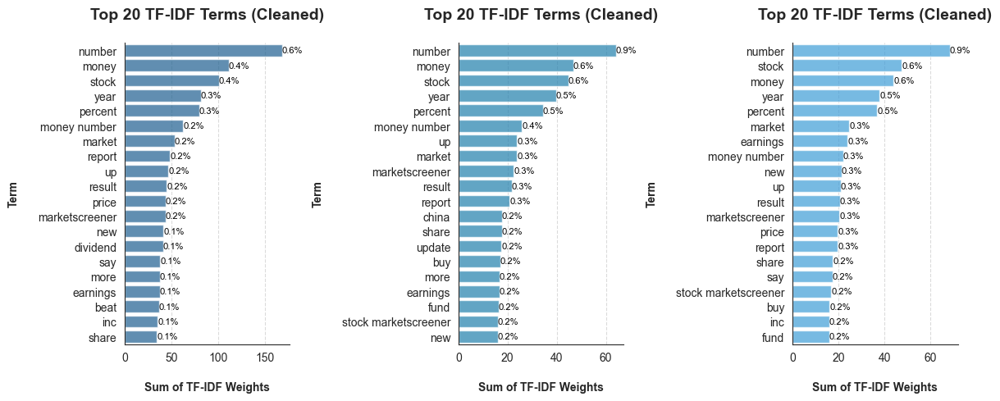

In [59]:
# Plot the top TF-IDF terms (Cleaned) | Train & Validation & Test
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 5))

sns.barplot(data=train_clean_tfidf_top20, x='tfidf_weights', y='term', color=color_palette[2], order=train_clean_tfidf_top20['term'], alpha=0.7, ax=axs[0])
axs[0].set_title('Top 20 TF-IDF Terms (Cleaned)\n', fontsize=14, fontweight='bold')
axs[0].set_xlabel('\nSum of TF-IDF Weights', fontweight='bold', fontsize=10)
axs[0].set_ylabel('Term\n', fontweight='bold', fontsize=10)
axs[0].grid(axis='x', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(train_clean_tfidf_top20['tfidf_weights']):
    percentage = (v / train_clean_tfidf['tfidf_weights'].sum()) * 100
    axs[0].text(v, i, f"{percentage:.1f}%", ha='left', va='center', fontsize=8, color='black')
    
sns.barplot(data=val_clean_tfidf_top20, x='tfidf_weights', y='term', color=color_palette[3], order=val_clean_tfidf_top20['term'], alpha=0.7, ax=axs[1])
axs[1].set_title('Top 20 TF-IDF Terms (Cleaned)\n', fontsize=14, fontweight='bold')
axs[1].set_xlabel('\nSum of TF-IDF Weights', fontweight='bold', fontsize=10)
axs[1].set_ylabel('Term\n', fontweight='bold', fontsize=10)
axs[1].grid(axis='x', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(val_clean_tfidf_top20['tfidf_weights']):
    percentage = (v / val_clean_tfidf['tfidf_weights'].sum()) * 100
    axs[1].text(v, i, f"{percentage:.1f}%", ha='left', va='center', fontsize=8, color='black')

sns.barplot(data=test_clean_tfidf_top20, x='tfidf_weights', y='term', color=color_palette[4], order=test_clean_tfidf_top20['term'], alpha=0.7, ax=axs[2])
axs[2].set_title('Top 20 TF-IDF Terms (Cleaned)\n', fontsize=14, fontweight='bold')
axs[2].set_xlabel('\nSum of TF-IDF Weights', fontweight='bold', fontsize=10)
axs[2].set_ylabel('Term\n', fontweight='bold', fontsize=10)
axs[2].grid(axis='x', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for i, v in enumerate(test_clean_tfidf_top20['tfidf_weights']):
    percentage = (v / test_clean_tfidf['tfidf_weights'].sum()) * 100
    axs[2].text(v, i, f"{percentage:.1f}%", ha='left', va='center', fontsize=8, color='black')

sns.despine(top=True, right=True)
plt.tight_layout()
# plt.savefig("EDA/tfidf_terms.png", format='png', dpi=1200)
plt.show()

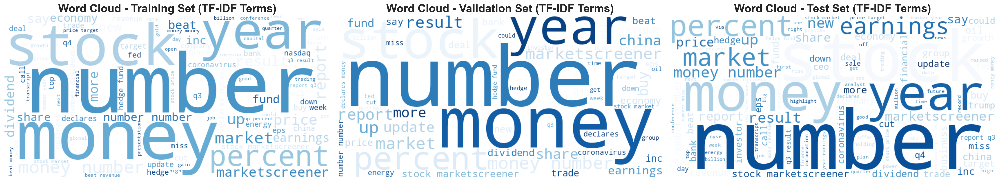

In [60]:
# Function to generate word cloud from TF-IDF DataFrame
def generate_wordcloud_tfidf(df, ax, title):
    """
    Generates a word cloud from a DataFrame containing TF-IDF terms and scores.
    
    Args:
        df (pd.DataFrame): DataFrame with 'term' and 'tfidf_weights' columns.
        ax (matplotlib.axes.Axes): Axes object to plot the word cloud on.
        title (str): Title for the word cloud plot.
    """    
    # Create a dictionary of term:tfidf_weights for word cloud
    word_freq = dict(zip(df['term'], df['tfidf_weights']))
    
    # Generate word cloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='Blues_r',
        min_font_size=10,    # Minimum font size for readability
        max_words=200,       # Limit to avoid overcrowding
        relative_scaling=0.5 # Balance size differences
    ).generate_from_frequencies(word_freq)
    
    # Display the word cloud
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title, fontsize=20, fontweight='bold')


# Create a figure with three subplots
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(25, 5), dpi=200)

# Generate word clouds for each set
generate_wordcloud_tfidf(train_clean_tfidf, axs[0], 'Word Cloud - Training Set (TF-IDF Terms)')
generate_wordcloud_tfidf(val_clean_tfidf, axs[1], 'Word Cloud - Validation Set (TF-IDF Terms)')
generate_wordcloud_tfidf(test_clean_tfidf, axs[2], 'Word Cloud - Test Set (TF-IDF Terms)')

# Adjust layout and display
plt.tight_layout()
# plt.savefig("EDA/tfidf_wordclouds.png", format='png', dpi=1200)
plt.show()

### **🌌 GloVe Embeddings**

In [61]:
# Display available Gensim models
print(list(gensim.downloader.info()['models'].keys()))

['fasttext-wiki-news-subwords-300', 'conceptnet-numberbatch-17-06-300', 'word2vec-ruscorpora-300', 'word2vec-google-news-300', 'glove-wiki-gigaword-50', 'glove-wiki-gigaword-100', 'glove-wiki-gigaword-200', 'glove-wiki-gigaword-300', 'glove-twitter-25', 'glove-twitter-50', 'glove-twitter-100', 'glove-twitter-200', '__testing_word2vec-matrix-synopsis']


- Since our dataset is about tweets, we will use the **GloVe Twitter Embeddings**.

In [62]:
gensim.downloader.info()['models']['glove-twitter-200']

{'num_records': 1193514,
 'file_size': 795373100,
 'base_dataset': 'Twitter (2B tweets, 27B tokens, 1.2M vocab, uncased)',
 'reader_code': 'https://github.com/RaRe-Technologies/gensim-data/releases/download/glove-twitter-200/__init__.py',
 'license': 'http://opendatacommons.org/licenses/pddl/',
 'parameters': {'dimension': 200},
 'description': 'Pre-trained vectors based on 2B tweets, 27B tokens, 1.2M vocab, uncased (https://nlp.stanford.edu/projects/glove/).',
 'preprocessing': 'Converted to w2v format with `python -m gensim.scripts.glove2word2vec -i <fname> -o glove-twitter-200.txt`.',
 'read_more': ['https://nlp.stanford.edu/projects/glove/',
  'https://nlp.stanford.edu/pubs/glove.pdf'],
 'checksum': 'e52e8392d1860b95d5308a525817d8f9',
 'file_name': 'glove-twitter-200.gz',
 'parts': 1}

In [63]:
# Download the pre-trained GloVe model 'glove-twitter-200'
glove_model = gensim.downloader.load('glove-twitter-200')

In [64]:
# Function to get word embeddings from documents
def corpus2vec(corpus: List[str], w2v: gensim.models.KeyedVectors) -> List[List[np.ndarray]]:
    """
    Converts a corpus of documents into a list of word embeddings using a pre-trained word2vec model.
    Args:
        corpus (list of str): List of documents (each document is a string).
        w2v (gensim.models.KeyedVectors): Pre-trained word2vec model.
    Returns:
        list of list of np.ndarray: List of word embeddings for each document.
    """
    index_set = set(w2v.index_to_key)   # Faster lookup
    word_vec = w2v.get_vector           # Alias for speed
    return [
        [word_vec(word) for word in doc.split() if word in index_set]
        for doc in tqdm(corpus, desc="Extracting embeddings", unit=" document")
    ]
    
# Extract sentence embeddings for the training set
X_train_glove = corpus2vec(X_train['text_clean'], glove_model)

# Extract sentence embeddings for the validation set
X_val_glove = corpus2vec(X_val['text_clean'], glove_model)

# Extract sentence embeddings for the test set
X_test_glove = corpus2vec(tweets_test_data['text_clean'], glove_model)

# Show the shape of the embeddings
print(f"\033[1mShape of GloVe embeddings for X_train: \033[0m{len(X_train_glove)} documents with {len(X_train_glove[0][0])} embeddings")
print(f"\033[1mShape of GloVe embeddings for X_val: \033[0m{len(X_val_glove)} documents with {len(X_val_glove[0][0])} embeddings")
print(f"\033[1mShape of GloVe embeddings for X_test: \033[0m{len(X_test_glove)} documents with {len(X_test_glove[0][0])} embeddings")

Extracting embeddings: 100%|██████████| 2388/2388 [00:00<00:00, 12929.11 document/s]

Shape of GloVe embeddings for X_train: 7157 documents with 200 embeddings
Shape of GloVe embeddings for X_val: 2386 documents with 200 embeddings
Shape of GloVe embeddings for X_test: 2388 documents with 200 embeddings


---

### **[EXTRA 1] 🤗 Embeddings from Hugging Face Encoder [DeBERTa V3 Base](https://huggingface.co/sileod/deberta-v3-base-tasksource-nli)**

- We use the DeBERTa V3 Base model to obtain contextualized embeddings for our text data.
  - This model is pre-trained on a large corpus and fine-tuned for natural language understanding tasks **but not specifically for stock market sentiment**.

#### **Generate the embeddings with a Transformer Model**

- We will use the `transformers` library to load the model and generate embeddings for our text data.
    - To do this, we will use the `pipeline` function from the `transformers` library, with the `feature-extraction` task.
    - This will allow us to obtain the embeddings for each tweet in our dataset.
      - The embeddings will be generated for each tweet in the training and validation sets, resulting in a matrix of shape `(number_of_tweets, embedding_dimension)`.

<div style="background-color:#f9f9f9; border:2px solid #ccc; border-radius:8px; padding:16px;">

**Example of a Embedding Generation**

- **Original Text**: [CLS] The stock market is doing well today [SEP]
- **Model Input**: [CLS] [100, 200, 300, ...] [SEP]  (where each number represents a token ID)
- **Model Output**: [[0.1, -0.2, 0.3, ...], [0.4, -0.5, 0.6, ...], ...] (a list of vectors representing the text) with shape `(number_of_tweets, embedding_dimension)`.
  - **Embedding Dimension**: 768 (Corresponding to number of hidden units in the model)

</div>

In [65]:
# Function to generate CLS embeddings using a Hugging Face model
def generate_cls_embeddings(texts, embeddings_model, desc="Generating CLS Embeddings"):
    """
    Generates CLS token embeddings for a list of input texts.

    Args:
        texts (list of str): List of text inputs.
        embeddings_model (callable): A Hugging Face embedding pipeline or model that returns hidden states.
        desc (str): Description for the tqdm progress bar.

    Returns:
        List of torch.Tensor: CLS embeddings for each input text.
    """
    # List to hold CLS embeddings
    cls_embeddings = []
    
    # Iterate over each text input and generate CLS embeddings
    for text in tqdm(texts, desc=desc):
        
        # Generate embeddings using the provided model
        embeddings = embeddings_model(text)
        
        # Assuming output format is [ [ [CLS], token1, token2, ... ] ]
        # Extract the CLS token embedding (first token in the first batch)
        cls_embedding = torch.tensor(embeddings[0][0])
        
        # Append the CLS embedding to the list
        cls_embeddings.append(cls_embedding)
        
    # Return the list of CLS embeddings
    return cls_embeddings

In [66]:
# Define DeBERTa V3 Base model path
deberta_model_path = "sileod/deberta-v3-base-tasksource-nli"

# Load the pipeline for feature extraction
deberta_feature_extractor = pipeline("feature-extraction", model=deberta_model_path, tokenizer=deberta_model_path, device=device,
                                     padding=True, truncation=True)

# Generate CLS embeddings for the training set (using original text)
X_train_deberta = generate_cls_embeddings(
    X_train['text'].tolist(),
    embeddings_model=deberta_feature_extractor,
    desc="Generating CLS Embeddings for X_train"
)

# Generate CLS embeddings for the validation set (using original text)
X_val_deberta = generate_cls_embeddings(
    X_val['text'].tolist(),
    embeddings_model=deberta_feature_extractor,
    desc="Generating CLS Embeddings for X_val"
)

# Generate CLS embeddings for the test set (using original text)
X_test_deberta = generate_cls_embeddings(
    tweets_test_data['text'].tolist(),
    embeddings_model=deberta_feature_extractor,
    desc="Generating CLS Embeddings for tweets_test_data"
)

# Show the shape of the embeddings
print(f"\033[1mShape of DeBERTa embeddings for X_train: \033[0m{torch.stack(X_train_deberta).shape}")
print(f"\033[1mShape of DeBERTa embeddings for X_val: \033[0m{torch.stack(X_val_deberta).shape}")
print(f"\033[1mShape of DeBERTa embeddings for X_test: \033[0m{torch.stack(X_test_deberta).shape}")

Generating CLS Embeddings for tweets_test_data: 100%|██████████| 2388/2388 [01:40<00:00, 23.81it/s]

Shape of DeBERTa embeddings for X_train: torch.Size([7157, 768])
Shape of DeBERTa embeddings for X_val: torch.Size([2386, 768])
Shape of DeBERTa embeddings for X_test: torch.Size([2388, 768])


### **[EXTRA 2] 🤗 Embeddings from Hugging Face Encoder [FinTwitBERT-sentiment](https://huggingface.co/StephanAkkerman/FinTwitBERT-sentiment)**

- We use the FinTwitBERT model to obtain contextualized embeddings for our text data.
  - This model is **fine-tuned on financial tweets and fine-tuned for sentiment analysis tasks**, making it particularly suitable for our stock market sentiment analysis.

In [67]:
# Define FinTwitBERT-sentiment model path
FinTwitBERT_model_path = "StephanAkkerman/FinTwitBERT-sentiment"

# Load the pipeline for feature extraction
FinTwitBERT_feature_extractor = pipeline("feature-extraction", model=FinTwitBERT_model_path, tokenizer=FinTwitBERT_model_path, device=device,
                                         padding=True, truncation=True)

# Generate CLS embeddings for the training set using FinTwitBERT (using original text)
X_train_FinTwitBERT = generate_cls_embeddings(
    X_train['text'].tolist(),
    embeddings_model=FinTwitBERT_feature_extractor,
    desc="Generating CLS Embeddings for X_train using FinTwitBERT"
)

# Generate CLS embeddings for the validation set using FinTwitBERT (using original text)
X_val_FinTwitBERT = generate_cls_embeddings(
    X_val['text'].tolist(),
    embeddings_model=FinTwitBERT_feature_extractor,
    desc="Generating CLS Embeddings for X_val using FinTwitBERT"
)

# Generate CLS embeddings for the test set using FinTwitBERT (using original text)
X_test_FinTwitBERT = generate_cls_embeddings(
    tweets_test_data['text'].tolist(),
    embeddings_model=FinTwitBERT_feature_extractor,
    desc="Generating CLS Embeddings for tweets_test_data using FinTwitBERT"
)

# Show the shape of the embeddings
print(f"\033[1mShape of FinTwitBERT embeddings for X_train: \033[0m{torch.stack(X_train_FinTwitBERT).shape}")
print(f"\033[1mShape of FinTwitBERT embeddings for X_val: \033[0m{torch.stack(X_val_FinTwitBERT).shape}")
print(f"\033[1mShape of FinTwitBERT embeddings for X_test: \033[0m{torch.stack(X_test_FinTwitBERT).shape}")

Generating CLS Embeddings for X_train using FinTwitBERT: 100%|██████████| 7157/7157 [02:10<00:00, 54.63it/s]
Generating CLS Embeddings for X_val using FinTwitBERT: 100%|██████████| 2386/2386 [00:43<00:00, 54.54it/s]
Generating CLS Embeddings for tweets_test_data using FinTwitBERT: 100%|██████████| 2388/2388 [00:45<00:00, 52.10it/s]

Shape of FinTwitBERT embeddings for X_train: torch.Size([7157, 768])
Shape of FinTwitBERT embeddings for X_val: torch.Size([2386, 768])
Shape of FinTwitBERT embeddings for X_test: torch.Size([2388, 768])


---

# <span style="color: #ffffff;">4 & 5 | Modelling & Evaluation</span>
<br>
<style>
@import url('https://fonts.cdnfonts.com/css/avenir-next-lt-pro?styles=29974');
</style>

<div style="background: linear-gradient(to right, #24A3F1, #0B62A3, #113d7c, #000000);
            padding: 10px; color: white; border-radius: 300px; text-align: center;">
    <center><h1 style="margin-top: 10px; margin-bottom: 4px; color: white;
                       font-size: 32px; font-family: 'Avenir Next LT Pro', sans-serif;">
        <b>4 & 5 | Modelling & Evaluation</b></h1></center>
</div>

<br><br>

Now that we have explored and preprocessed our data, and engineered features, we move to the modeling phase. The goal is to train and evaluate classification models that can predict market sentiment (`Bearish`, `Bullish`, or `Neutral`) from tweet text.

- According to the project requirements, we need to implement and test at least one variation of **LSTM**, **LSTM**, or a **Transformer-based** encoder for classification. 
  - We will also explore **7 Combinations**: 
    - **Text Preprocessed** with **TF-IDF** as *Feature Engineering* and **LSTM** as the *Model*.
    - **Text Preprocessed** with **GloVe** as *Feature Engineering* and **LSTM** as the *Model*.
    - **Original Text** with **Transformer-based [DeBERTa V3 Base](https://huggingface.co/sileod/deberta-v3-base-tasksource-nli)** encoder as *Feature Engineering* and **LSTM** as the *Model*.
    - **Original Text** with **Transformer-based [FinTwitBERT-sentiment](https://huggingface.co/StephanAkkerman/FinTwitBERT-sentiment)** encoder as *Feature Engineering* and **LSTM** as the *Model*.
    - **Original Text** with **Transformer-based [DeBERTa V3 Base](https://huggingface.co/sileod/deberta-v3-base-tasksource-nli)** encoder as *Feature Engineering* and *Model*
    - **Original Text** with **Transformer-based [FinTwitBERT-sentiment](https://huggingface.co/StephanAkkerman/FinTwitBERT-sentiment)** encoder as *Feature Engineering* and *Model*.
    - **Original Text** with **Transformer-based [Phi-3-mini-4k-instruct](https://huggingface.co/philippelaban/Phi-3-mini-4k-instruct)** decoder as *Feature Engineering* and *Model*.

- We will evaluate each model using standard metrics like Accuracy, Precision, Recall, and F1-Score, and discuss what these metrics mean in the context of our problem.

In [68]:
# Function that will print the results of the classification report and the confusion matrix for both datasets (train and validation)
# Additionally, it will save results in a dictionary to compare the results of different models
def classification_metrics(model_name,
                           y_true_train, y_pred_train,
                           y_true_val, y_pred_val,
                           time_execution,
                           y_pred_train_proba=None, y_pred_val_proba=None,
                           classification_report_show=True):
    """Evaluate and display classification metrics using provided true and predicted labels.

    Handles both standard model predictions and pre-computed predictions (e.g., from Transformers or other models different from sklearn).
    Calculates AUROC only if prediction probabilities are provided.

    Args:
        model_name (str): The name of the model/approach being evaluated.
        y_true_train (array-like): True labels for the training set (numerical: 0, 1, 2).
        y_pred_train (array-like): Predicted labels for the training set (numerical: 0, 1, 2).
        y_true_val (array-like): True labels for the validation set (numerical: 0, 1, 2).
        y_pred_val (array-like): Predicted labels for the validation set (numerical: 0, 1, 2).
        time_execution (float or str): The time taken for prediction/training, for reporting.
        y_pred_train_proba (array-like, optional): Predicted probabilities for the training set (shape [n_samples, n_classes]). Defaults to None.
        y_pred_val_proba (array-like, optional): Predicted probabilities for the validation set (shape [n_samples, n_classes]). Defaults to None.
        classification_report_show (bool, optional): Whether to display the classification report. Defaults to True.

    Returns:
        tuple: A tuple containing two dictionaries:
            - models_results_train (dict): Dictionary with training metrics (Accuracy, Precision, Recall, F1 Score, AUROC).
            - models_results_val (dict): Dictionary with validation metrics (Accuracy, Precision, Recall, F1 Score, AUROC).
    """
    # Ensure inputs are numerical numpy arrays for scikit-learn compatibility
    y_true_train = np.asarray(y_true_train)
    y_pred_train = np.asarray(y_pred_train)
    y_true_val = np.asarray(y_true_val)
    y_pred_val = np.asarray(y_pred_val)

    # Create Text Labels for Display
    # Map numerical labels to text labels using the global dictionary
    y_true_train_text = pd.Series(y_true_train).map(sentiment_labels).values
    y_pred_train_text = pd.Series(y_pred_train).map(sentiment_labels).values
    y_true_val_text = pd.Series(y_true_val).map(sentiment_labels).values
    y_pred_val_text = pd.Series(y_pred_val).map(sentiment_labels).values
    
    # Define unique text labels based on true validation data for consistent ordering
    unique_text_labels = sorted(pd.Series(y_true_val).map(sentiment_labels).unique())

    # Initialize the dictionaries to store the results of the models
    models_results_train = {}
    models_results_val = {}

    # Display model name
    display_html(f'<h1 style="text-align: left; margin-bottom: -15px;">{model_name}</h1><br>', raw=True)

    # Calculate AUROC if probabilities are available
    auroc_train_score = 'N/A'
    auroc_val_score = 'N/A'
    
    # Check if probabilities are provided and have the correct shape
    if y_pred_train_proba is not None and y_pred_val_proba is not None:
        # Ensure probabilities are numpy arrays
        y_pred_train_proba = np.asarray(y_pred_train_proba)
        y_pred_val_proba = np.asarray(y_pred_val_proba)
    
        # Check if probabilities have the correct shape (n_samples, n_classes)
        # Assuming 3 classes (0, 1, 2)
        if y_pred_train_proba.shape[1] == 3 and y_pred_val_proba.shape[1] == 3:
             try:
                 auroc_train_score = round(roc_auc_score(y_true_train, y_pred_train_proba, multi_class='ovr'), 2)
                 auroc_val_score = round(roc_auc_score(y_true_val, y_pred_val_proba, multi_class='ovr'), 2)
             except ValueError as e:
                 print(f"Could not calculate AUROC: {e}") # Handle cases like only one class present
        else:
             print("Warning: Probabilities provided do not have shape (n_samples, 3). Cannot calculate AUROC.")

    # ----------------------------------- Classification Report  -----------------------------------
    # Display Classification Report of the *Hold-out Validation* - If classification_report_show=True
    if classification_report_show:
        print('___________________________________________________________________________________________________________')
        print('                                                     TRAIN                                                 ')
        print('-----------------------------------------------------------------------------------------------------------')
        # Use text labels for the report display
        print(classification_report(y_true_train_text, y_pred_train_text,
                                    labels=unique_text_labels,      # Ensure consistent order
                                    zero_division=0))               # Set to 0 to report 0 instead of NaN/warning
        print(f'\nAUROC: {auroc_train_score}')

        print('___________________________________________________________________________________________________________')
        print('                                                VALIDATION                                                 ')
        print('-----------------------------------------------------------------------------------------------------------')
        # Use text labels for the report display
        print(classification_report(y_true_val_text, y_pred_val_text,
                                    labels=unique_text_labels,      # Ensure consistent order
                                    zero_division=0))               # Set to 0 to report 0 instead of NaN/warning
        print(f'\nAUROC: {auroc_val_score}')

    # ----------------------------------- Confusion Matrix for Train and Validation side by side -----------------------------------
    # Confusion Matrix (Uses Text Labels for Readability)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    cm_train = confusion_matrix(y_true_train_text, y_pred_train_text, labels=unique_text_labels)
    sns.heatmap(cm_train, annot=True, annot_kws={"size": 10}, fmt='d', cmap='Blues', cbar=False,
                xticklabels=unique_text_labels, yticklabels=unique_text_labels, ax=ax[0])
    ax[0].set_title('Confusion Matrix [Train]\n', fontsize=12, fontweight='bold')
    ax[0].set_xlabel('\nPredicted', fontsize=10, fontweight='bold')
    ax[0].set_ylabel('True\n', fontsize=10, fontweight='bold')

    cm_val = confusion_matrix(y_true_val_text, y_pred_val_text, labels=unique_text_labels)
    sns.heatmap(cm_val, annot=True, annot_kws={"size": 10}, fmt='d', cmap='Blues', cbar=False,
                xticklabels=unique_text_labels, yticklabels=unique_text_labels, ax=ax[1])
    ax[1].set_title('Confusion Matrix [Validation]\n', fontsize=12, fontweight='bold')
    ax[1].set_xlabel('\nPredicted', fontsize=10, fontweight='bold')
    ax[1].set_ylabel('True\n', fontsize=10, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # ----------------------------------- Save the results in a dictionary -----------------------------------
    # Store Metrics (Calculated using Numerical Labels)
    models_results_train[model_name] = {
        'Time of Execution': round(time_execution, 2),
        'Accuracy': round(accuracy_score(y_true_train, y_pred_train), 2),
        'Precision': round(precision_score(y_true_train, y_pred_train, average='macro', zero_division=0), 2),
        'Recall': round(recall_score(y_true_train, y_pred_train, average='macro', zero_division=0), 2),
        'F1 Score (Macro)': round(f1_score(y_true_train, y_pred_train, average='macro', zero_division=0), 2),
        'AUROC': auroc_train_score # Store calculated or 'N/A'
    }

    models_results_val[model_name] = {
        'Accuracy': round(accuracy_score(y_true_val, y_pred_val), 2),
        'Precision': round(precision_score(y_true_val, y_pred_val, average='macro', zero_division=0), 2),
        'Recall': round(recall_score(y_true_val, y_pred_val, average='macro', zero_division=0), 2),
        'F1 Score (Macro)': round(f1_score(y_true_val, y_pred_val, average='macro', zero_division=0), 2),
        'AUROC': auroc_val_score # Store calculated or 'N/A'
    }
    
    # Return the results of the models
    return models_results_train, models_results_val

## <span style="color: #ffffff;">LSTM (Long Short-Term Memory)</span>
<br>
<style>
@import url('https://fonts.cdnfonts.com/css/avenir-next-lt-pro?styles=29974');
</style>

<div style="background: transparent;
            padding: 10px; color: white; border-radius: 300px; text-align: center;
            border: 2px solid #0B62A3;">
    <center><h2 style="margin-left: 120px;margin-top: 10px; margin-bottom: 4px; color: #0B62A3;
                       font-size: 24px; font-family: 'Avenir Next LT Pro', sans-serif;"><b> LSTM (Long Short-Term Memory)</b></h2></center>
</div>

<br><br>

### **LSTM Model Architecture**

<div style="background-color:#f9f9f9; border:2px solid #ccc; border-radius:8px; padding:16px;">
    
    
- **Input Layer**: Takes the preprocessed text data.
  - For TF-IDF, the input is a static vector per tweet. 
  - For GloVe, DeBERTa, and FinTwitBERT, the input is a dense embedding vector, treated as a sequence of length 1 for simplicity. More complex sequence modeling (e.g., token-level sequences) is avoided due to the short nature of tweets and computational constraints.
- **Embedding Layer**: Converts words into dense vectors of fixed size.
- **LSTM Layer**: Captures long-term dependencies in the text.
- **Dense Layer**: Fully connected layer for classification.
- **Output Layer**: Softmax activation for multi-class classification (Bearish, Bullish, Neutral).

</div>
<br>

<center>
<img src="https://miro.medium.com/v2/resize:fit:680/1*sf4vCzcyycSe7GC3dZ2u2w.png" alt="LSTM Architecture" style="width: 600px; height: auto;">
</center>

<br>

### **LSTM Model Implementation**
- We will implement the LSTM model using ***Keras*** (and *PyTorch*), a high-level neural networks API, which allows us to build and train deep learning models easily.




In [69]:
# Create directories for saving model checkpoints and evaluation logs
os.makedirs("./ModelsEvaluation/LSTM", exist_ok=True)         # exist_ok=True | Create directory if it doesn't exist
os.makedirs("./Predictions", exist_ok=True)

In [70]:
# Define the LSTM Model Class
class LSTMModel(Model):
    def __init__(self, input_shape, lstm_units=64, dropout_rate=0.3, num_classes=3, padding=False):
        """
        Initialize the LSTM model for sentiment classification.
        
        Args:
            input_shape (tuple): Shape of the input data (e.g., (feature_dim,) for TF-IDF or embeddings).
            lstm_units (int): Number of LSTM units. Default: 64.
            dropout_rate (float): Dropout rate for regularization. Default: 0.3.
            num_classes (int): Number of output classes (Bearish, Bullish, Neutral). Default: 3.
        """
        super(LSTMModel, self).__init__()
        self.padding = padding  # Whether to use padding masking
        
        # Input layer with specified shape
        self.input_layer = Input(shape=input_shape, name='input')
        
        if padding:
            # Mask layer to avoid model from considering padding vectors
            self.mask_layer = Masking(mask_value=0)
           
        else:
            # Reshape input for LSTM (expects [batch, timesteps, features]) - Add a dimension for timesteps
            self.reshape = keras.layers.Reshape((1, input_shape[0]), name='reshape')
        
        # LSTM layer with specified units
        self.lstm = Bidirectional(LSTM(units=lstm_units, return_sequences=False), name='bidirectional_lstm')
        
        # Dropout layer for regularization
        self.dropout = Dropout(rate=dropout_rate, name='dropout')
        
        # Dense layer for classification
        self.dense = Dense(units=64, activation='relu', name='dense')
        
        # Output layer with softmax activation for multi-class classification
        self.output_layer = Dense(units=num_classes, activation='softmax', name='output')

    def call(self, inputs, training=False):
        """
        Forward pass of the model.
        
        Args:
            inputs: Input tensor.
            training (bool): Whether in training mode (affects dropout).
        
        Returns:
            Tensor: Model output (softmax probabilities).
        """
        # Apply mask if padding is used
        if self.padding:
            # Masking layer to ignore padding values
            x = self.mask_layer(inputs)
        else:
            # Reshape input for LSTM if padding is not used
            x = self.reshape(inputs)
        x = self.lstm(x)
        x = self.dropout(x, training=training)
        x = self.dense(x)
        return self.output_layer(x)

# Example Instantiation and Summary (for reference)
input_shape = (1,)  # Example input shape for TF-IDF or embeddings (1 feature per timestep)
lstm_model = LSTMModel(input_shape=input_shape)
lstm_model.build(input_shape=(None, input_shape[0]))
lstm_model.summary()

Model: "lstm_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape (Reshape)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_lstm              │ ?                      │   0 (unbuilt) │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [71]:
# Function to plot metrics
def plot_metrics(history, file_path=None, model_name=None):
    """Plots training and validation metrics.
    Args:
        history: Dictionary or Keras History object containing training metrics.
        file_path (str): Path to save the plot. If None, the plot is displayed only.
        model_name (str): Name of the model for the title.
    Returns:
        Shows the plot.
    """
    # Create a figure with 5 subplots (1 row, 5 columns)
    fig, ax = plt.subplots(1, 5, figsize=(20, 4))
    
    # Plot each metric (loss, accuracy, precision, recall, f1_score)
    metrics = [('loss', 'Loss'), ('accuracy', 'Accuracy'), ('precision', 'Precision'), 
               ('recall', 'Recall'), ('f1_score', 'F1 Score')]
    
    # Iterate through the metrics and plot them
    for i, (metric, title) in enumerate(metrics):
        
        # Check if history is a dictionary (like history_tfidf.history)
        ax[i].plot(history[metric], label='Train', color=color_palette[4])
        ax[i].plot(history[f'val_{metric}'], label='Val', color=color_palette[2])
        
        ax[i].set_title(title, fontsize=14, fontweight='bold')
        ax[i].set_xlabel('Epoch', fontsize=10, fontweight='bold')
        ax[i].set_ylabel(title, fontsize=10, fontweight='bold')
        ax[i].legend()
        
        # Format y-ticks: percentages for metrics other than loss, rounded for loss
        if metric != 'loss':
            ax[i].set_yticklabels([f'{int(t*100)}%' for t in ax[i].get_yticks()])
        else:
            ax[i].set_yticklabels([f'{t:.2f}' for t in ax[i].get_yticks()])
        
        # Remove the top and right spines
        sns.despine(ax=ax[i], top=True, right=True)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure if a file path is provided
    if file_path:
        fig.savefig(file_path, dpi=300, bbox_inches='tight')
    
    # Add a title if model_name is provided
    if model_name:
        plt.suptitle(f'Training and Validation Metrics\n{model_name}', fontsize=16, fontweight='bold', y=1.1)
    
    # Show the plot
    plt.show()

In [72]:
# Convert labels to one-hot encoded format
y_train_ohe = to_categorical(y_train)
y_val_ohe = to_categorical(y_val)

# Show the shape of the one-hot encoded labels
print(f"\033[1mShape of One-Hot Encoded Labels for y_train: \033[0m{y_train_ohe.shape}")
print(f"\033[1mShape of One-Hot Encoded Labels for y_val: \033[0m{y_val_ohe.shape}")

# Display the first 5 rows of the one-hot encoded labels
print("\033[1m\nFirst 5 rows of One-Hot Encoded Labels for y_train:\033[0m")
print(y_train_ohe[:5])

Shape of One-Hot Encoded Labels for y_train: (7157, 3)
Shape of One-Hot Encoded Labels for y_val: (2386, 3)

First 5 rows of One-Hot Encoded Labels for y_train:
[[0. 0. 1.]
 [0. 1. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 0. 1.]]


### **LSTM with TF-IDF Features**

#### **🧪 Model Training**

In [73]:
(X_train_tfidf.shape[1],) # Define the input shape for the LSTM model based on the TF-IDF features

(51996,)

In [74]:
# ----------------------------------- [TF-IDF + LSTM] -----------------------------------
# Start the timer for execution time
start_time = time.time()

# Initialize the LSTM model with TF-IDF input shape
input_shape = (X_train_tfidf.shape[1],)
lstm_tfidf = LSTMModel(input_shape=input_shape, lstm_units=64, dropout_rate=0.3, num_classes=3)

# Compile the model with the specified optimizer, loss function, and metrics
optimizer = Adam(learning_rate=0.001, weight_decay=0.01, name="Optimizer")                                        # Adam for faster convergence
loss = CategoricalCrossentropy(name="Loss")                                                                       # Suitable for multi-class one-hot labels
metrics = [
    CategoricalAccuracy(name="accuracy"), 
    Precision(name="precision"), 
    Recall(name="recall"), 
    F1Score(average="macro", name="f1_score"), 
    AUC(name="auc")
]
lstm_tfidf.compile(optimizer=optimizer, loss=loss, metrics=metrics)

# Define the callbacks for the model
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),                                         # Stop training if validation loss doesn't improve for 5 epochs
    CSVLogger(filename="./ModelsEvaluation/LSTM/LSTM&TF-IDF_training_log.csv", append=False, separator=','),                     # Log training history to a CSV file
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)                                        # Reduce learning rate if validation loss plateaus
]

# Train the model with the training data and validation data
history_tfidf = lstm_tfidf.fit(
    X_train_tfidf.toarray(), y_train_ohe,
    validation_data=(X_val_tfidf.toarray(), y_val_ohe),
    epochs=5,
    batch_size=64,
    callbacks=callbacks,
    verbose=1
)

# Calculate the execution time and print it
train_time_tfidf = time.time() - start_time
print(f"\033[1mExecution Time: \033[0m{train_time_tfidf:.2f} seconds ({str(datetime.timedelta(seconds=train_time_tfidf))} h)")

Epoch 1/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 45s 392ms/step - accuracy: 0.6406 - auc: 0.7522 - f1_score: 0.2786 - loss: 0.9747 - precision: 0.5404 - recall: 0.2226 - val_accuracy: 0.7058 - val_auc: 0.8799 - val_f1_score: 0.4231 - val_loss: 0.6792 - val_precision: 0.7766 - val_recall: 0.6383 - learning_rate: 0.0010
Epoch 2/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 39s 334ms/step - accuracy: 0.7890 - auc: 0.9485 - f1_score: 0.5532 - loss: 0.4717 - precision: 0.8851 - recall: 0.7250 - val_accuracy: 0.7955 - val_auc: 0.9174 - val_f1_score: 0.7094 - val_loss: 0.5846 - val_precision: 0.8256 - val_recall: 0.7636 - learning_rate: 0.0010
Epoch 3/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 39s 339ms/step - accuracy: 0.9838 - auc: 0.9986 - f1_score: 0.9745 - loss: 0.1041 - precision: 0.9864 - recall: 0.9779 - val_accuracy: 0.8034 - val_auc: 0.9237 - val_f1_score: 0.7325 - val_loss: 0.6465 - val_precision: 0.8166 - val_recall: 0.7896 - learning_rate: 0.0010
Epoch 4/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 40s 347ms/step - accuracy: 0.99

#### **📏 Model Evaluation**

In [75]:
# Predict on training and validation sets
y_pred_train_tfidf_proba = lstm_tfidf.predict(X_train_tfidf.toarray(), batch_size=32)
y_pred_val_tfidf_proba = lstm_tfidf.predict(X_val_tfidf.toarray(), batch_size=32)
y_pred_train_tfidf = np.argmax(y_pred_train_tfidf_proba, axis=1)
y_pred_val_tfidf = np.argmax(y_pred_val_tfidf_proba, axis=1)

224/224 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step


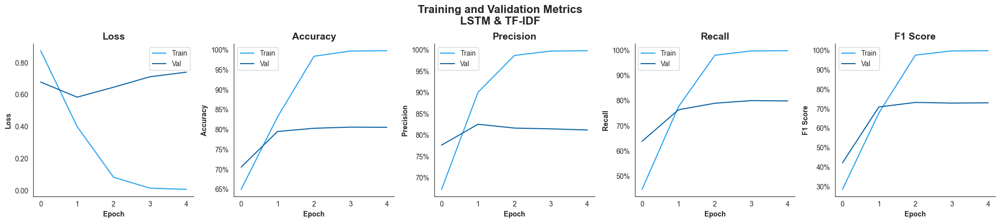

In [76]:
# Evaluate model
plot_metrics(history_tfidf.history, file_path=f"./ModelsEvaluation/LSTM/1_LSTM&TF-IDF_TrainingValidationMetrics.png", model_name="LSTM & TF-IDF")

**Note:** If we were to select this model, then we would stop training at the **`2nd epoch`** (`1` in the plot) to prevent **overfitting** (keeping the performance gap under $5\%$ between training and validation F1 Score (Macro)).

LSTM Classifier | TF-IDF

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.99      0.93      0.96      1082
 Bullish (1)       0.94      0.99      0.96      1442
 Neutral (2)       1.00      0.99      0.99      4633

    accuracy                           0.98      7157
   macro avg       0.97      0.97      0.97      7157
weighted avg       0.98      0.98      0.98      7157


AUROC: 1.0
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
-------------------------------------------------------------------

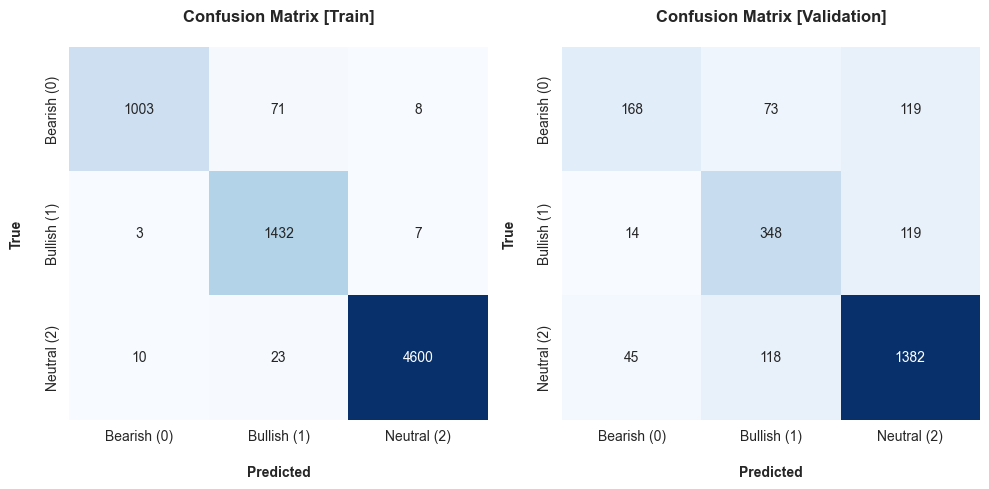

Classification Metrics | TF-IDF & LSTM Classifier Training Data 
 
 
 
 Time of Execution 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | TF-IDF 
 204.91 
 0.98 
 0.97 
 0.97 
 0.97 
 1.0 
 
 
 Validation Data 
 
 
 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | TF-IDF 
 0.8 
 0.75 
 0.69 
 0.71 
 0.89

In [77]:
# Classification Metrics
tfidf_lstm_train_results, tfidf_lstm_val_results = classification_metrics(
    'LSTM Classifier | TF-IDF',
    y_train, y_pred_train_tfidf,
    y_val, y_pred_val_tfidf,
    train_time_tfidf,
    y_pred_train_proba=y_pred_train_tfidf_proba,
    y_pred_val_proba=y_pred_val_tfidf_proba,
    classification_report_show=True
)

# Display results
display_side_by_side(
    pd.DataFrame(tfidf_lstm_train_results).T,
    pd.DataFrame(tfidf_lstm_val_results).T,
    titles=['Training Data', 'Validation Data'],
    super_title='Classification Metrics | TF-IDF & LSTM Classifier'
)

In [78]:
# Predict on test set
y_pred_test_tfidf_proba = lstm_tfidf.predict(X_test_tfidf.toarray(), batch_size=32)
y_pred_test_tfidf = np.argmax(y_pred_test_tfidf_proba, axis=1)

# Save the predictions to a CSV file
tfidf_lstm_predictions_df = pd.DataFrame({
    'id': tweets_test_data['id'],
    'label': y_pred_test_tfidf
})
tfidf_lstm_predictions_df.to_csv("./Predictions/1_LSTM&TF-IDF_TestPredictions.csv", index=False)

75/75 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step


---

### **LSTM with GloVe Features**

In [83]:
# Pad Sequences for LSTM input (since we are using embeddings)

# Get list with lengths of sentences
train_len = []
for i in X_train['text_clean'].apply(lambda x: str(x).split()):
    train_len.append(len(i))
    
# Find the maximum length of sentences in the training set
max_len_train = max(train_len)
print(f"\033[1mMaximum length of sentences in the training set: \033[0m{max_len_train}")

# Pad sequences to the maximum length
X_train_padded = pad_sequences(X_train_glove, maxlen=max_len_train, padding='post', truncating='post')
# We add dummy embedding at the end of each sentence so that they all have the same length

# Show the shape of the padded sequences
print(f"\033[1mShape of Padded Sequences for X_train_glove: \033[0m{X_train_padded.shape}")

Maximum length of sentences in the training set: 33
Shape of Padded Sequences for X_train_glove: (7157, 33, 200)


#### **🧪 Model Training**

In [84]:
(X_train_padded.shape[1], X_train_padded.shape[2])  # Shape after padding

(33, 200)

In [85]:
# ----------------------------------- [GloVe + LSTM] -----------------------------------
# Start the timer for execution time
start_time = time.time()

# Initialize the LSTM model with GloVe input shape
input_shape_glove = (X_train_padded.shape[1], X_train_padded.shape[2])  # Shape after padding
lstm_glove = LSTMModel(input_shape=input_shape_glove, lstm_units=64, dropout_rate=0.3, num_classes=3, padding=True)

# Compile the model with the specified optimizer, loss function, and metrics
optimizer = Adam(learning_rate=0.001, weight_decay=0.01, name="Optimizer")                                        # Adam for faster convergence
loss = CategoricalCrossentropy(name="Loss")                                                                       # Suitable for multi-class one-hot labels
metrics = [CategoricalAccuracy(name="accuracy"), Precision(name="precision"), Recall(name="recall"), F1Score(average="macro", name="f1_score"), AUC(name="auc")]
lstm_glove.compile(optimizer=optimizer, loss=loss, metrics=metrics)

# Define the callbacks for the model
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),                                         # Stop training if validation loss doesn't improve for 5 epochs
    CSVLogger(filename="./ModelsEvaluation/LSTM/LSTM&GloVe_training_log.csv", append=False, separator=','),                     # Log training history to a CSV file
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)                                        # Reduce learning rate if validation loss plateaus
]

# Train the model with the training data and validation data
history_glove = lstm_glove.fit(
    X_train_padded, y_train_ohe,
    validation_data=(pad_sequences(X_val_glove, maxlen=max_len_train, padding='post', truncating='post'), y_val_ohe),
    epochs=5,
    batch_size=64,
    callbacks=callbacks,
    verbose=1
)
# Calculate the execution time and print it
train_time_glove = time.time() - start_time
print(f"\033[1mExecution Time: \033[0m{train_time_glove:.2f} seconds ({str(datetime.timedelta(seconds=train_time_glove))} h)")

Epoch 1/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 30s 268ms/step - accuracy: 0.6310 - auc: 0.7512 - f1_score: 0.2795 - loss: 0.9163 - precision: 0.6330 - recall: 0.4963 - val_accuracy: 0.6781 - val_auc: 0.8389 - val_f1_score: 0.3765 - val_loss: 0.7748 - val_precision: 0.7271 - val_recall: 0.6119 - learning_rate: 0.0010
Epoch 2/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - accuracy: 0.6827 - auc: 0.8454 - f1_score: 0.4358 - loss: 0.7548 - precision: 0.7611 - recall: 0.5697 - val_accuracy: 0.7167 - val_auc: 0.8621 - val_f1_score: 0.5088 - val_loss: 0.7167 - val_precision: 0.7658 - val_recall: 0.6236 - learning_rate: 0.0010
Epoch 3/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - accuracy: 0.7210 - auc: 0.8739 - f1_score: 0.5555 - loss: 0.6862 - precision: 0.7874 - recall: 0.6230 - val_accuracy: 0.7213 - val_auc: 0.8666 - val_f1_score: 0.5255 - val_loss: 0.7090 - val_precision: 0.7623 - val_recall: 0.6572 - learning_rate: 0.0010
Epoch 4/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 31s 279ms/step - accuracy: 0.75

#### **📏 Model Evaluation**

224/224 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step


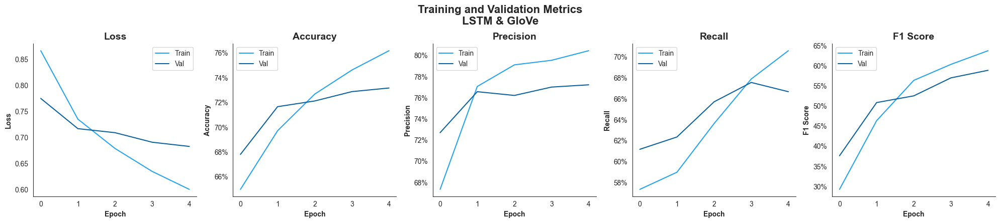

In [86]:
# Predict on training and validation sets
y_pred_train_glove_proba = lstm_glove.predict(X_train_padded, batch_size=32)
y_pred_val_glove_proba = lstm_glove.predict(pad_sequences(X_val_glove, maxlen=max_len_train, padding='post', truncating='post'), batch_size=32)
y_pred_train_glove = np.argmax(y_pred_train_glove_proba, axis=1)
y_pred_val_glove = np.argmax(y_pred_val_glove_proba, axis=1)

# Evaluate model
plot_metrics(history_glove.history, file_path=f"./ModelsEvaluation/LSTM/2_LSTM&GloVe_TrainingValidationMetrics.png", model_name="LSTM & GloVe")

**Note:** If we were to select this model, then we would stop training at the **`5th epoch`** to prevent **overfitting** (keeping the performance gap under $5\%$ between training and validation F1 Score (Macro)).

LSTM Classifier | GloVe

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.65      0.41      0.51      1082
 Bullish (1)       0.69      0.59      0.64      1442
 Neutral (2)       0.83      0.93      0.88      4633

    accuracy                           0.78      7157
   macro avg       0.72      0.65      0.67      7157
weighted avg       0.77      0.78      0.77      7157


AUROC: 0.89
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

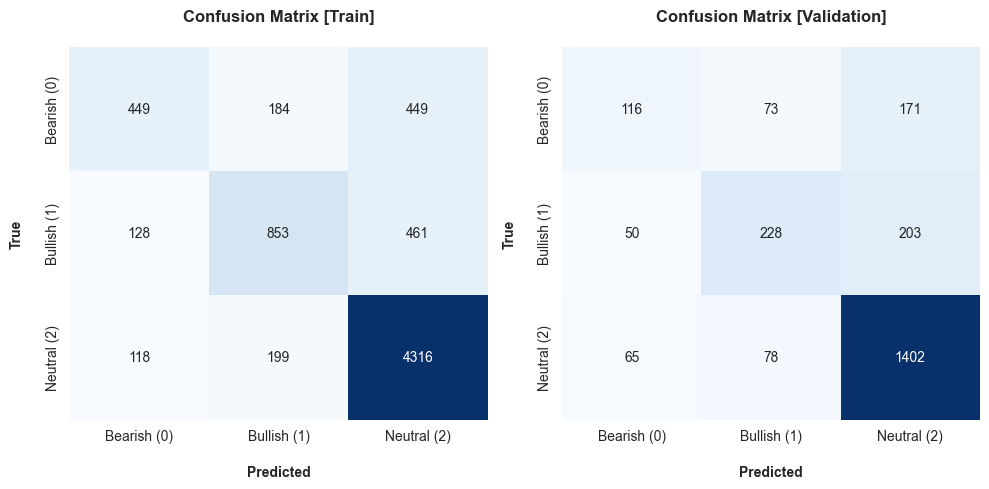

Classification Metrics | GloVe & LSTM Classifier Training Data 
 
 
 
 Time of Execution 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | GloVe 
 147.91 
 0.78 
 0.72 
 0.65 
 0.67 
 0.89 
 
 
 Validation Data 
 
 
 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | GloVe 
 0.73 
 0.63 
 0.57 
 0.59 
 0.81

In [87]:
# Classification Metrics
glove_lstm_train_results, glove_lstm_val_results = classification_metrics(
    'LSTM Classifier | GloVe',
    y_train, y_pred_train_glove,
    y_val, y_pred_val_glove,
    train_time_glove,
    y_pred_train_proba=y_pred_train_glove_proba,
    y_pred_val_proba=y_pred_val_glove_proba,
    classification_report_show=True
)

# Display results
display_side_by_side(
    pd.DataFrame(glove_lstm_train_results).T,
    pd.DataFrame(glove_lstm_val_results).T,
    titles=['Training Data', 'Validation Data'],
    super_title='Classification Metrics | GloVe & LSTM Classifier'
)

In [88]:
# Predict on test set
y_pred_test_glove_proba = lstm_glove.predict(pad_sequences(X_test_glove, maxlen=max_len_train, padding='post', truncating='post'), batch_size=32)
y_pred_test_glove = np.argmax(y_pred_test_glove_proba, axis=1)

# Save the predictions to a CSV file
glove_lstm_predictions_df = pd.DataFrame({
    'id': tweets_test_data['id'],
    'label': y_pred_test_glove
})
glove_lstm_predictions_df.to_csv("./Predictions/2_LSTM&GloVe_TestPredictions.csv", index=False)

75/75 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step


----

### **LSTM with Transformer-based Features ([DeBERTa V3 Base](https://huggingface.co/sileod/deberta-v3-base-tasksource-nli))**

- Since the output of the DeBERTa model is `(number_of_tweets, 768)`, where `768` is the embedding dimension, we already extracted the [CLS] token embedding for each tweet. This single vector, with a shape of `(768,)`, is a dense representation of the entire tweet's meaning. We have a single vector per tweet.
  - So, we will use this vector as input to the LSTM model and treat it as a sequence with a single timestep.

#### **🧪 Model Training**

In [89]:
X_train_deberta[0].shape[0]  # Check the shape of the DeBERTa embeddings

768

In [90]:
# ----------------------------------- [DeBERTa + LSTM] -----------------------------------
# Start the timer for execution time
start_time = time.time()

# Initialize the LSTM model with DeBERTa input shape
input_shape_deberta = (X_train_deberta[0].shape[0],)  # (768,)
lstm_deberta = LSTMModel(input_shape=input_shape_deberta, lstm_units=64, dropout_rate=0.3, num_classes=3, padding=False)

# Compile the model with the specified optimizer, loss function, and metrics
optimizer = Adam(learning_rate=0.001, weight_decay=0.01, name="Optimizer")                                        # Adam for faster convergence
loss = CategoricalCrossentropy(name="Loss")                                                                       # Suitable for multi-class one-hot labels
metrics = [CategoricalAccuracy(name="accuracy"), Precision(name="precision"), Recall(name="recall"), F1Score(average="macro", name="f1_score"), AUC(name="auc")]
lstm_deberta.compile(optimizer=optimizer, loss=loss, metrics=metrics)

# Define the callbacks for the model
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),                                         # Stop training if validation loss doesn't improve for 5 epochs
    CSVLogger(filename="./ModelsEvaluation/LSTM/LSTM&DeBERTa_training_log.csv", append=False, separator=','),                     # Log training history to a CSV file
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)                                        # Reduce learning rate if validation loss plateaus
]

# Train the model with the training data and validation data
history_deberta = lstm_deberta.fit(
    np.stack(X_train_deberta), y_train_ohe,
    validation_data=(np.stack(X_val_deberta), y_val_ohe),
    epochs=15,
    batch_size=64,
    callbacks=callbacks,
    verbose=1
)

# Calculate the execution time and print it
train_time_deberta = time.time() - start_time
print(f"\033[1mExecution Time: \033[0m{train_time_deberta:.2f} seconds ({str(datetime.timedelta(seconds=train_time_deberta))} h)")

Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - accuracy: 0.7388 - auc: 0.8843 - f1_score: 0.6625 - loss: 0.6162 - precision: 0.7869 - recall: 0.6590 - val_accuracy: 0.8328 - val_auc: 0.9528 - val_f1_score: 0.7885 - val_loss: 0.4144 - val_precision: 0.8434 - val_recall: 0.8219 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.8348 - auc: 0.9521 - f1_score: 0.7863 - loss: 0.4149 - precision: 0.8433 - recall: 0.8258 - val_accuracy: 0.8391 - val_auc: 0.9538 - val_f1_score: 0.8000 - val_loss: 0.4113 - val_precision: 0.8553 - val_recall: 0.8248 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.8466 - auc: 0.9588 - f1_score: 0.8033 - loss: 0.3870 - precision: 0.8577 - recall: 0.8362 - val_accuracy: 0.8399 - val_auc: 0.9573 - val_f1_score: 0.7931 - val_loss: 0.3918 - val_precision: 0.8482 - val_recall: 0.8315 - learning_rate: 0.0010
Epoch 4/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8547 -

#### **📏 Model Evaluation**

In [91]:
# Predict on training and validation sets
y_pred_train_deberta_proba = lstm_deberta.predict(np.stack(X_train_deberta), batch_size=32)
y_pred_val_deberta_proba = lstm_deberta.predict(np.stack(X_val_deberta), batch_size=32)
y_pred_train_deberta = np.argmax(y_pred_train_deberta_proba, axis=1)
y_pred_val_deberta = np.argmax(y_pred_val_deberta_proba, axis=1)

224/224 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


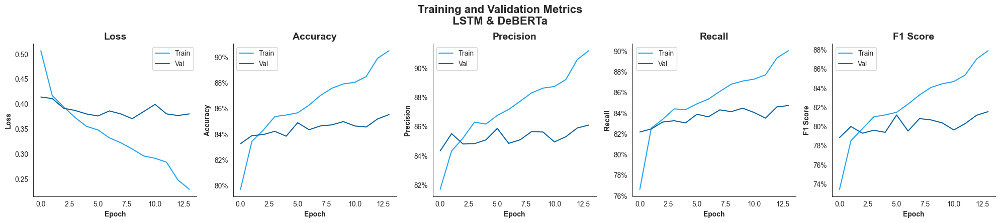

In [92]:
# Evaluate model
plot_metrics(history_deberta.history, file_path=f"./ModelsEvaluation/LSTM/3_LSTM&DeBERTa_TrainingValidationMetrics.png", model_name="LSTM & DeBERTa")   

**Note:** If we were to select this model, then we would stop training at the **`10th epoch`** to prevent **overfitting** (keeping the performance gap under $5\%$ between training and validation F1 Score (Macro)).

LSTM Classifier | DeBERTa

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.88      0.80      0.84      1082
 Bullish (1)       0.88      0.82      0.85      1442
 Neutral (2)       0.91      0.95      0.93      4633

    accuracy                           0.90      7157
   macro avg       0.89      0.86      0.87      7157
weighted avg       0.90      0.90      0.90      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

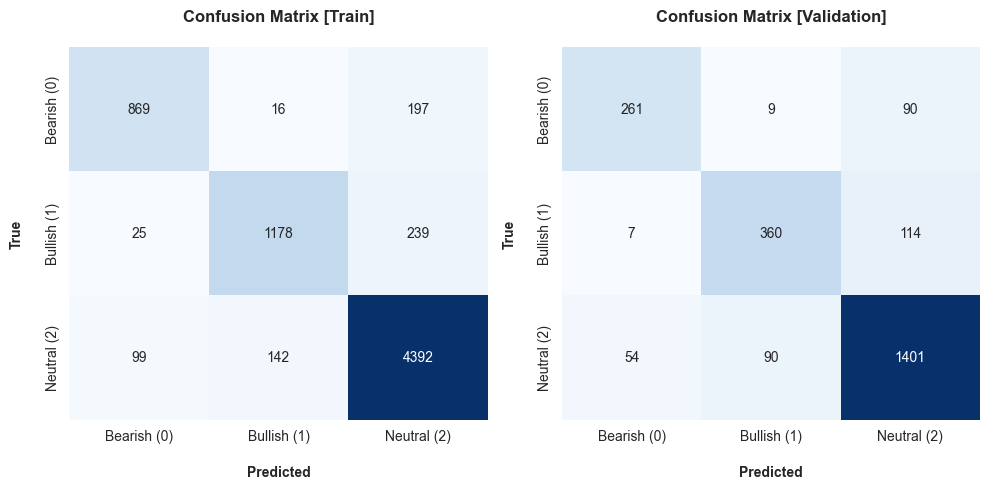

Classification Metrics | DeBERTa & LSTM Classifier Training Data 
 
 
 
 Time of Execution 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | DeBERTa 
 80.7 
 0.9 
 0.89 
 0.86 
 0.87 
 0.98 
 
 
 Validation Data 
 
 
 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | DeBERTa 
 0.85 
 0.82 
 0.79 
 0.81 
 0.95

In [93]:
# Classification Metrics
deberta_lstm_train_results, deberta_lstm_val_results = classification_metrics(
    'LSTM Classifier | DeBERTa',
    y_train, y_pred_train_deberta,
    y_val, y_pred_val_deberta,
    train_time_deberta,
    y_pred_train_proba=y_pred_train_deberta_proba,
    y_pred_val_proba=y_pred_val_deberta_proba,
    classification_report_show=True
)

# Display results
display_side_by_side(
    pd.DataFrame(deberta_lstm_train_results).T,
    pd.DataFrame(deberta_lstm_val_results).T,
    titles=['Training Data', 'Validation Data'],
    super_title='Classification Metrics | DeBERTa & LSTM Classifier'
)

In [94]:
# Predict on test set
y_pred_test_deberta_proba = lstm_deberta.predict(np.stack(X_test_deberta), batch_size=32)
y_pred_test_deberta = np.argmax(y_pred_test_deberta_proba, axis=1)

# Save the predictions to a CSV file
deberta_lstm_predictions_df = pd.DataFrame({
    'id': tweets_test_data['id'],
    'label': y_pred_test_deberta
})
deberta_lstm_predictions_df.to_csv("./Predictions/3_LSTM&DeBERTa_TestPredictions.csv", index=False)

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step


---

### **LSTM with Transformer-based Features ([FinTwitBERT-sentiment](https://huggingface.co/StephanAkkerman/FinTwitBERT-sentiment))**

- Same logic as the previous model, but using the FinTwitBERT model to obtain the embeddings.

#### **🧪 Model Training**

In [95]:
# ----------------------------------- [FinTwitBERT + LSTM] -----------------------------------
# Start the timer for execution time
start_time = time.time()

# Initialize the LSTM model with FinTwitBERT input shape
input_shape_FinTwitBERT = (X_train_FinTwitBERT[0].shape[0],)  # (768,)
lstm_FinTwitBERT = LSTMModel(input_shape=input_shape_FinTwitBERT, lstm_units=64, dropout_rate=0.3, num_classes=3, padding=False)

# Compile the model with the specified optimizer, loss function, and metrics
optimizer = Adam(learning_rate=0.001, weight_decay=0.01, name="Optimizer")                                        # Adam for faster convergence
loss = CategoricalCrossentropy(name="Loss")                                                                       # Suitable for multi-class one-hot labels
metrics = [CategoricalAccuracy(name="accuracy"), Precision(name="precision"), Recall(name="recall"), F1Score(average="macro", name="f1_score"), AUC(name="auc")]
lstm_FinTwitBERT.compile(optimizer=optimizer, loss=loss, metrics=metrics)

# Define the callbacks for the model
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),                                         # Stop training if validation loss doesn't improve for 5 epochs
    CSVLogger(filename="./ModelsEvaluation/LSTM/LSTM&FinTwitBERT_training_log.csv", append=False, separator=','),                # Log training history to a CSV file
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)                                        # Reduce learning rate if validation loss plateaus
]

# Train the model with the training data and validation data
history_FinTwitBERT = lstm_FinTwitBERT.fit(
    np.stack(X_train_FinTwitBERT), y_train_ohe,
    validation_data=(np.stack(X_val_FinTwitBERT), y_val_ohe),
    epochs=15,
    batch_size=64,
    callbacks=callbacks,
    verbose=1
)

# Calculate the execution time and print it
train_time_FinTwitBERT = time.time() - start_time
print(f"\033[1mExecution Time: \033[0m{train_time_FinTwitBERT:.2f} seconds ({str(datetime.timedelta(seconds=train_time_FinTwitBERT))} h)")

Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.8279 - auc: 0.9416 - f1_score: 0.7716 - loss: 0.4389 - precision: 0.8701 - recall: 0.7592 - val_accuracy: 0.8990 - val_auc: 0.9798 - val_f1_score: 0.8682 - val_loss: 0.2721 - val_precision: 0.9050 - val_recall: 0.8944 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.8990 - auc: 0.9789 - f1_score: 0.8704 - loss: 0.2729 - precision: 0.9060 - recall: 0.8918 - val_accuracy: 0.8952 - val_auc: 0.9800 - val_f1_score: 0.8637 - val_loss: 0.2730 - val_precision: 0.9019 - val_recall: 0.8902 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.9087 - auc: 0.9849 - f1_score: 0.8786 - loss: 0.2332 - precision: 0.9166 - recall: 0.9026 - val_accuracy: 0.8986 - val_auc: 0.9816 - val_f1_score: 0.8682 - val_loss: 0.2586 - val_precision: 0.9077 - val_recall: 0.8898 - learning_rate: 0.0010
Epoch 4/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.9279 -

#### **📏 Model Evaluation**

In [96]:
# Predict on training and validation sets
y_pred_train_FinTwitBERT_proba = lstm_FinTwitBERT.predict(np.stack(X_train_FinTwitBERT), batch_size=32)
y_pred_val_FinTwitBERT_proba = lstm_FinTwitBERT.predict(np.stack(X_val_FinTwitBERT), batch_size=32)
y_pred_train_FinTwitBERT = np.argmax(y_pred_train_FinTwitBERT_proba, axis=1)
y_pred_val_FinTwitBERT = np.argmax(y_pred_val_FinTwitBERT_proba, axis=1)

224/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


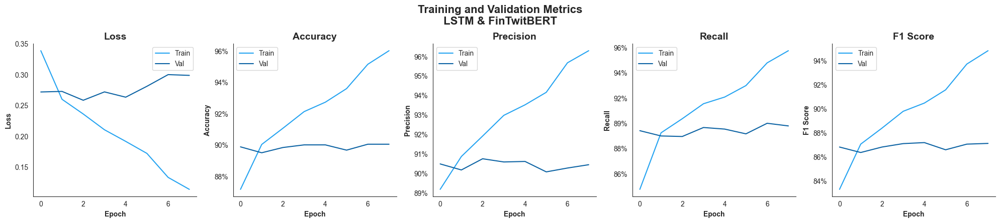

In [97]:
# Evaluate model
plot_metrics(history_FinTwitBERT.history, file_path=f"./ModelsEvaluation/LSTM/4_LSTM&FinTwitBERT_TrainingValidationMetrics.png", model_name="LSTM & FinTwitBERT")

**Note:** If we were to select this model, then we would stop training at the **`6th epoch`** to prevent **overfitting** (keeping the performance gap under $5\%$ between training and validation F1 Score (Macro)).

LSTM Classifier | FinTwitBERT

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.88      0.89      1082
 Bullish (1)       0.90      0.89      0.89      1442
 Neutral (2)       0.95      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.91      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

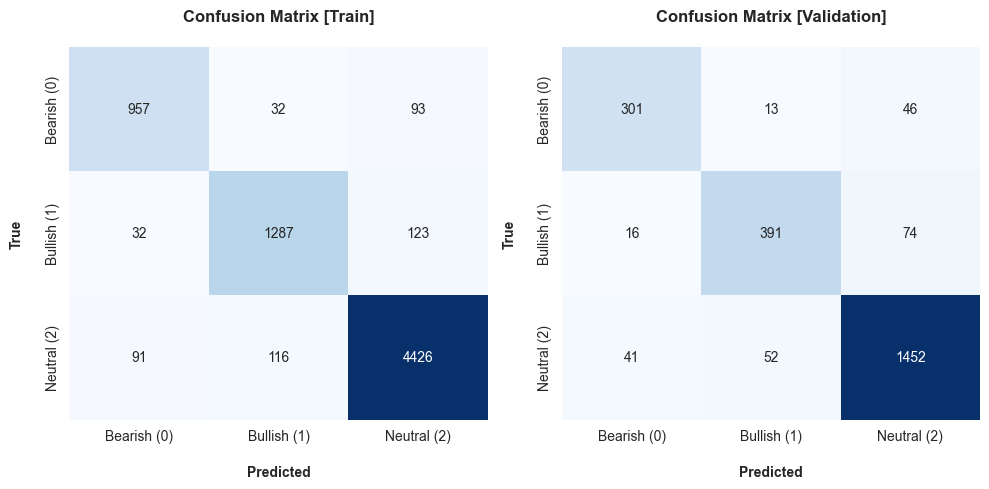

Classification Metrics | FinTwitBERT & LSTM Classifier Training Data 
 
 
 
 Time of Execution 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | FinTwitBERT 
 39.48 
 0.93 
 0.91 
 0.91 
 0.91 
 0.99 
 
 
 Validation Data 
 
 
 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 LSTM Classifier | FinTwitBERT 
 0.9 
 0.87 
 0.86 
 0.87 
 0.98

In [98]:
# Classification Metrics
FinTwitBERT_lstm_train_results, FinTwitBERT_lstm_val_results = classification_metrics(
    'LSTM Classifier | FinTwitBERT',
    y_train, y_pred_train_FinTwitBERT,
    y_val, y_pred_val_FinTwitBERT,
    train_time_FinTwitBERT,
    y_pred_train_proba=y_pred_train_FinTwitBERT_proba,
    y_pred_val_proba=y_pred_val_FinTwitBERT_proba,
    classification_report_show=True
)

# Display results
display_side_by_side(
    pd.DataFrame(FinTwitBERT_lstm_train_results).T,
    pd.DataFrame(FinTwitBERT_lstm_val_results).T,
    titles=['Training Data', 'Validation Data'],
    super_title='Classification Metrics | FinTwitBERT & LSTM Classifier'
)

In [99]:
# Predict on test set
y_pred_test_FinTwitBERT_proba = lstm_FinTwitBERT.predict(np.stack(X_test_FinTwitBERT), batch_size=32)
y_pred_test_FinTwitBERT = np.argmax(y_pred_test_FinTwitBERT_proba, axis=1)

# Save the predictions to a CSV file
FinTwitBERT_lstm_predictions_df = pd.DataFrame({
    'id': tweets_test_data['id'],
    'label': y_pred_test_FinTwitBERT
})
FinTwitBERT_lstm_predictions_df.to_csv("./Predictions/4_LSTM&FinTwitBERT_TestPredictions.csv", index=False)

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


## <span style="color: #ffffff;">[EXTRA 1 & 2] Transformer-based Encoder</span>
<br>
<style>
@import url('https://fonts.cdnfonts.com/css/avenir-next-lt-pro?styles=29974');
</style>

<div style="background: transparent;
            padding: 10px; color: white; border-radius: 300px; text-align: center;
            border: 2px solid #0B62A3;">
    <center><h2 style="margin-left: 120px;margin-top: 10px; margin-bottom: 4px; color: #0B62A3;
                       font-size: 24px; font-family: 'Avenir Next LT Pro', sans-serif;"><b> [EXTRA 1 & 2] Transformer-based Encoder</b></h2></center>
</div>

### **🟡 HuggingFace [FinTwitBERT-sentiment](https://huggingface.co/StephanAkkerman/FinTwitBERT-sentiment) Model**

In [102]:
# Define the classification pipeline
FinTwitBERT_model_path = "StephanAkkerman/FinTwitBERT-sentiment"
FinTwitBERT_model_classifier = pipeline("sentiment-analysis", model=FinTwitBERT_model_path, device=device)

# Define the classification function
# Source: https://huggingface.co/StephanAkkerman/FinTwitBERT-sentiment#usage
def FinTwitBERT_classify_sentiment(text):
    """
    Classifies a piece of text using FinTwitBERT and returns (label, score, probabilities).
    
    Args:
        text (str or list of str): The text(s) to classify.
            - If a single string is provided, it will be classified as a single instance.
            - If a list of strings is provided, each string will be classified separately.
                
    Returns:
        tuple: A tuple containing the label, score, and probabilities of the classification.
            - label (str): The predicted sentiment label (e.g., "Bearish", "Bullish", "Neutral").
            - score (float): The confidence score of the prediction.
            - probs (list): List of probabilities for each class [Neutral, Bullish, Bearish].
    """
    
    # Perform classification using the FinTwitBERT model
    outputs = FinTwitBERT_model_classifier(text, 
                                           return_all_scores=True)        # returns a list: [{'label': ..., 'score': ...}] 
    # print(outputs)                                                      # Debugging: Check the output format
    
    # Extract the list of label-score dicts
    result = outputs[0]                                 # Result is a list of dicts
    
    # Extract the highest scoring label and its score (top prediction)
    top_result = max(result, key=lambda x: x['score'])
    
    # Extract label, score of the top prediction
    label = top_result['label']                         # e.g., "Bearish", "Bullish", "Neutral"
    score = top_result['score']                         # Confidence score of the top prediction                     
    
    # Extract probabilities for each class in the order [Neutral, Bullish, Bearish]
    label_scores = {entry['label']: entry['score'] for entry in result}
    fixed_order_labels = ['NEUTRAL', 'BULLISH', 'BEARISH']         # Fixed order of labels
    probs = [label_scores[label] for label in fixed_order_labels]  # Probabilities in the correct order

    return label, score, probs

# Example usage of the classification function
sample_tweet = "📈 $AAPL looks bullish! Going to the moon! 🚀 Check out https://example.com @analyst predicts #stocks UP! It's amazing!!!"
label, score, proba = FinTwitBERT_classify_sentiment(sample_tweet)
print(f"\033[1mLabel:\033[0m {label}, \033[1mScore:\033[0m {score:.2f}, \033[1mProbabilities:\033[0m {proba}")

Label: BULLISH, Score: 1.00, Probabilities: [0.0002983910671900958, 0.9994373917579651, 0.00026423457893542945]


In [103]:
# ----------------------------------- [FinTwitBERT] -----------------------------------
# Start the timer for execution time
start_time = time.time()

# Apply the FinTwitBERT classification function to the 'text' column in the train corpus with tqdm
train_predictions = [
    FinTwitBERT_classify_sentiment(txt)
    for txt in tqdm(X_train['text'], desc="Predicting Train (FinTwitBERT)", unit=" tweet")
]
X_train['label_FinTwitBERT_str'], X_train['FinTwitBERT_score_pred'], X_train['FinTwitBERT_probs'] = zip(*train_predictions)

# Apply the FinTwitBERT classification function to the 'text' column in the validation corpus with tqdm
val_predictions = [
    FinTwitBERT_classify_sentiment(txt)
    for txt in tqdm(X_val['text'], desc="Predicting Validation (FinTwitBERT)", unit=" tweet")
]
X_val['label_FinTwitBERT_str'], X_val['FinTwitBERT_score_pred'], X_val['FinTwitBERT_probs'] = zip(*val_predictions)

# Apply the FinTwitBERT classification function to the 'text' column in the test corpus with tqdm
test_predictions = [
    FinTwitBERT_classify_sentiment(txt)
    for txt in tqdm(tweets_test_data['text'], desc="Predicting Test (FinTwitBERT)", unit=" tweet")
]
tweets_test_data['label_FinTwitBERT_str'], tweets_test_data['FinTwitBERT_score_pred'], tweets_test_data['FinTwitBERT_probs'] = zip(*test_predictions)

# Calculate the execution time and print it
train_time_FinTwitBERT = time.time() - start_time
print(f"\033[1mExecution Time: \033[0m{train_time_FinTwitBERT:.2f} seconds ({str(datetime.timedelta(seconds=train_time_FinTwitBERT))} h)")

Predicting Train (FinTwitBERT):   0%|          | 0/7157 [00:00<?, ? tweet/s]

Predicting Test (FinTwitBERT): 100%|██████████| 2388/2388 [02:05<00:00, 19.00 tweet/s]

Execution Time: 718.47 seconds (0:11:58.474114 h)


#### **📏 Model Evaluation**

In [104]:
# Absolute and Relative Frequencies of sentiment labels in the train/val/test dataset
pd.DataFrame({
    "n | Train": X_train['label_FinTwitBERT_str'].value_counts(),
    "% | Train": round(X_train['label_FinTwitBERT_str'].value_counts(normalize=True) * 100, 1),
    "n | Validation": X_val['label_FinTwitBERT_str'].value_counts(),
    "% | Validation": round(X_val['label_FinTwitBERT_str'].value_counts(normalize=True) * 100, 1),
    "n | Test": tweets_test_data['label_FinTwitBERT_str'].value_counts(),
    "% | Test": round(tweets_test_data['label_FinTwitBERT_str'].value_counts(normalize=True) * 100, 1)
})

,n | Train,% | Train,n | Validation,% | Validation,n | Test,% | Test
label_FinTwitBERT_str,,,,,,
NEUTRAL,3988,55.7,1336,56.0,1305,54.6
BULLISH,1753,24.5,582,24.4,606,25.4
BEARISH,1416,19.8,468,19.6,477,20.0


FinTwitBERT | Original Text

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.69      0.90      0.78      1082
 Bullish (1)       0.69      0.84      0.76      1442
 Neutral (2)       0.95      0.81      0.87      4633

    accuracy                           0.83      7157
   macro avg       0.77      0.85      0.80      7157
weighted avg       0.86      0.83      0.84      7157


AUROC: 0.83
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

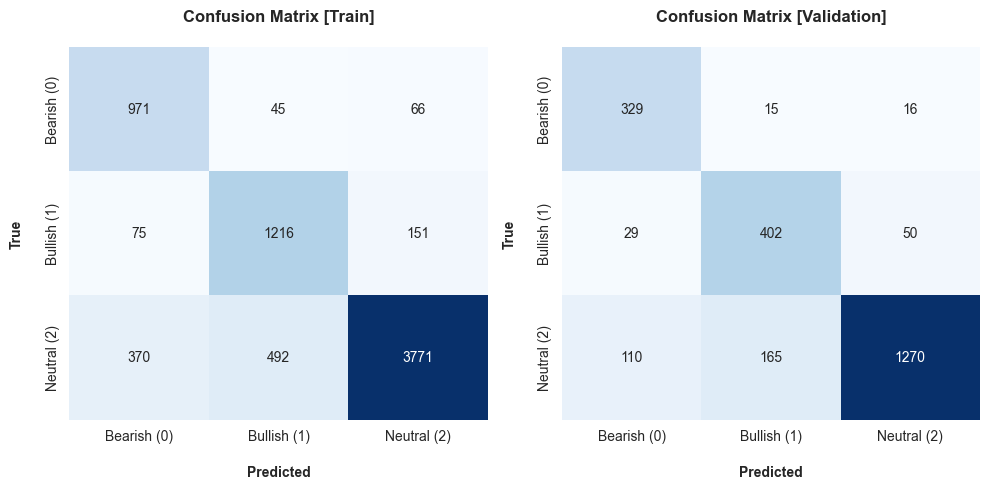

Classification Metrics | FinTwitBERT Classifier Training Data 
 
 
 
 Time of Execution 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 FinTwitBERT | Original Text 
 718.47 
 0.83 
 0.77 
 0.85 
 0.8 
 0.83 
 
 
 Validation Data 
 
 
 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 FinTwitBERT | Original Text 
 0.84 
 0.78 
 0.86 
 0.81 
 0.82

In [105]:
# Extract probabilities for AUROC calculation
# Convert probabilities to numpy array with shape (n_samples, n_classes)
y_pred_train_proba_FinTwitBERT_proba  = np.array(list(X_train['FinTwitBERT_probs']))  # Train probabilities
y_pred_val_proba_FinTwitBERT_proba    = np.array(list(X_val['FinTwitBERT_probs']))    # Validation probabilities

# Convert string labels to numerical labels for classification metrics
FinTwitBERT_labels_to_numeric = {'BEARISH': 0, 'BULLISH': 1, 'NEUTRAL': 2}  # Define mapping for FinTwitBERT

X_train['label_FinTwitBERT'] = X_train['label_FinTwitBERT_str'].map(FinTwitBERT_labels_to_numeric)                    # Train labels
X_val['label_FinTwitBERT'] = X_val['label_FinTwitBERT_str'].map(FinTwitBERT_labels_to_numeric)                        # Validation labels
tweets_test_data['label_FinTwitBERT'] = tweets_test_data['label_FinTwitBERT_str'].map(FinTwitBERT_labels_to_numeric)  # Test labels

# Get the true labels for train and validation sets
y_pred_train_FinTwitBERT = X_train['label_FinTwitBERT'].values                                                        # Train predictions
y_pred_val_FinTwitBERT = X_val['label_FinTwitBERT'].values                                                            # Validation predictions

# Classification Metrics for FinTwitBERT
FinTwitBERT_train_results, FinTwitBERT_val_results = classification_metrics(
    'FinTwitBERT | Original Text',
    y_train, y_pred_train_FinTwitBERT,                        # Train true/pred (numerical)
    y_val, y_pred_val_FinTwitBERT,                            # Val true/pred (numerical)
    train_time_FinTwitBERT,                                   # Execution time
    y_pred_train_proba=y_pred_train_proba_FinTwitBERT_proba,  # Train probabilities
    y_pred_val_proba=y_pred_val_proba_FinTwitBERT_proba,      # Validation probabilities
    classification_report_show=True
)

# Display results
display_side_by_side(
    pd.DataFrame(FinTwitBERT_train_results).T,
    pd.DataFrame(FinTwitBERT_val_results).T,
    titles=['Training Data', 'Validation Data'],
    super_title='Classification Metrics | FinTwitBERT Classifier'
)

In [106]:
# Save the predictions to a CSV file
FinTwitBERT_predictions_df = pd.DataFrame({
    'id': tweets_test_data['id'],
    'label': tweets_test_data['label_FinTwitBERT']
})
FinTwitBERT_predictions_df.to_csv('./Predictions/5_FinTwitBERT_TestPredictions.csv', index=False)

---

### **🟡 HuggingFace [DeBERTa-v3-base](https://huggingface.co/sileod/deberta-v3-base-tasksource-nli)** (Zero-Shot Classification)

In [93]:
# Define the classification pipeline
deberta_model_path = "sileod/deberta-v3-base-tasksource-nli"
deberta_model_classifier = pipeline("zero-shot-classification", model=deberta_model_path, tokenizer=deberta_model_path, device=device)

# Define the classification function
# Source: https://huggingface.co/sileod/deberta-v3-base-tasksource-nli#zs-zero-shot-classification-pipeline
def DeBERTaV3_classify_sentiment(text):
    """
    Classifies a piece of text using DeBERTaV3 and returns (label, score).
    
    Args:
        text (str or list of str): The text(s) to classify.
            - If a single string is provided, it will be classified as a single instance.
            - If a list of strings is provided, each string will be classified separately.
                
    Returns:
        tuple: A tuple containing the label, score and probabilities of the classification.
            - label (str): The predicted sentiment label (e.g., "Bearish", "Bullish", "Neutral").
            - score (float): The confidence score of the prediction.
            - probs (list): List of probabilities for each class [Neutral, Bullish, Bearish].
    """
    # List of candidate labels for classification
    candidate_labels = ["Bearish", "Bullish", "Neutral"]
    
    # Perform zero-shot classification using the model
    outputs = deberta_model_classifier(text,                                   # text to classify 
                                       candidate_labels,                       # candidate labels for classification
                                       return_all_scores=True,                 # return scores for all candidate labels
                                       )                                       
    # print(outputs)                                                           # Debugging: Check the output format
                                                                               # returns a dict: {'sequence': "...", 
                                                                               #                  'labels': ['Bullish', 'Neutral', 'Bearish'], 
                                                                               #                  'scores': [... ,... ,...]}
                                                                               
    # Extract all candidate labels and their scores
    label_scores = dict(zip(outputs['labels'], outputs['scores']))
    
    # Note: The outputs['labels'] is a list of candidate labels sorted by their scores
    top_label = outputs['labels'][0]  # The label with the highest score
    top_score = outputs['scores'][0]  # The score of the top label
    
    # Extract probabilities for each class in the order (we need to ensure fixed label order for probabilities)
    fixed_order_probs = [label_scores[label] for label in candidate_labels]  # Extract probabilities in order ['Bearish', 'Bullish', 'Neutral']
       
    return top_label, top_score, fixed_order_probs

# Example usage of the classification function
sample_tweet = "📈 $AAPL looks bullish! Going to the moon! 🚀 Check out https://example.com @analyst predicts #stocks UP! It's amazing!!!"
label, score, proba = DeBERTaV3_classify_sentiment(sample_tweet)
print(f"\033[1mLabel:\033[0m {label}, \033[1mScore:\033[0m {score:.2f}, \033[1mProbabilities:\033[0m {proba}")

Label: Bullish, Score: 0.94, Probabilities: [0.023676013574004173, 0.9388348460197449, 0.0374891571700573]


In [97]:
# ----------------------------------- [DeBERTaV3] -----------------------------------
# Start the timer for execution time
start_time = time.time()

# Apply the DeBERTaV3 classification function to the 'text' column in the train corpus with tqdm
train_predictions = [
    DeBERTaV3_classify_sentiment(txt)
    for txt in tqdm(X_train['text'], desc="Predicting Train (DeBERTaV3)", unit=" tweet")
]
# Predicting Train (DeBERTaV3): 100%|██████████| 7157/7157 [39:11<00:00,  3.04 tweet/s] 

X_train['label_DeBERTaV3_str'], X_train['DeBERTaV3_score_pred'], X_train['DeBERTaV3_probs'] = zip(*train_predictions)

# Apply the DeBERTaV3 classification function to the 'text' column in the validation corpus with tqdm
val_predictions = [
    DeBERTaV3_classify_sentiment(txt)
    for txt in tqdm(X_val['text'], desc="Predicting Validation (DeBERTaV3)", unit=" tweet")
]
X_val['label_DeBERTaV3_str'], X_val['DeBERTaV3_score_pred'], X_val['DeBERTaV3_probs'] = zip(*val_predictions)

# Apply the DeBERTaV3 classification function to the 'text' column in the test corpus with tqdm
test_predictions = [
    DeBERTaV3_classify_sentiment(txt)
    for txt in tqdm(tweets_test_data['text'], desc="Predicting Test (DeBERTaV3)", unit=" tweet")
]
tweets_test_data['label_DeBERTaV3_str'], tweets_test_data['DeBERTaV3_score_pred'], tweets_test_data['DeBERTaV3_probs'] = zip(*test_predictions)

# Calculate the execution time and print it
train_time_DeBERTaV3 = time.time() - start_time
print(f"\033[1mExecution Time: \033[0m{train_time_DeBERTaV3:.2f} seconds ({str(datetime.timedelta(seconds=train_time_DeBERTaV3))} h)")

Predicting Test (DeBERTaV3): 100%|██████████| 2388/2388 [16:54<00:00,  2.35 tweet/s]

Execution Time: 1868.60 seconds (0:31:08.596360 h)


#### **📏 Model Evaluation**

In [98]:
# Absolute and Relative Frequencies of sentiment labels in the train/val/test dataset
pd.DataFrame({
    "n | Train": X_train['label_DeBERTaV3_str'].value_counts(),
    "% | Train": round(X_train['label_DeBERTaV3_str'].value_counts(normalize=True) * 100, 1),
    "n | Validation": X_val['label_DeBERTaV3_str'].value_counts(),
    "% | Validation": round(X_val['label_DeBERTaV3_str'].value_counts(normalize=True) * 100, 1),
    "n | Test": tweets_test_data['label_DeBERTaV3_str'].value_counts(),
    "% | Test": round(tweets_test_data['label_DeBERTaV3_str'].value_counts(normalize=True) * 100, 1)
})

,n | Train,% | Train,n | Validation,% | Validation,n | Test,% | Test
label_DeBERTaV3_str,,,,,,
Bullish,3290,46.0,1105,46.3,1102,46.1
Bearish,2076,29.0,670,28.1,677,28.4
Neutral,1791,25.0,611,25.6,609,25.5


DeBERTaV3 | Original Text

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.44      0.85      0.58      1082
 Bullish (1)       0.40      0.92      0.56      1442
 Neutral (2)       0.89      0.34      0.50      4633

    accuracy                           0.54      7157
   macro avg       0.58      0.70      0.55      7157
weighted avg       0.72      0.54      0.52      7157


AUROC: 0.87
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

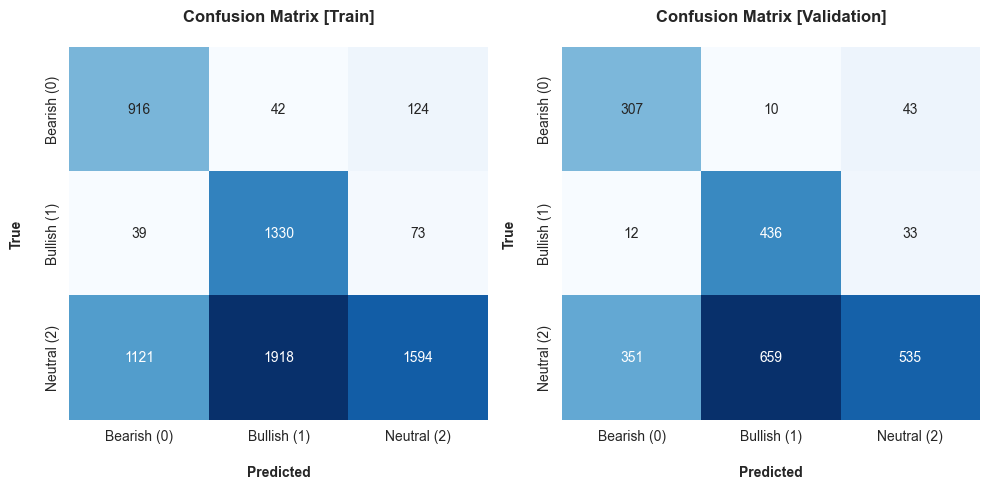

Classification Metrics | DeBERTaV3 Classifier Training Data 
 
 
 
 Time of Execution 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 DeBERTaV3 | Original Text 
 1868.6 
 0.54 
 0.58 
 0.7 
 0.55 
 0.87 
 
 
 Validation Data 
 
 
 
 Accuracy 
 Precision 
 Recall 
 F1 Score (Macro) 
 AUROC 
 
 
 
 
 DeBERTaV3 | Original Text 
 0.54 
 0.58 
 0.7 
 0.55 
 0.85

In [99]:
# Convert string labels to numerical labels for classification metrics
DeBERTaV3_labels_to_numeric = {'Bearish': 0, 'Bullish': 1, 'Neutral': 2}  # Define mapping for DeBERTaV3

# Map string labels to numerical labels for train, validation, and test sets
X_train['label_DeBERTaV3'] = X_train['label_DeBERTaV3_str'].map(DeBERTaV3_labels_to_numeric)                    # Train labels
X_val['label_DeBERTaV3'] = X_val['label_DeBERTaV3_str'].map(DeBERTaV3_labels_to_numeric)                        # Validation labels
tweets_test_data['label_DeBERTaV3'] = tweets_test_data['label_DeBERTaV3_str'].map(DeBERTaV3_labels_to_numeric)  # Test labels

# Get the true labels for train and validation sets
y_pred_train_DeBERTaV3 = X_train['label_DeBERTaV3'].values                                # Train predictions
y_pred_val_DeBERTaV3 = X_val['label_DeBERTaV3'].values                                    # Validation predictions

# Extract probabilities for AUROC calculation
# Convert probabilities to numpy array with shape (n_samples, n_classes)
y_pred_train_proba_DeBERTaV3 = np.array(list(X_train['DeBERTaV3_probs']))
y_pred_val_proba_DeBERTaV3 = np.array(list(X_val['DeBERTaV3_probs']))


# Classification Metrics for DeBERTaV3
DeBERTaV3_train_results, DeBERTaV3_val_results = classification_metrics(
    'DeBERTaV3 | Original Text',
    y_train, y_pred_train_DeBERTaV3, # Train true/pred (numerical)
    y_val, y_pred_val_DeBERTaV3,     # Val true/pred (numerical)
    train_time_DeBERTaV3,            # Execution time

    y_pred_train_proba=y_pred_train_proba_DeBERTaV3,  # Train probabilities (for AUROC)
    y_pred_val_proba=y_pred_val_proba_DeBERTaV3,      # Val probabilities (for AUROC)
    classification_report_show=True
)

# Display results
display_side_by_side(
    pd.DataFrame(DeBERTaV3_train_results).T,
    pd.DataFrame(DeBERTaV3_val_results).T,
    titles=['Training Data', 'Validation Data'],
    super_title='Classification Metrics | DeBERTaV3 Classifier'
)

In [100]:
# Save the predictions to a CSV file
DeBERTaV3_predictions_df = pd.DataFrame({
    'id': tweets_test_data['id'],
    'label': tweets_test_data['label_DeBERTaV3']
})
DeBERTaV3_predictions_df.to_csv("./Predictions/6_DeBERTaV3_TestPredictions.csv", index=False)

## <span style="color: #ffffff;">[EXTRA] Transformer-based Decoder</span>

<br>
<style>
@import url('https://fonts.cdnfonts.com/css/avenir-next-lt-pro?styles=29974');
</style>

<div style="background: transparent;
            padding: 10px; color: white; border-radius: 300px; text-align: center;
            border: 2px solid #000000;">
    <center><h2 style="margin-left: 120px;margin-top: 10px; margin-bottom: 4px; color: #000000;
                       font-size: 24px; font-family: 'Avenir Next LT Pro', sans-serif;"><b> [EXTRA] Transformer-based Decoder</b></h2></center> 
</div>

- Given the complexity and computational demands of the `Decoder` model, it was necessary to run the model and its respective tests on Google Colab. The primary reason for this decision is the lack of sufficient GPU support on our local PCs. Google Colab provides the necessary computational resources, including powerful GPUs, which are essential for efficiently training and testing complex models like the `Decoder`.
    - By utilizing Google Colab, we ensure that the model can be executed in an environment that meets its hardware requirements, thereby facilitating accurate and timely results. Consequently, the code and tests associated with the `Decoder` model are contained within a separate notebook [tm_tests_02_37.ipynb](./tm_tests_02_37.ipynb).


---

## **🚀 Hyperparameter Tuning** (LSTM with FinTwitBERT-sentiment)

In [56]:
# Create directories for saving model logs, and predictions
os.makedirs("./ModelsEvaluation/LSTM_FinTwitBERT_FineTune", exist_ok=True)
os.makedirs("./Predictions/LSTM_FinTwitBERT_FineTune", exist_ok=True)

In [57]:
# Define hyperparameter combinations
batch_sizes = [32, 64, 128]
lstm_units_list = [16, 32, 64, 128]
dropout_rates = [0.1, 0.3, 0.5]
hyperparameter_combinations = list(product(batch_sizes, lstm_units_list, dropout_rates))

print(f"\033[1mTotal Hyperparameter Combinations: \033[0m{len(hyperparameter_combinations)}")

Total Hyperparameter Combinations: 36


In [58]:
# Initialize dictionaries to store results
all_train_results = {}
all_val_results = {}

In [ ]:
# Function to train and evaluate the LSTM model for a given hyperparameter combination
def train_and_evaluate_lstm(batch_size, lstm_units, dropout_rate, X_train, y_train_ohe, X_val, y_val_ohe, X_test, tweets_test_data):
    """
    Train and evaluate the LSTM model with specified hyperparameters.

    Args:
        batch_size (int): Batch size for training.
        lstm_units (int): Number of LSTM units.
        dropout_rate (float): Dropout rate for regularization.
        X_train (np.array): Training data (FinTwitBERT embeddings).
        y_train_ohe (np.array): One-hot encoded training labels.
        X_val (np.array): Validation data (FinTwitBERT embeddings).
        y_val_ohe (np.array): One-hot encoded validation labels.
        X_test (np.array): Test data (FinTwitBERT embeddings).
        tweets_test_data (pd.DataFrame): Test dataset with 'id' column.

    Returns:
        tuple: Training and validation results dictionaries, and test predictions DataFrame.
    """
    # Model name for logging and saving
    model_name = f"LSTM_FinTwitBERT_b{batch_size}_u{lstm_units}_d{dropout_rate}"
    
    # Start timer
    start_time = time.time()

    # Initialize the LSTM model
    input_shape = (X_train.shape[1],)  # (768,) for FinTwitBERT embeddings
    lstm_model = LSTMModel(input_shape=input_shape, lstm_units=lstm_units, dropout_rate=dropout_rate, num_classes=3, padding=False)

    # Compile the model
    optimizer = Adam(learning_rate=0.001, weight_decay=0.01, name="Optimizer")
    loss = CategoricalCrossentropy(name="Loss")
    metrics = [
        CategoricalAccuracy(name="accuracy"),
        Precision(name="precision"),
        Recall(name="recall"),
        F1Score(average="macro", name="f1_score"),
        AUC(name="auc")
    ]
    lstm_model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

    # Define callbacks
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        CSVLogger(filename=f"./ModelsEvaluation/LSTM_FinTwitBERT_FineTune/{model_name}_training_log.csv", append=False, separator=','),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
    ]

    # Train the model
    history = lstm_model.fit(
        X_train, y_train_ohe,
        validation_data=(X_val, y_val_ohe),
        epochs=15,
        batch_size=batch_size,
        callbacks=callbacks,
        verbose=1
    )

    # Calculate execution time
    train_time = time.time() - start_time
    print(f"\033[1mExecution Time for {model_name}: \033[0m{train_time:.2f} seconds ({str(datetime.timedelta(seconds=train_time))} h)")

    # Predict on training and validation sets
    y_pred_train_proba = lstm_model.predict(X_train, batch_size=batch_size)
    y_pred_val_proba = lstm_model.predict(X_val, batch_size=batch_size)
    y_pred_train = np.argmax(y_pred_train_proba, axis=1)
    y_pred_val = np.argmax(y_pred_val_proba, axis=1)

    # Evaluate model
    plot_metrics(history.history, file_path=f"./ModelsEvaluation/LSTM_FinTwitBERT_FineTune/{model_name}_TrainingValidationMetrics.png", model_name=model_name)

    # Classification metrics
    train_results, val_results = classification_metrics(
        model_name,
        y_train, y_pred_train,
        y_val, y_pred_val,
        train_time,
        y_pred_train_proba=y_pred_train_proba,
        y_pred_val_proba=y_pred_val_proba,
        classification_report_show=True
    )

    # Predict on test set
    y_pred_test_proba = lstm_model.predict(X_test, batch_size=batch_size)
    y_pred_test = np.argmax(y_pred_test_proba, axis=1)

    # Save test predictions
    predictions_df = pd.DataFrame({
        'id': tweets_test_data['id'],
        'label': y_pred_test
    })
    predictions_df.to_csv(f"./Predictions/LSTM_FinTwitBERT_FineTune/{model_name}_TestPredictions.csv", index=False)

    return train_results, val_results, predictions_df


Training with batch_size=32, lstm_units=16, dropout_rate=0.1
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - accuracy: 0.8189 - auc: 0.9326 - f1_score: 0.7714 - loss: 0.4972 - precision: 0.8719 - recall: 0.6952 - val_accuracy: 0.9011 - val_auc: 0.9796 - val_f1_score: 0.8753 - val_loss: 0.2748 - val_precision: 0.9124 - val_recall: 0.8910 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.8971 - auc: 0.9799 - f1_score: 0.8681 - loss: 0.2697 - precision: 0.9063 - recall: 0.8892 - val_accuracy: 0.9003 - val_auc: 0.9792 - val_f1_score: 0.8682 - val_loss: 0.2781 - val_precision: 0.9062 - val_recall: 0.8948 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9134 - auc: 0.9843 - f1_score: 0.8846 - loss: 0.2373 - precision: 0.9213 - recall: 0.9041 - val_accuracy: 0.8977 - val_auc: 0.9791 - val_f1_score: 0.8649 - val_loss: 0.2757 - val_precision: 0.9052 - val_recall: 0.8923 - learning_rate: 0.0010
Epoch 4/

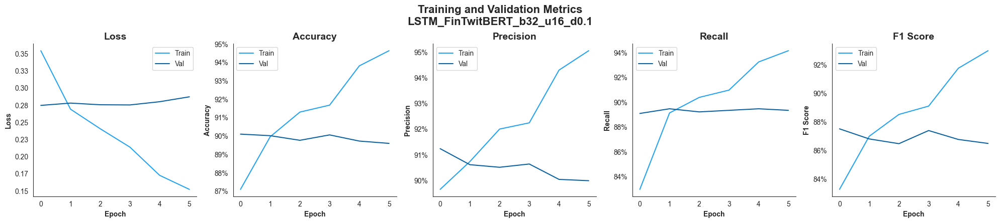

LSTM_FinTwitBERT_b32_u16_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.85      0.85      0.85      1082
 Bullish (1)       0.84      0.88      0.86      1442
 Neutral (2)       0.94      0.93      0.94      4633

    accuracy                           0.91      7157
   macro avg       0.88      0.89      0.88      7157
weighted avg       0.91      0.91      0.91      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

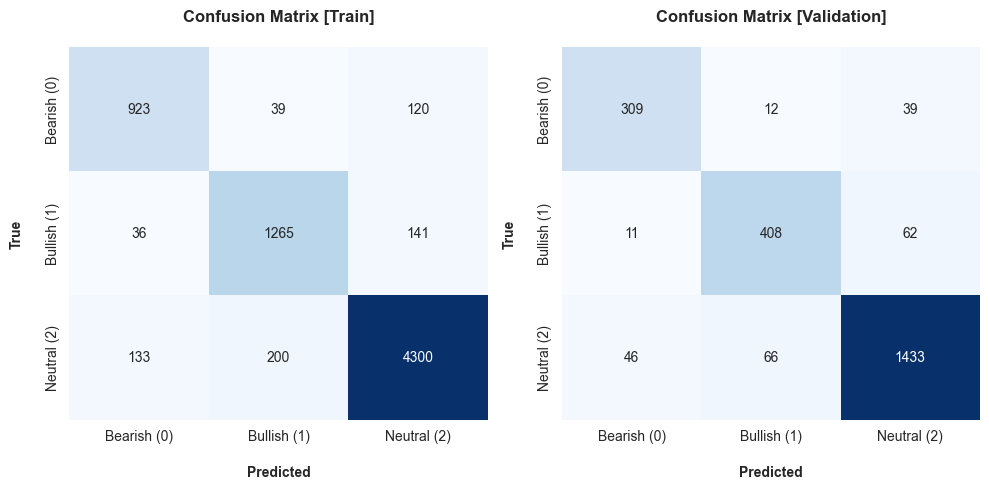

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Training with batch_size=32, lstm_units=16, dropout_rate=0.3
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - accuracy: 0.8364 - auc: 0.9451 - f1_score: 0.7700 - loss: 0.4565 - precision: 0.8705 - recall: 0.7444 - val_accuracy: 0.8965 - val_auc: 0.9792 - val_f1_score: 0.8669 - val_loss: 0.2792 - val_precision: 0.9024 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.8990 - auc: 0.9783 - f1_score: 0.8680 - loss: 0.2747 - precision: 0.9067 - recall: 0.8888 - val_accuracy: 0.9007 - val_auc: 0.9813 - val_f1_score: 0.8737 - val_loss: 0.2604 - val_precision: 0.9127 - val_recall: 0.8898 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.9078 - auc: 0.9801 - f1_score: 0.8812 - loss: 0.2655 - precision: 0.9143 - recall: 0.8973 - val_accuracy: 0.8994 - val_auc: 0.9806 - val_f1_score: 0.8696 - val_loss: 0.2666 - val_precision: 0.9090 - val_recall:

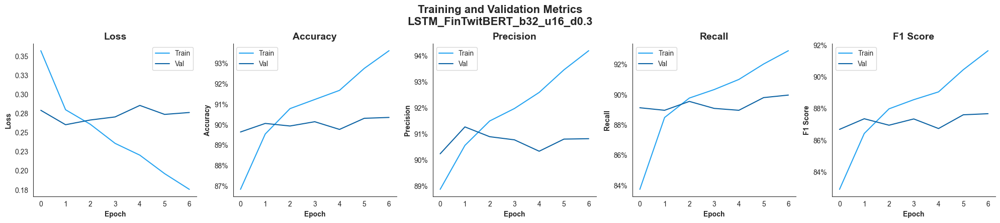

LSTM_FinTwitBERT_b32_u16_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.83      0.86      1082
 Bullish (1)       0.87      0.87      0.87      1442
 Neutral (2)       0.94      0.95      0.94      4633

    accuracy                           0.92      7157
   macro avg       0.90      0.88      0.89      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

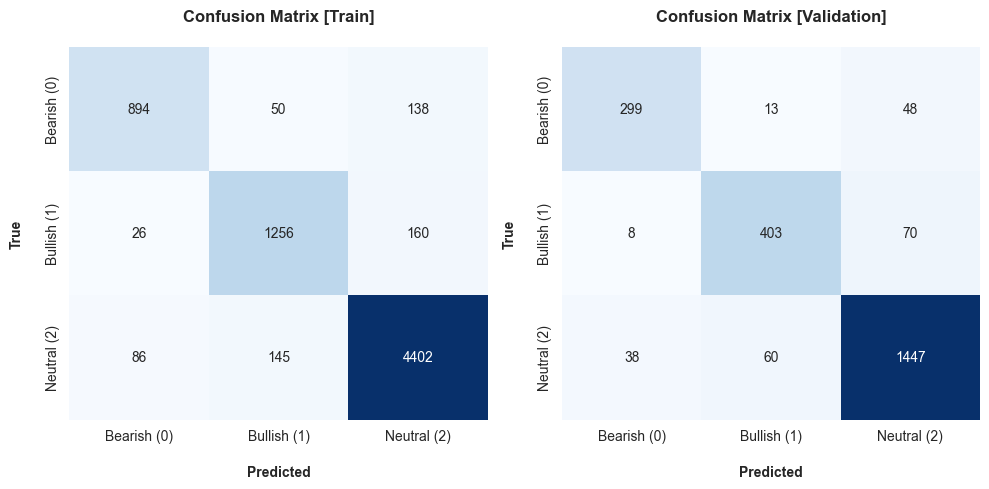

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Training with batch_size=32, lstm_units=16, dropout_rate=0.5
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - accuracy: 0.8114 - auc: 0.9268 - f1_score: 0.7387 - loss: 0.5125 - precision: 0.8685 - recall: 0.7115 - val_accuracy: 0.8998 - val_auc: 0.9782 - val_f1_score: 0.8724 - val_loss: 0.2782 - val_precision: 0.9052 - val_recall: 0.8885 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.8945 - auc: 0.9733 - f1_score: 0.8646 - loss: 0.3047 - precision: 0.9031 - recall: 0.8814 - val_accuracy: 0.9040 - val_auc: 0.9805 - val_f1_score: 0.8786 - val_loss: 0.2668 - val_precision: 0.9090 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.8969 - auc: 0.9752 - f1_score: 0.8662 - loss: 0.2947 - precision: 0.9071 - recall: 0.8864 - val_accuracy: 0.8973 - val_auc: 0.9793 - val_f1_score: 0.8668 - val_loss: 0.2765 - val_precision: 0.9050 - val_recall:

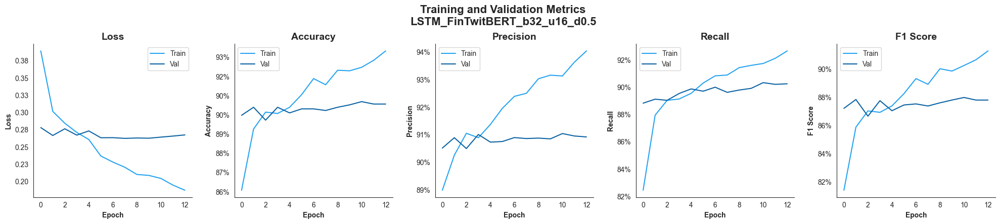

LSTM_FinTwitBERT_b32_u16_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.88      0.87      0.88      1082
 Bullish (1)       0.92      0.89      0.90      1442
 Neutral (2)       0.95      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.92      0.91      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

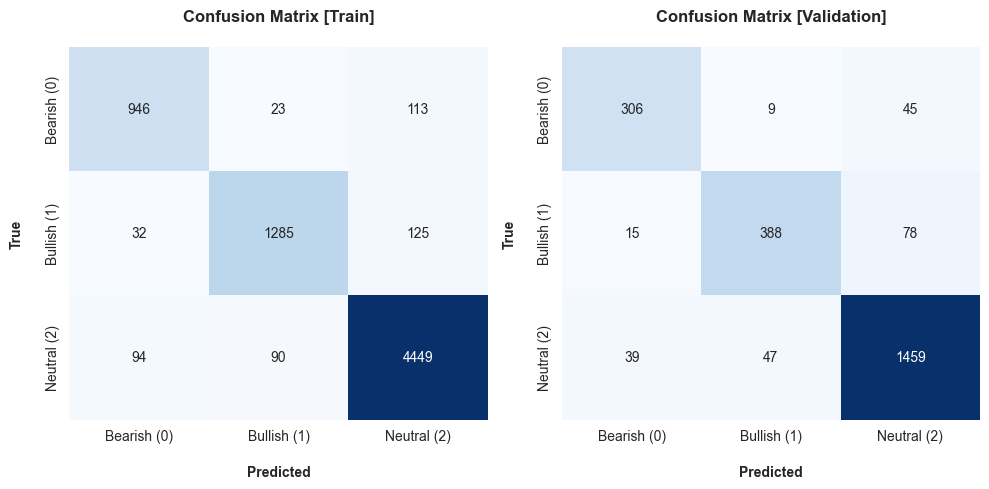

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step

Training with batch_size=32, lstm_units=32, dropout_rate=0.1
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.8395 - auc: 0.9515 - f1_score: 0.7867 - loss: 0.4067 - precision: 0.8851 - recall: 0.7828 - val_accuracy: 0.9011 - val_auc: 0.9804 - val_f1_score: 0.8750 - val_loss: 0.2690 - val_precision: 0.9106 - val_recall: 0.8927 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - accuracy: 0.9118 - auc: 0.9834 - f1_score: 0.8821 - loss: 0.2419 - precision: 0.9196 - recall: 0.9057 - val_accuracy: 0.8952 - val_auc: 0.9797 - val_f1_score: 0.8638 - val_loss: 0.2723 - val_precision: 0.9035 - val_recall: 0.8873 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - accuracy: 0.9136 - auc: 0.9853 - f1_score: 0.8862 - loss: 0.2292 - precision: 0.9208 - recall: 0.9067 - val_accuracy: 0.8885 - val_auc: 0.9801 - val_f1_score: 0.8539 - val_loss: 0.2755 - val_precision: 0.8944 - val_recall:

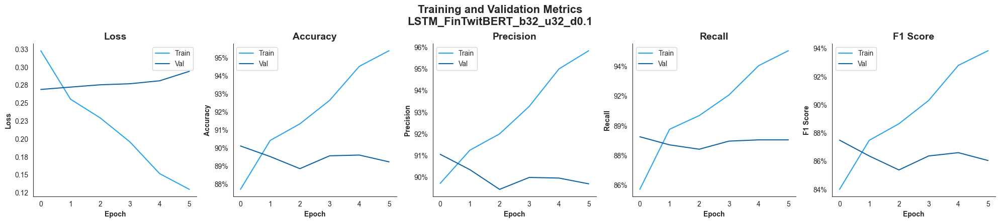

LSTM_FinTwitBERT_b32_u32_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.85      0.85      0.85      1082
 Bullish (1)       0.84      0.89      0.86      1442
 Neutral (2)       0.95      0.93      0.94      4633

    accuracy                           0.91      7157
   macro avg       0.88      0.89      0.88      7157
weighted avg       0.91      0.91      0.91      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

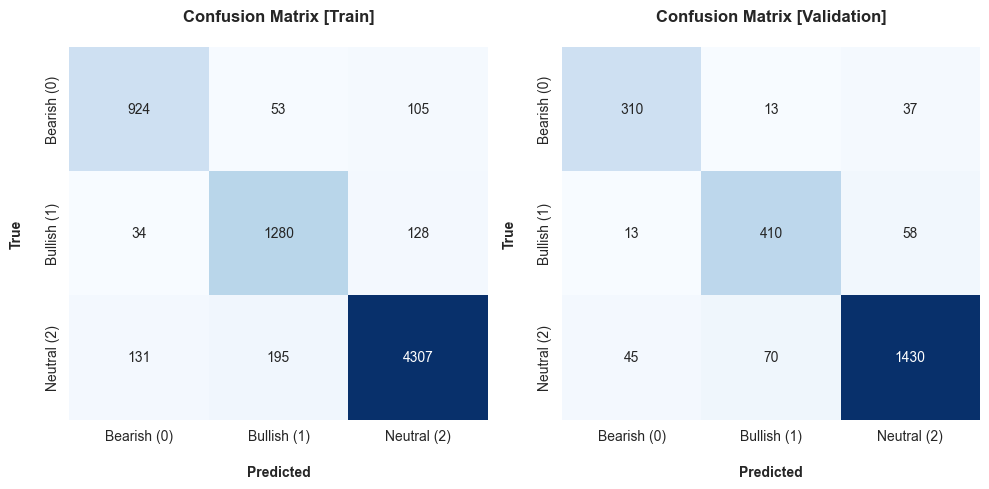

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Training with batch_size=32, lstm_units=32, dropout_rate=0.3
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.8302 - auc: 0.9467 - f1_score: 0.7655 - loss: 0.4290 - precision: 0.8656 - recall: 0.7762 - val_accuracy: 0.8998 - val_auc: 0.9796 - val_f1_score: 0.8706 - val_loss: 0.2712 - val_precision: 0.9082 - val_recall: 0.8919 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step - accuracy: 0.8976 - auc: 0.9790 - f1_score: 0.8685 - loss: 0.2728 - precision: 0.9062 - recall: 0.8858 - val_accuracy: 0.9011 - val_auc: 0.9801 - val_f1_score: 0.8741 - val_loss: 0.2693 - val_precision: 0.9112 - val_recall: 0.8898 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.9106 - auc: 0.9823 - f1_score: 0.8838 - loss: 0.2514 - precision: 0.9186 - recall: 0.8999 - val_accuracy: 0.9011 - val_auc: 0.9806 - val_f1_score: 0.8733 - val_loss: 0.2658 - val_precision: 0.9070 - val_recall:

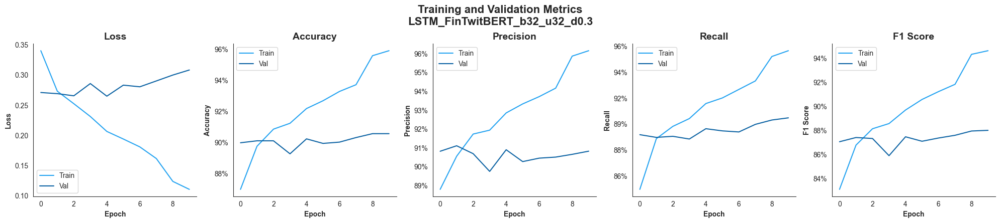

LSTM_FinTwitBERT_b32_u32_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.90      0.89      1082
 Bullish (1)       0.92      0.89      0.90      1442
 Neutral (2)       0.95      0.96      0.96      4633

    accuracy                           0.94      7157
   macro avg       0.92      0.91      0.92      7157
weighted avg       0.94      0.94      0.94      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

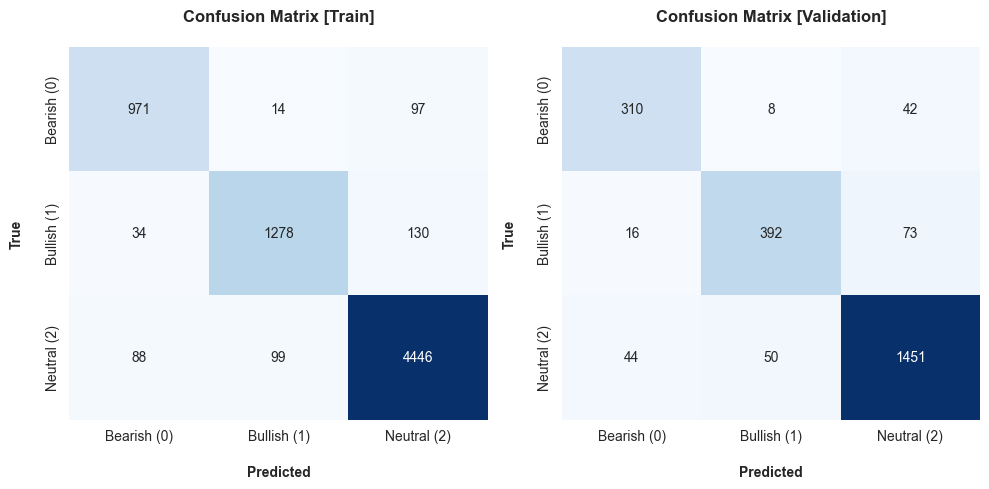

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step

Training with batch_size=32, lstm_units=32, dropout_rate=0.5
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.8357 - auc: 0.9401 - f1_score: 0.7876 - loss: 0.4467 - precision: 0.8814 - recall: 0.7655 - val_accuracy: 0.8973 - val_auc: 0.9793 - val_f1_score: 0.8671 - val_loss: 0.2774 - val_precision: 0.9044 - val_recall: 0.8923 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.8940 - auc: 0.9768 - f1_score: 0.8635 - loss: 0.2865 - precision: 0.9056 - recall: 0.8869 - val_accuracy: 0.8986 - val_auc: 0.9805 - val_f1_score: 0.8706 - val_loss: 0.2671 - val_precision: 0.9067 - val_recall: 0.8881 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step - accuracy: 0.9004 - auc: 0.9791 - f1_score: 0.8674 - loss: 0.2703 - precision: 0.9071 - recall: 0.8871 - val_accuracy: 0.8994 - val_auc: 0.9804 - val_f1_score: 0.8718 - val_loss: 0.2673 - val_precision: 0.9046 - val_recall:

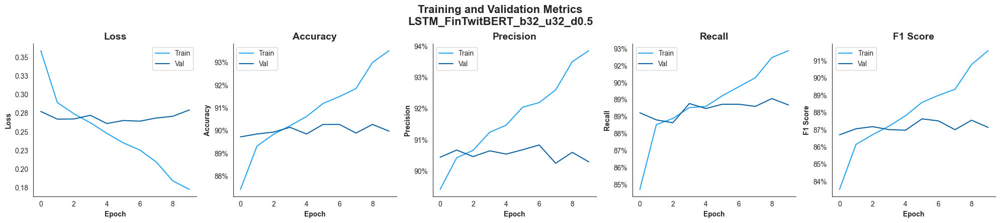

LSTM_FinTwitBERT_b32_u32_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.88      0.86      0.87      1082
 Bullish (1)       0.89      0.90      0.89      1442
 Neutral (2)       0.95      0.95      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.91      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

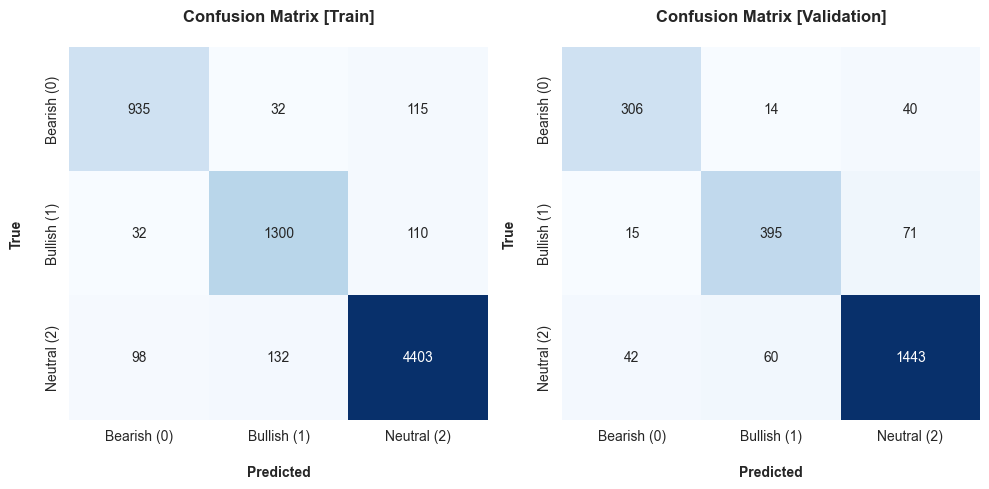

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Training with batch_size=32, lstm_units=64, dropout_rate=0.1
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - accuracy: 0.8709 - auc: 0.9646 - f1_score: 0.8269 - loss: 0.3654 - precision: 0.8921 - recall: 0.8236 - val_accuracy: 0.8982 - val_auc: 0.9800 - val_f1_score: 0.8694 - val_loss: 0.2727 - val_precision: 0.9051 - val_recall: 0.8910 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - accuracy: 0.9104 - auc: 0.9837 - f1_score: 0.8809 - loss: 0.2409 - precision: 0.9166 - recall: 0.9045 - val_accuracy: 0.8990 - val_auc: 0.9804 - val_f1_score: 0.8710 - val_loss: 0.2679 - val_precision: 0.9075 - val_recall: 0.8927 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9189 - auc: 0.9868 - f1_score: 0.8920 - loss: 0.2167 - precision: 0.9260 - recall: 0.9117 - val_accuracy: 0.8961 - val_auc: 0.9802 - val_f1_score: 0.8690 - val_loss: 0.2654 - val_precision: 0.9034 - val_recall:

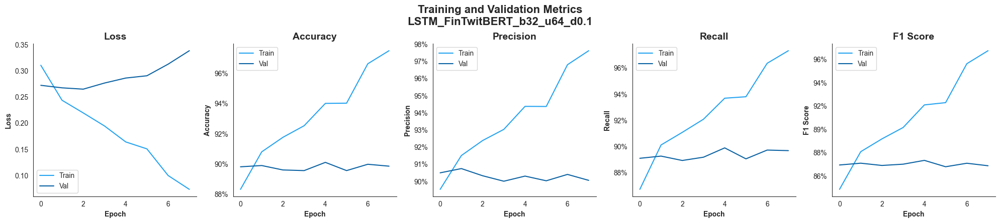

LSTM_FinTwitBERT_b32_u64_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.87      0.88      1082
 Bullish (1)       0.88      0.92      0.90      1442
 Neutral (2)       0.96      0.95      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.91      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

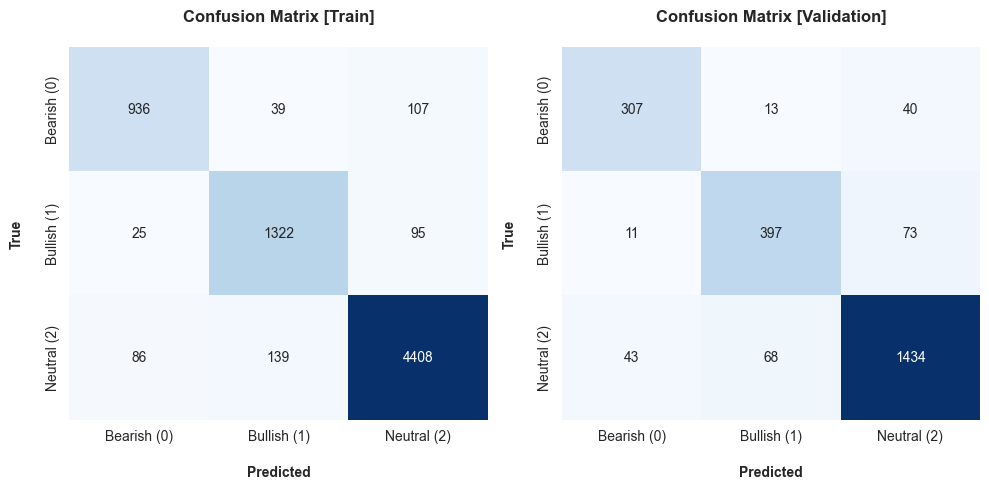

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step

Training with batch_size=32, lstm_units=64, dropout_rate=0.3
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - accuracy: 0.8492 - auc: 0.9544 - f1_score: 0.8040 - loss: 0.3896 - precision: 0.8776 - recall: 0.8058 - val_accuracy: 0.8935 - val_auc: 0.9790 - val_f1_score: 0.8677 - val_loss: 0.2767 - val_precision: 0.9041 - val_recall: 0.8852 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - accuracy: 0.8919 - auc: 0.9775 - f1_score: 0.8625 - loss: 0.2824 - precision: 0.8990 - recall: 0.8854 - val_accuracy: 0.8973 - val_auc: 0.9804 - val_f1_score: 0.8693 - val_loss: 0.2682 - val_precision: 0.9033 - val_recall: 0.8885 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.9070 - auc: 0.9852 - f1_score: 0.8782 - loss: 0.2313 - precision: 0.9171 - recall: 0.9001 - val_accuracy: 0.8994 - val_auc: 0.9813 - val_f1_score: 0.8689 - val_loss: 0.2599 - val_precision: 0.9053 - val_recall:

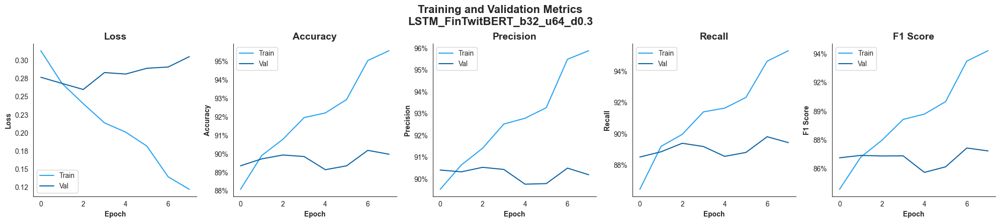

LSTM_FinTwitBERT_b32_u64_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.88      0.87      0.88      1082
 Bullish (1)       0.91      0.88      0.90      1442
 Neutral (2)       0.95      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.90      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

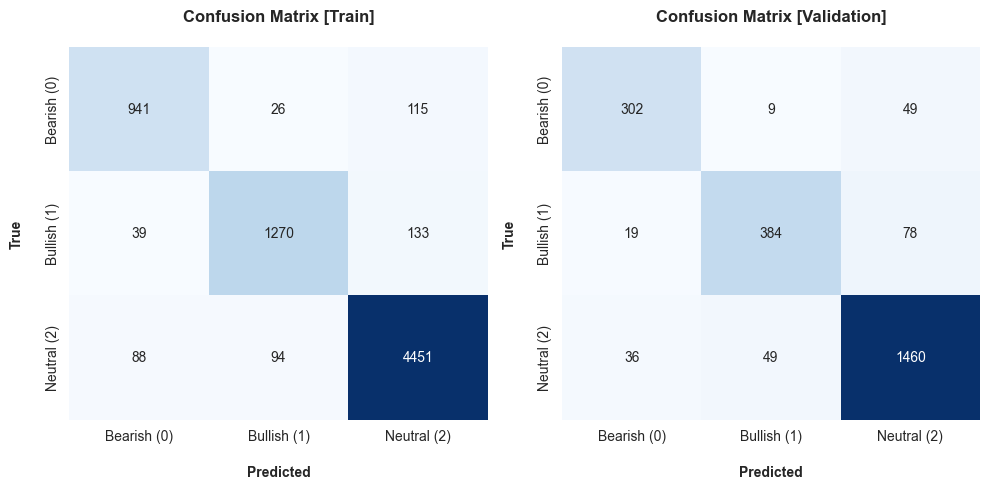

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

Training with batch_size=32, lstm_units=64, dropout_rate=0.5
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - accuracy: 0.8299 - auc: 0.9432 - f1_score: 0.7837 - loss: 0.4272 - precision: 0.8659 - recall: 0.7706 - val_accuracy: 0.8910 - val_auc: 0.9759 - val_f1_score: 0.8563 - val_loss: 0.2964 - val_precision: 0.8994 - val_recall: 0.8806 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - accuracy: 0.8882 - auc: 0.9768 - f1_score: 0.8577 - loss: 0.2879 - precision: 0.9041 - recall: 0.8790 - val_accuracy: 0.8923 - val_auc: 0.9795 - val_f1_score: 0.8631 - val_loss: 0.2753 - val_precision: 0.8995 - val_recall: 0.8852 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step - accuracy: 0.9079 - auc: 0.9817 - f1_score: 0.8823 - loss: 0.2527 - precision: 0.9183 - recall: 0.9003 - val_accuracy: 0.8990 - val_auc: 0.9809 - val_f1_score: 0.8693 - val_loss: 0.2650 - val_precision: 0.9055 - val_recall:

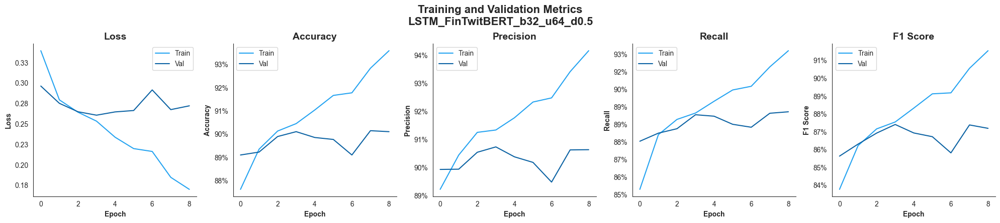

LSTM_FinTwitBERT_b32_u64_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.85      0.87      1082
 Bullish (1)       0.88      0.89      0.88      1442
 Neutral (2)       0.94      0.95      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.90      0.90      0.90      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

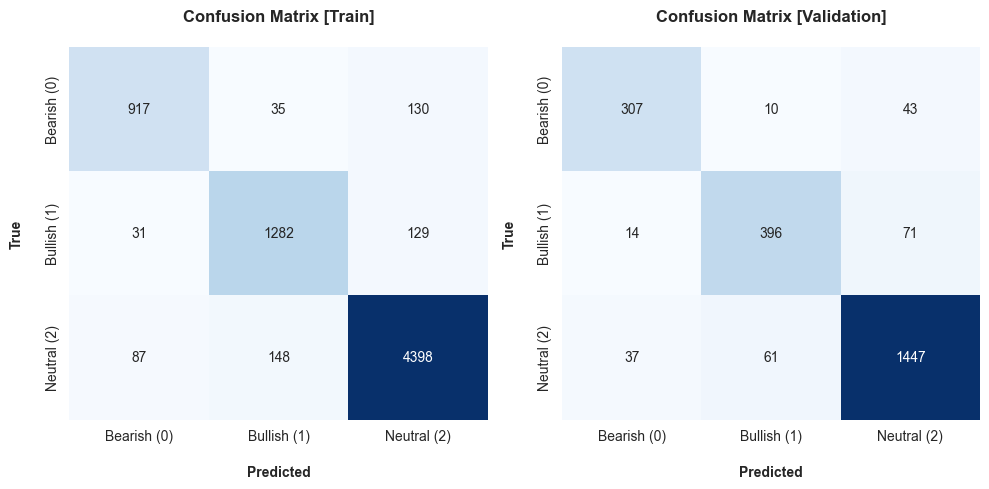

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

Training with batch_size=32, lstm_units=128, dropout_rate=0.1
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.8557 - auc: 0.9625 - f1_score: 0.8080 - loss: 0.3591 - precision: 0.8816 - recall: 0.8272 - val_accuracy: 0.8944 - val_auc: 0.9809 - val_f1_score: 0.8644 - val_loss: 0.2654 - val_precision: 0.9012 - val_recall: 0.8910 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.9114 - auc: 0.9841 - f1_score: 0.8835 - loss: 0.2370 - precision: 0.9202 - recall: 0.9052 - val_accuracy: 0.8977 - val_auc: 0.9787 - val_f1_score: 0.8707 - val_loss: 0.2757 - val_precision: 0.9064 - val_recall: 0.8889 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.9235 - auc: 0.9875 - f1_score: 0.8998 - loss: 0.2105 - precision: 0.9289 - recall: 0.9158 - val_accuracy: 0.8977 - val_auc: 0.9804 - val_f1_score: 0.8679 - val_loss: 0.2679 - val_precision: 0.9020 - val_recall

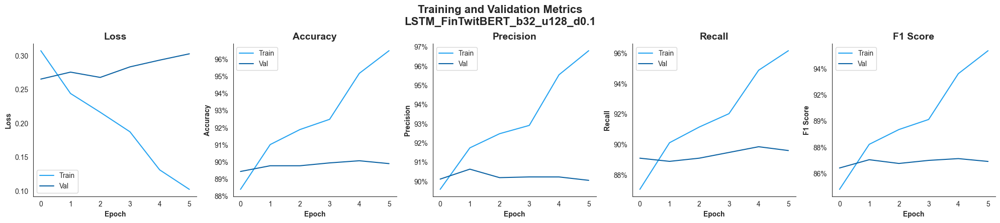

LSTM_FinTwitBERT_b32_u128_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.84      0.86      0.85      1082
 Bullish (1)       0.90      0.84      0.87      1442
 Neutral (2)       0.93      0.95      0.94      4633

    accuracy                           0.91      7157
   macro avg       0.89      0.88      0.89      7157
weighted avg       0.91      0.91      0.91      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

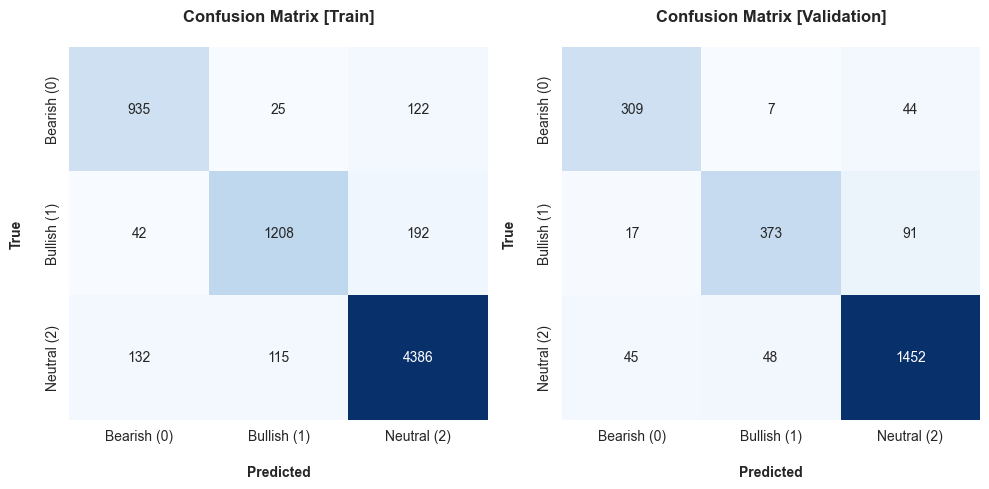

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

Training with batch_size=32, lstm_units=128, dropout_rate=0.3
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.8681 - auc: 0.9651 - f1_score: 0.8215 - loss: 0.3508 - precision: 0.8908 - recall: 0.8486 - val_accuracy: 0.9007 - val_auc: 0.9809 - val_f1_score: 0.8729 - val_loss: 0.2645 - val_precision: 0.9105 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9069 - auc: 0.9842 - f1_score: 0.8751 - loss: 0.2389 - precision: 0.9163 - recall: 0.8991 - val_accuracy: 0.8990 - val_auc: 0.9806 - val_f1_score: 0.8703 - val_loss: 0.2680 - val_precision: 0.9068 - val_recall: 0.8935 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.9107 - auc: 0.9842 - f1_score: 0.8834 - loss: 0.2365 - precision: 0.9178 - recall: 0.9030 - val_accuracy: 0.9007 - val_auc: 0.9808 - val_f1_score: 0.8707 - val_loss: 0.2635 - val_precision: 0.9034 - val_recall

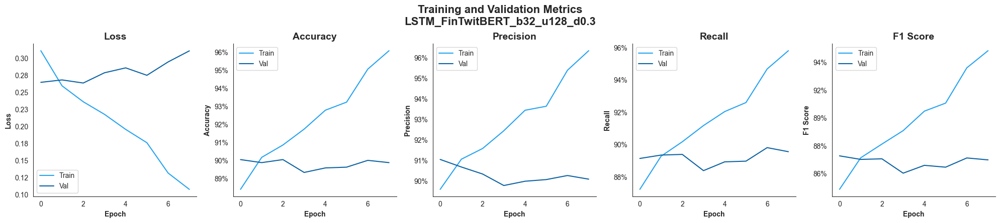

LSTM_FinTwitBERT_b32_u128_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.87      0.88      1082
 Bullish (1)       0.91      0.89      0.90      1442
 Neutral (2)       0.95      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.92      0.91      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

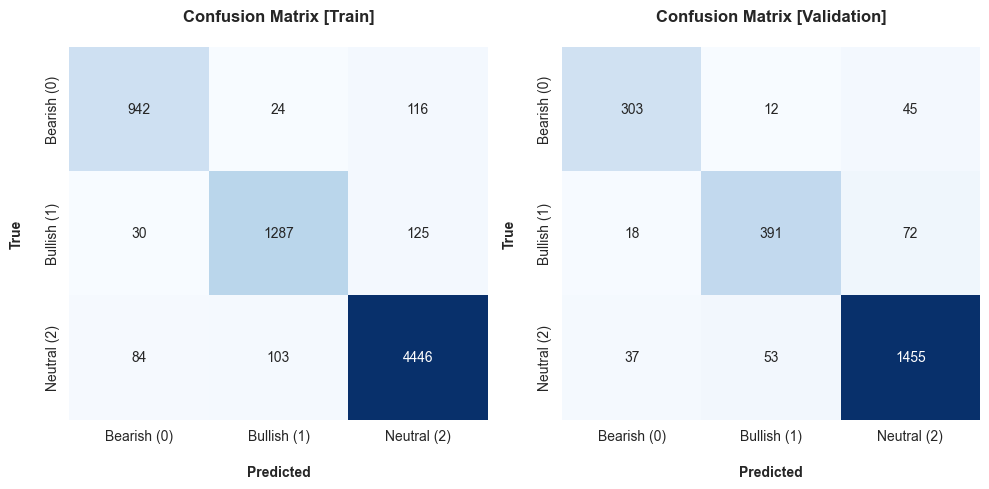

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step

Training with batch_size=32, lstm_units=128, dropout_rate=0.5
Epoch 1/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.8566 - auc: 0.9589 - f1_score: 0.8136 - loss: 0.3733 - precision: 0.8775 - recall: 0.8219 - val_accuracy: 0.8998 - val_auc: 0.9808 - val_f1_score: 0.8706 - val_loss: 0.2648 - val_precision: 0.9070 - val_recall: 0.8906 - learning_rate: 0.0010
Epoch 2/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.8983 - auc: 0.9797 - f1_score: 0.8656 - loss: 0.2703 - precision: 0.9088 - recall: 0.8888 - val_accuracy: 0.8881 - val_auc: 0.9796 - val_f1_score: 0.8534 - val_loss: 0.2726 - val_precision: 0.8983 - val_recall: 0.8814 - learning_rate: 0.0010
Epoch 3/15
224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.9013 - auc: 0.9817 - f1_score: 0.8707 - loss: 0.2553 - precision: 0.9091 - recall: 0.8919 - val_accuracy: 0.8973 - val_auc: 0.9799 - val_f1_score: 0.8657 - val_loss: 0.2692 - val_precision: 0.9064 - val_recall

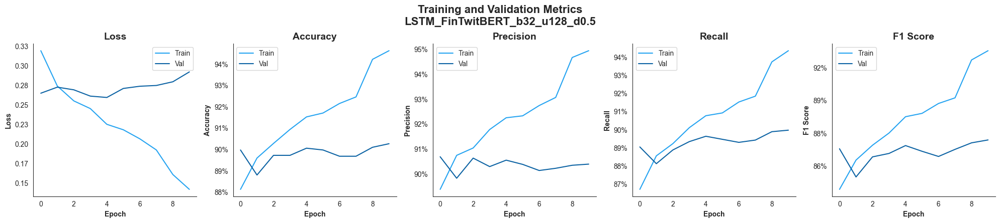

LSTM_FinTwitBERT_b32_u128_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.88      0.87      0.87      1082
 Bullish (1)       0.92      0.87      0.89      1442
 Neutral (2)       0.94      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.90      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

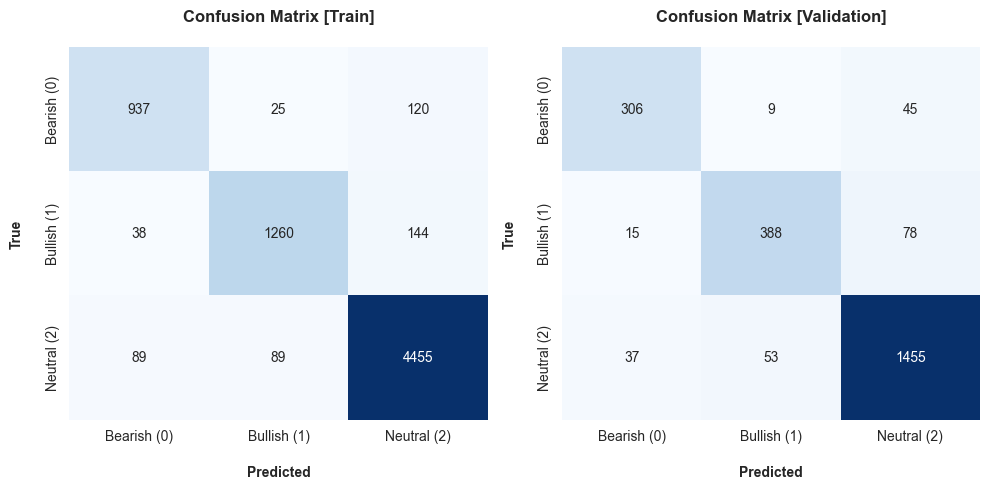

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step

Training with batch_size=64, lstm_units=16, dropout_rate=0.1
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.8087 - auc: 0.9318 - f1_score: 0.7264 - loss: 0.5140 - precision: 0.8709 - recall: 0.6841 - val_accuracy: 0.9011 - val_auc: 0.9788 - val_f1_score: 0.8732 - val_loss: 0.2771 - val_precision: 0.9100 - val_recall: 0.8898 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.9040 - auc: 0.9805 - f1_score: 0.8744 - loss: 0.2639 - precision: 0.9095 - recall: 0.8954 - val_accuracy: 0.9015 - val_auc: 0.9809 - val_f1_score: 0.8716 - val_loss: 0.2640 - val_precision: 0.9072 - val_recall: 0.8973 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.9096 - auc: 0.9834 - f1_score: 0.8838 - loss: 0.2416 - precision: 0.9181 - recall: 0.9038 - val_accuracy: 0.9015 - val_auc: 0.9806 - val_f1_score: 0.8726 - val_loss: 0.2667 - val_precision: 0.9081 - val_recall: 0.

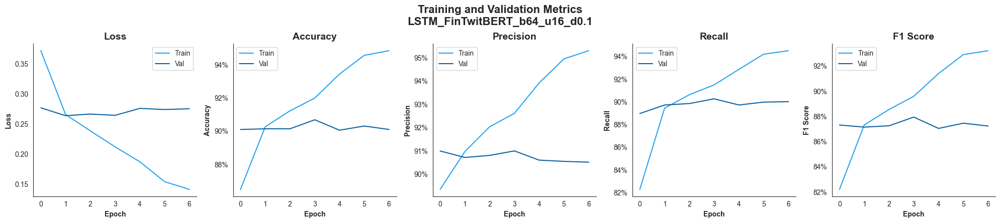

LSTM_FinTwitBERT_b64_u16_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.88      0.85      0.87      1082
 Bullish (1)       0.89      0.86      0.87      1442
 Neutral (2)       0.94      0.95      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.90      0.89      0.90      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

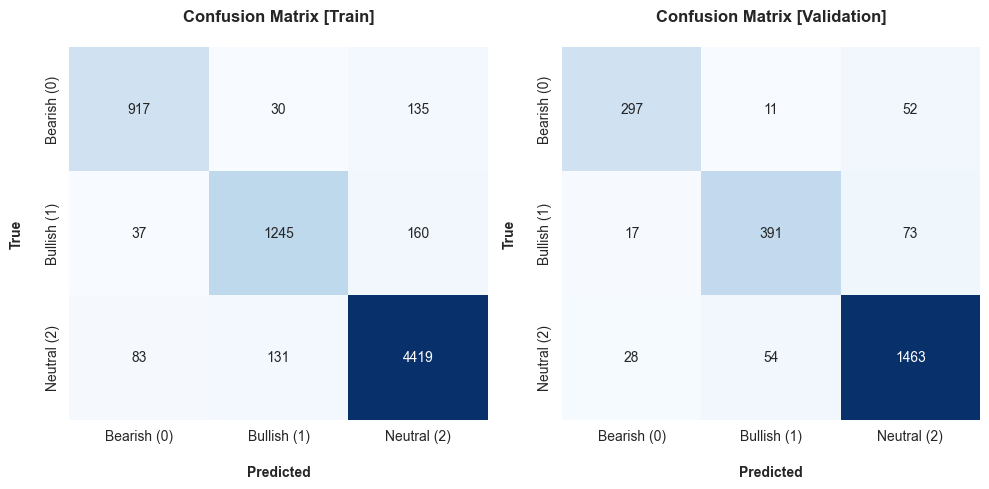

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Training with batch_size=64, lstm_units=16, dropout_rate=0.3
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.8002 - auc: 0.9256 - f1_score: 0.7233 - loss: 0.5217 - precision: 0.8631 - recall: 0.6856 - val_accuracy: 0.8994 - val_auc: 0.9786 - val_f1_score: 0.8708 - val_loss: 0.2793 - val_precision: 0.9055 - val_recall: 0.8956 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.8946 - auc: 0.9760 - f1_score: 0.8633 - loss: 0.2888 - precision: 0.9037 - recall: 0.8827 - val_accuracy: 0.8982 - val_auc: 0.9793 - val_f1_score: 0.8705 - val_loss: 0.2754 - val_precision: 0.9105 - val_recall: 0.8910 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.9022 - auc: 0.9797 - f1_score: 0.8740 - loss: 0.2670 - precision: 0.9120 - recall: 0.8924 - val_accuracy: 0.8990 - val_auc: 0.9801 - val_f1_score: 0.8702 - val_loss: 0.2712 - val_precision: 0.9050 - val_recall: 0.

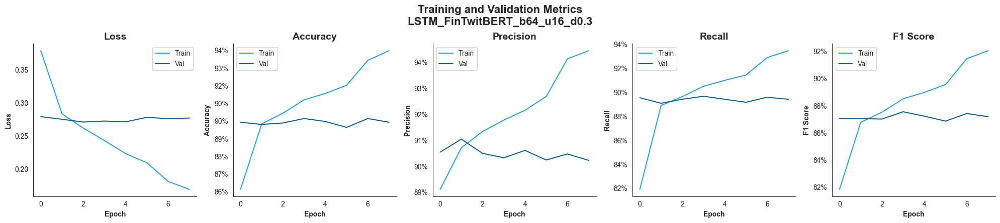

LSTM_FinTwitBERT_b64_u16_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.86      0.86      0.86      1082
 Bullish (1)       0.89      0.87      0.88      1442
 Neutral (2)       0.94      0.95      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.90      0.89      0.89      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

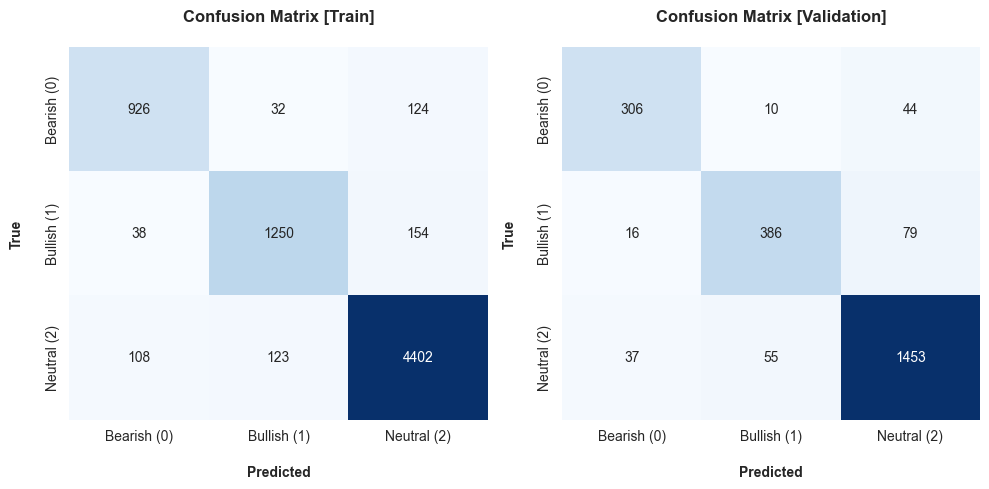

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

Training with batch_size=64, lstm_units=16, dropout_rate=0.5
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.7734 - auc: 0.9128 - f1_score: 0.6765 - loss: 0.5640 - precision: 0.8581 - recall: 0.6480 - val_accuracy: 0.9053 - val_auc: 0.9792 - val_f1_score: 0.8791 - val_loss: 0.2736 - val_precision: 0.9084 - val_recall: 0.8982 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.8888 - auc: 0.9725 - f1_score: 0.8571 - loss: 0.3114 - precision: 0.9006 - recall: 0.8785 - val_accuracy: 0.9019 - val_auc: 0.9800 - val_f1_score: 0.8735 - val_loss: 0.2683 - val_precision: 0.9123 - val_recall: 0.8898 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.8923 - auc: 0.9768 - f1_score: 0.8617 - loss: 0.2863 - precision: 0.9077 - recall: 0.8832 - val_accuracy: 0.8965 - val_auc: 0.9785 - val_f1_score: 0.8666 - val_loss: 0.2765 - val_precision: 0.9021 - val_recall: 0.

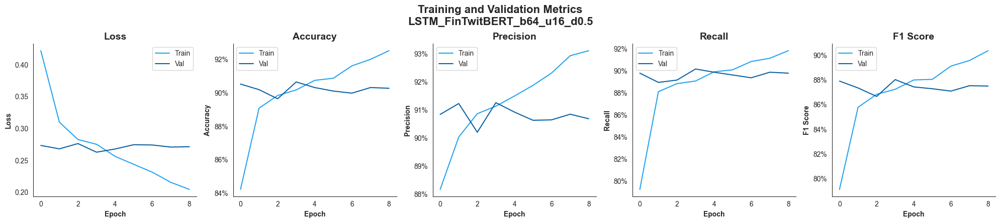

LSTM_FinTwitBERT_b64_u16_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.88      0.85      0.86      1082
 Bullish (1)       0.88      0.87      0.87      1442
 Neutral (2)       0.94      0.95      0.94      4633

    accuracy                           0.92      7157
   macro avg       0.90      0.89      0.89      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

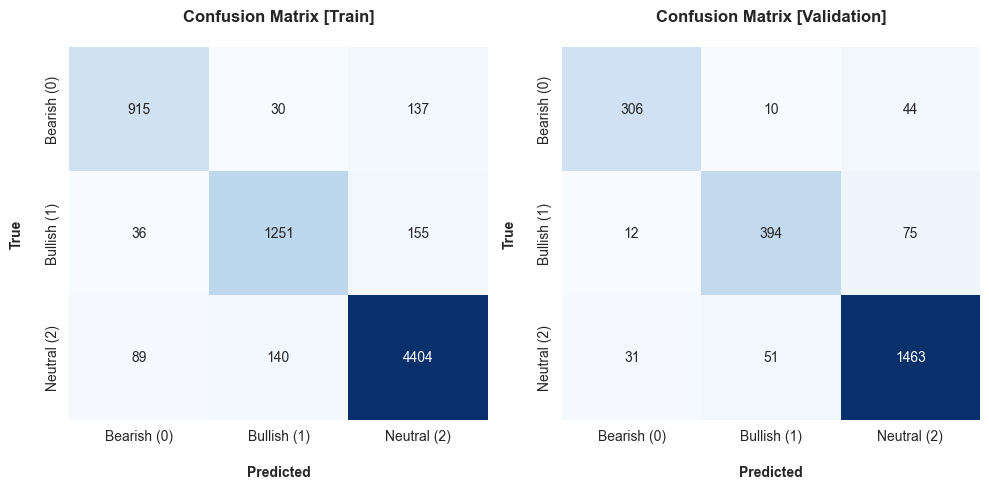

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Training with batch_size=64, lstm_units=32, dropout_rate=0.1
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.8032 - auc: 0.9167 - f1_score: 0.7533 - loss: 0.5153 - precision: 0.8733 - recall: 0.6832 - val_accuracy: 0.8927 - val_auc: 0.9785 - val_f1_score: 0.8596 - val_loss: 0.2806 - val_precision: 0.8987 - val_recall: 0.8889 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.9069 - auc: 0.9826 - f1_score: 0.8760 - loss: 0.2506 - precision: 0.9147 - recall: 0.9006 - val_accuracy: 0.8961 - val_auc: 0.9812 - val_f1_score: 0.8642 - val_loss: 0.2636 - val_precision: 0.9032 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.9160 - auc: 0.9861 - f1_score: 0.8875 - loss: 0.2232 - precision: 0.9213 - recall: 0.9107 - val_accuracy: 0.9023 - val_auc: 0.9805 - val_f1_score: 0.8741 - val_loss: 0.2652 - val_precision: 0.9092 - val_recall: 0.

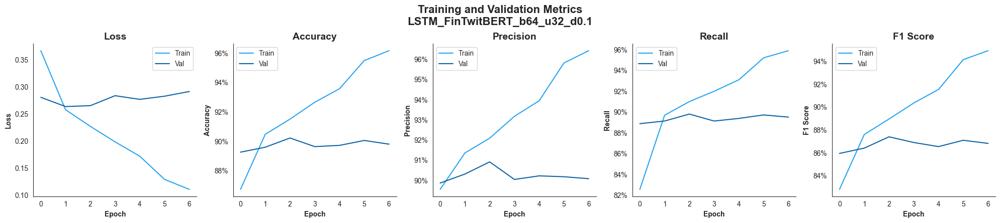

LSTM_FinTwitBERT_b64_u32_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.87      0.85      0.86      1082
 Bullish (1)       0.91      0.84      0.88      1442
 Neutral (2)       0.93      0.96      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.91      0.88      0.89      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

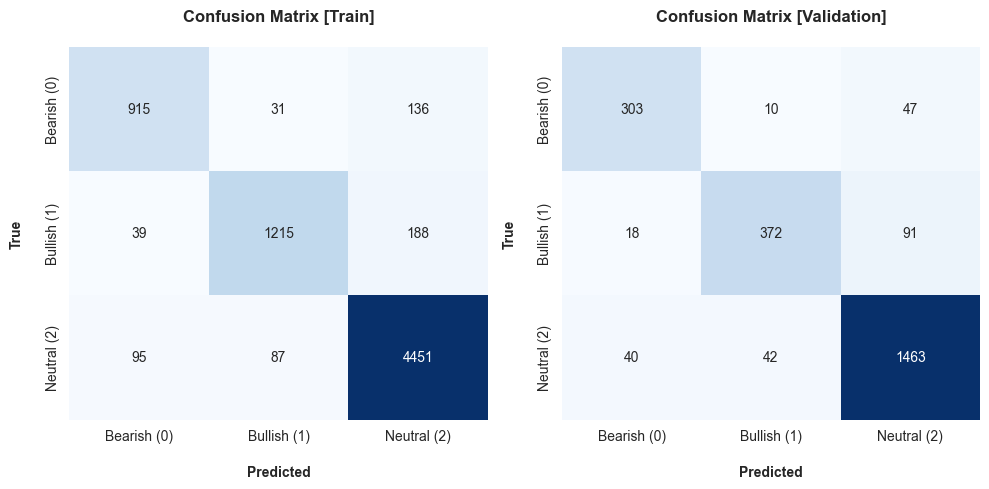

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Training with batch_size=64, lstm_units=32, dropout_rate=0.3
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - accuracy: 0.8229 - auc: 0.9428 - f1_score: 0.7562 - loss: 0.4538 - precision: 0.8713 - recall: 0.7498 - val_accuracy: 0.9007 - val_auc: 0.9794 - val_f1_score: 0.8736 - val_loss: 0.2729 - val_precision: 0.9072 - val_recall: 0.8927 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.9025 - auc: 0.9811 - f1_score: 0.8764 - loss: 0.2590 - precision: 0.9087 - recall: 0.8959 - val_accuracy: 0.9011 - val_auc: 0.9803 - val_f1_score: 0.8705 - val_loss: 0.2662 - val_precision: 0.9106 - val_recall: 0.8927 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9163 - auc: 0.9848 - f1_score: 0.8900 - loss: 0.2312 - precision: 0.9245 - recall: 0.9090 - val_accuracy: 0.9036 - val_auc: 0.9818 - val_f1_score: 0.8754 - val_loss: 0.2581 - val_precision: 0.9092 - val_recall: 0.

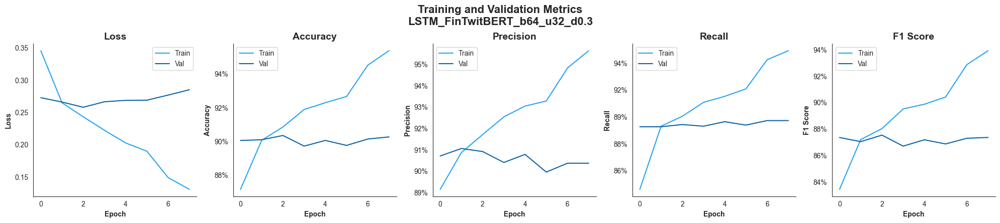

LSTM_FinTwitBERT_b64_u32_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.87      0.89      0.88      1082
 Bullish (1)       0.91      0.88      0.89      1442
 Neutral (2)       0.95      0.95      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.91      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

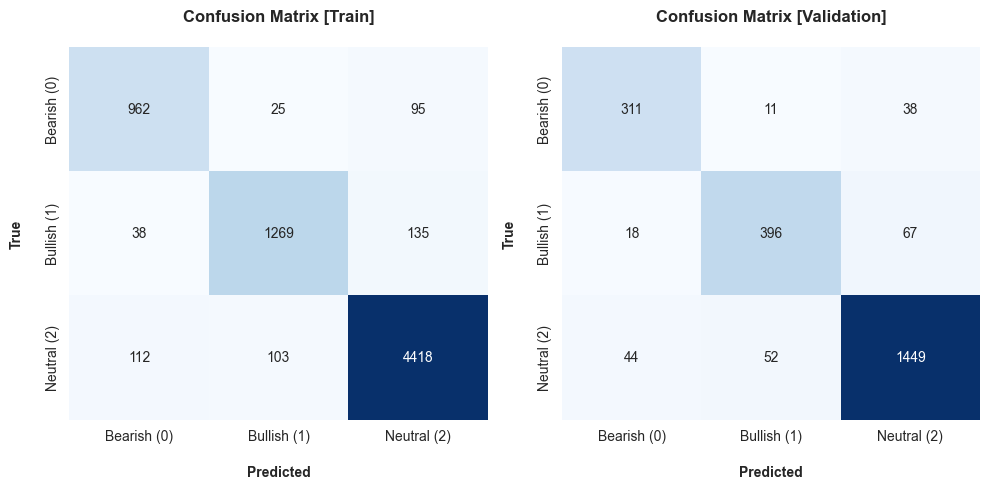

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Training with batch_size=64, lstm_units=32, dropout_rate=0.5
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7801 - auc: 0.9104 - f1_score: 0.7104 - loss: 0.5403 - precision: 0.8497 - recall: 0.6708 - val_accuracy: 0.8986 - val_auc: 0.9795 - val_f1_score: 0.8701 - val_loss: 0.2706 - val_precision: 0.9059 - val_recall: 0.8919 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.8952 - auc: 0.9772 - f1_score: 0.8625 - loss: 0.2837 - precision: 0.9038 - recall: 0.8842 - val_accuracy: 0.9003 - val_auc: 0.9805 - val_f1_score: 0.8720 - val_loss: 0.2647 - val_precision: 0.9066 - val_recall: 0.8948 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.9015 - auc: 0.9815 - f1_score: 0.8729 - loss: 0.2590 - precision: 0.9108 - recall: 0.8918 - val_accuracy: 0.9007 - val_auc: 0.9817 - val_f1_score: 0.8721 - val_loss: 0.2578 - val_precision: 0.9112 - val_recall: 0.

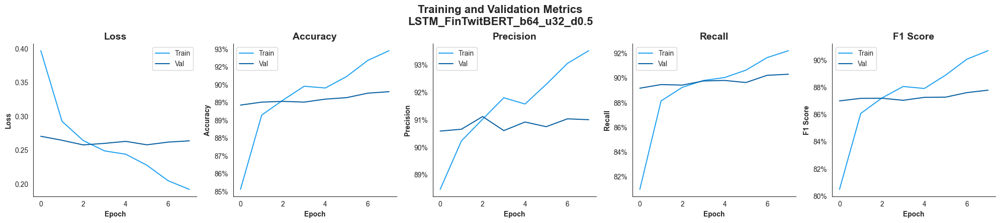

LSTM_FinTwitBERT_b64_u32_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.87      0.84      0.85      1082
 Bullish (1)       0.88      0.87      0.88      1442
 Neutral (2)       0.94      0.95      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.90      0.89      0.89      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

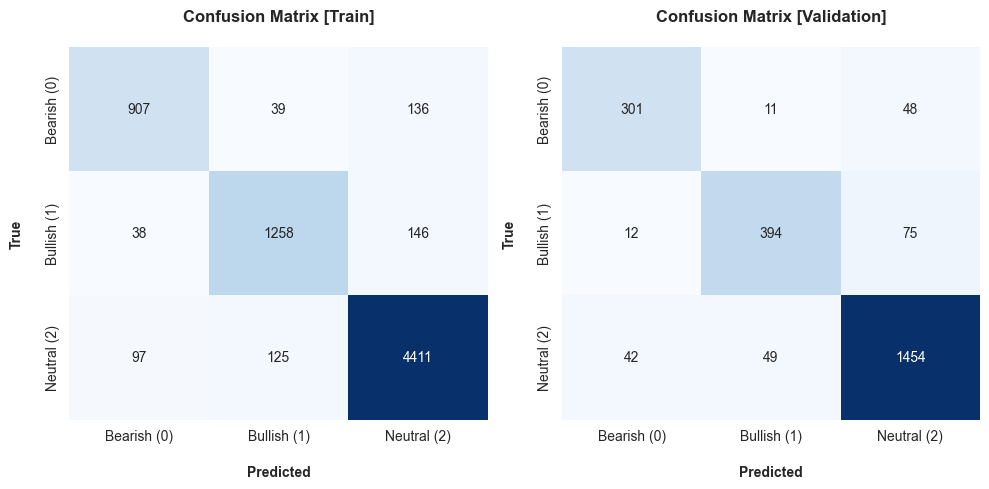

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Training with batch_size=64, lstm_units=64, dropout_rate=0.1
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8524 - auc: 0.9524 - f1_score: 0.8092 - loss: 0.4117 - precision: 0.8854 - recall: 0.7834 - val_accuracy: 0.8977 - val_auc: 0.9805 - val_f1_score: 0.8684 - val_loss: 0.2665 - val_precision: 0.9035 - val_recall: 0.8944 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.9090 - auc: 0.9834 - f1_score: 0.8788 - loss: 0.2451 - precision: 0.9147 - recall: 0.9033 - val_accuracy: 0.9023 - val_auc: 0.9814 - val_f1_score: 0.8771 - val_loss: 0.2601 - val_precision: 0.9088 - val_recall: 0.8940 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9244 - auc: 0.9881 - f1_score: 0.8991 - loss: 0.2055 - precision: 0.9304 - recall: 0.9161 - val_accuracy: 0.9019 - val_auc: 0.9808 - val_f1_score: 0.8742 - val_loss: 0.2641 - val_precision: 0.9070 - val_recall: 0.

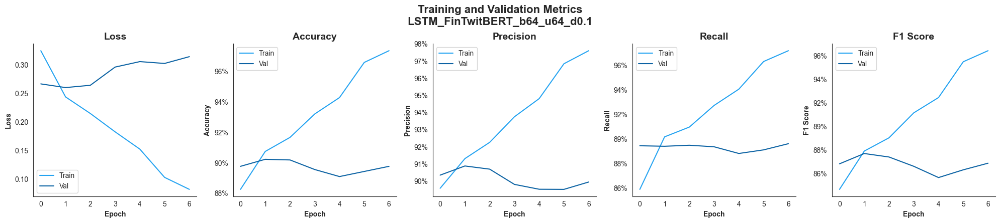

LSTM_FinTwitBERT_b64_u64_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.87      0.88      1082
 Bullish (1)       0.89      0.91      0.90      1442
 Neutral (2)       0.95      0.95      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.91      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

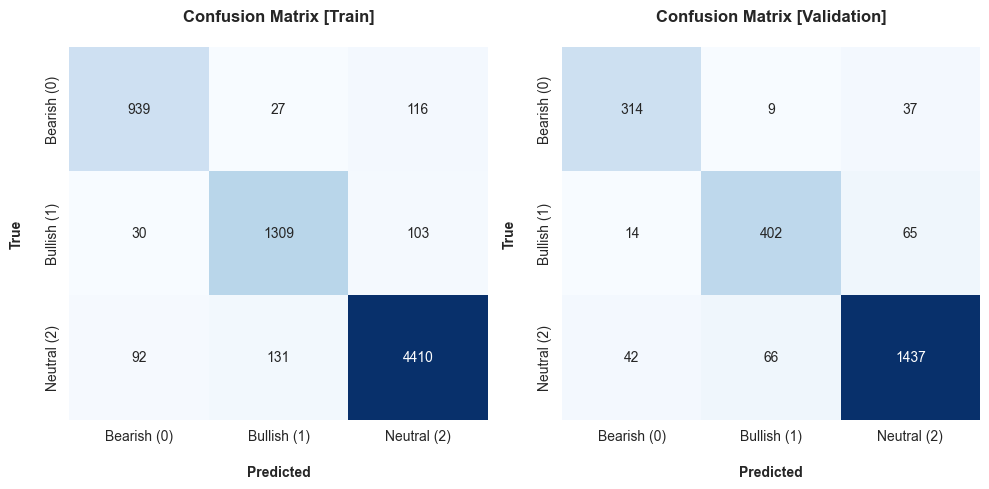

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Training with batch_size=64, lstm_units=64, dropout_rate=0.3
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.8192 - auc: 0.9362 - f1_score: 0.7695 - loss: 0.4337 - precision: 0.8800 - recall: 0.7566 - val_accuracy: 0.8919 - val_auc: 0.9783 - val_f1_score: 0.8578 - val_loss: 0.2823 - val_precision: 0.8955 - val_recall: 0.8873 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.9078 - auc: 0.9834 - f1_score: 0.8796 - loss: 0.2415 - precision: 0.9172 - recall: 0.9007 - val_accuracy: 0.9015 - val_auc: 0.9819 - val_f1_score: 0.8742 - val_loss: 0.2560 - val_precision: 0.9118 - val_recall: 0.8965 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.9187 - auc: 0.9867 - f1_score: 0.8939 - loss: 0.2182 - precision: 0.9246 - recall: 0.9092 - val_accuracy: 0.8998 - val_auc: 0.9789 - val_f1_score: 0.8740 - val_loss: 0.2731 - val_precision: 0.9061 - val_recall: 0.

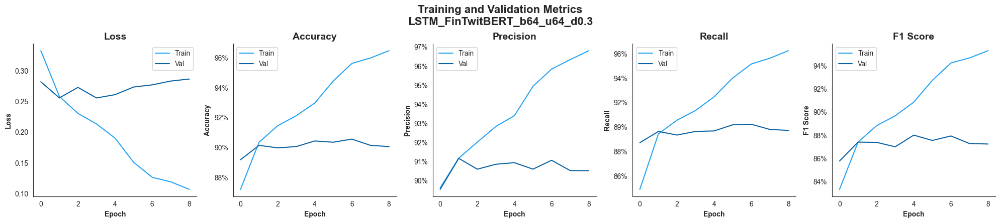

LSTM_FinTwitBERT_b64_u64_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.91      0.88      0.90      1082
 Bullish (1)       0.94      0.89      0.92      1442
 Neutral (2)       0.95      0.97      0.96      4633

    accuracy                           0.94      7157
   macro avg       0.93      0.91      0.92      7157
weighted avg       0.94      0.94      0.94      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

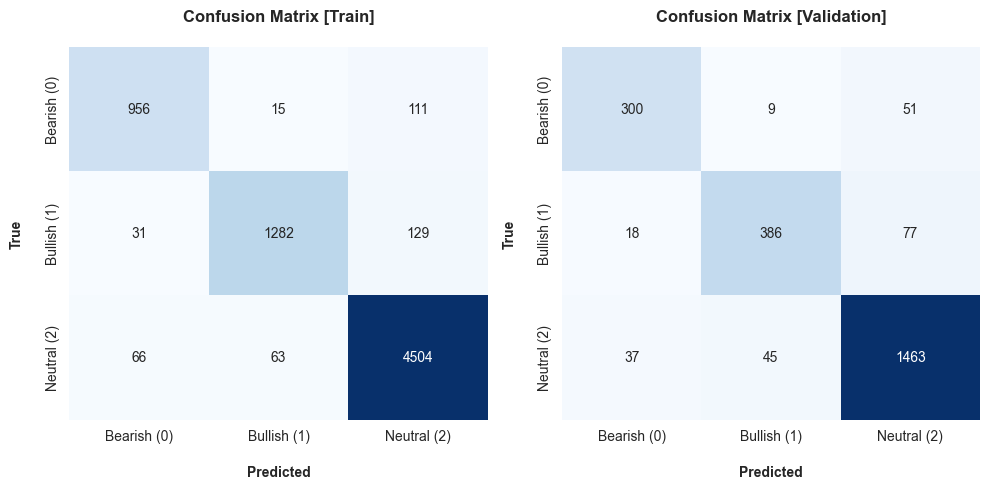

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

Training with batch_size=64, lstm_units=64, dropout_rate=0.5
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.8227 - auc: 0.9416 - f1_score: 0.7772 - loss: 0.4403 - precision: 0.8752 - recall: 0.7558 - val_accuracy: 0.8977 - val_auc: 0.9781 - val_f1_score: 0.8657 - val_loss: 0.2803 - val_precision: 0.9027 - val_recall: 0.8902 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.8988 - auc: 0.9788 - f1_score: 0.8684 - loss: 0.2763 - precision: 0.9098 - recall: 0.8900 - val_accuracy: 0.8990 - val_auc: 0.9798 - val_f1_score: 0.8698 - val_loss: 0.2695 - val_precision: 0.9047 - val_recall: 0.8956 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.9054 - auc: 0.9826 - f1_score: 0.8787 - loss: 0.2504 - precision: 0.9120 - recall: 0.8989 - val_accuracy: 0.8982 - val_auc: 0.9809 - val_f1_score: 0.8665 - val_loss: 0.2635 - val_precision: 0.9062 - val_recall: 0.

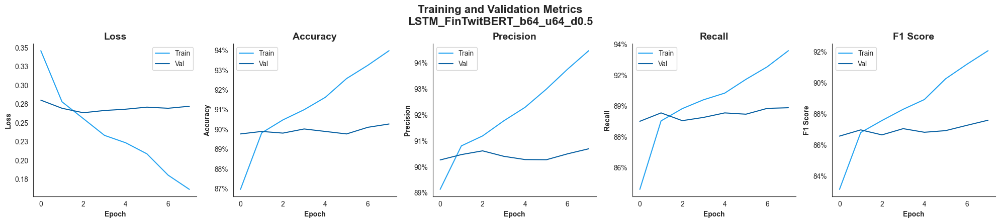

LSTM_FinTwitBERT_b64_u64_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.90      0.83      0.86      1082
 Bullish (1)       0.90      0.85      0.88      1442
 Neutral (2)       0.93      0.96      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.91      0.88      0.89      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

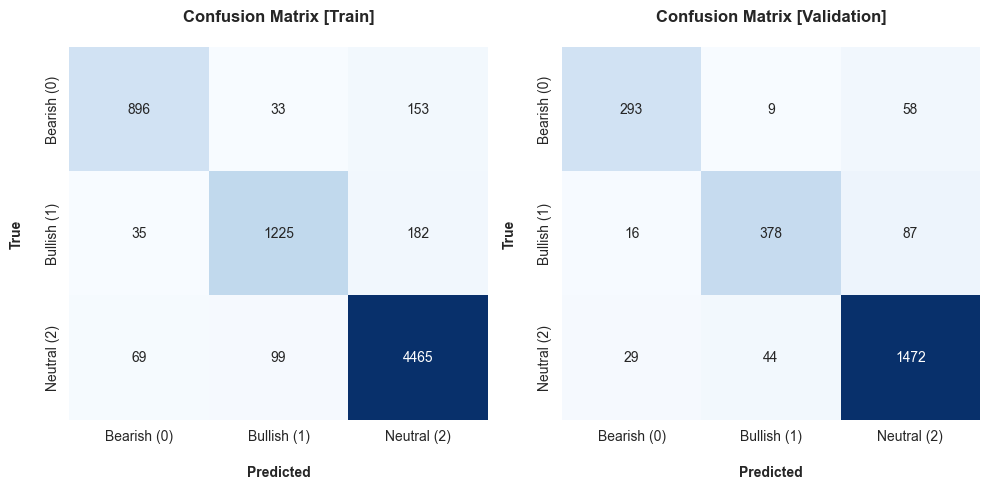

75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step

Training with batch_size=64, lstm_units=128, dropout_rate=0.1
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8477 - auc: 0.9586 - f1_score: 0.7959 - loss: 0.3720 - precision: 0.8690 - recall: 0.8090 - val_accuracy: 0.8969 - val_auc: 0.9799 - val_f1_score: 0.8666 - val_loss: 0.2728 - val_precision: 0.9052 - val_recall: 0.8889 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.9089 - auc: 0.9827 - f1_score: 0.8844 - loss: 0.2480 - precision: 0.9175 - recall: 0.9000 - val_accuracy: 0.8927 - val_auc: 0.9804 - val_f1_score: 0.8580 - val_loss: 0.2692 - val_precision: 0.8998 - val_recall: 0.8881 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9240 - auc: 0.9896 - f1_score: 0.9018 - loss: 0.1937 - precision: 0.9317 - recall: 0.9185 - val_accuracy: 0.8986 - val_auc: 0.9806 - val_f1_score: 0.8697 - val_loss: 0.2700 - val_precision: 0.9032 - val_recall: 0

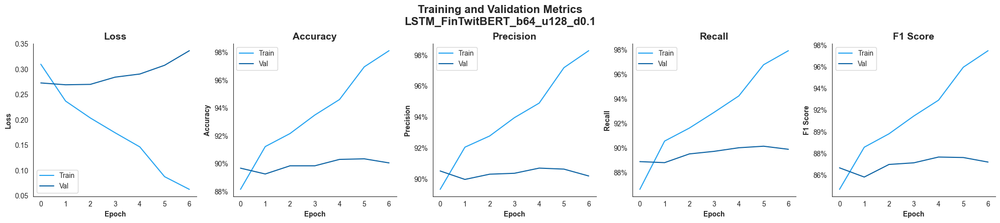

LSTM_FinTwitBERT_b64_u128_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.93      0.81      0.86      1082
 Bullish (1)       0.92      0.84      0.88      1442
 Neutral (2)       0.92      0.98      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.92      0.88      0.90      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

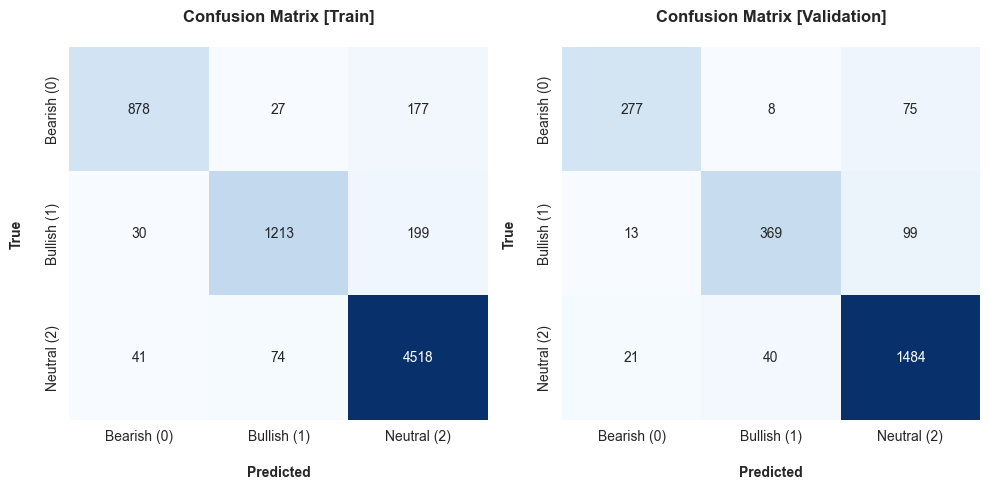

75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

Training with batch_size=64, lstm_units=128, dropout_rate=0.3
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8369 - auc: 0.9485 - f1_score: 0.7867 - loss: 0.4068 - precision: 0.8705 - recall: 0.7877 - val_accuracy: 0.8915 - val_auc: 0.9784 - val_f1_score: 0.8576 - val_loss: 0.2833 - val_precision: 0.8974 - val_recall: 0.8873 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - accuracy: 0.9070 - auc: 0.9811 - f1_score: 0.8787 - loss: 0.2574 - precision: 0.9135 - recall: 0.8981 - val_accuracy: 0.8990 - val_auc: 0.9803 - val_f1_score: 0.8717 - val_loss: 0.2677 - val_precision: 0.9075 - val_recall: 0.8919 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.9148 - auc: 0.9853 - f1_score: 0.8861 - loss: 0.2280 - precision: 0.9211 - recall: 0.9107 - val_accuracy: 0.8965 - val_auc: 0.9805 - val_f1_score: 0.8639 - val_loss: 0.2677 - val_precision: 0.9055 - val_recall: 0

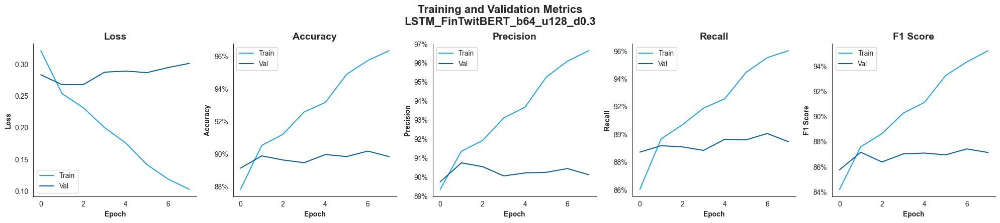

LSTM_FinTwitBERT_b64_u128_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.87      0.88      1082
 Bullish (1)       0.94      0.85      0.89      1442
 Neutral (2)       0.94      0.97      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.92      0.90      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

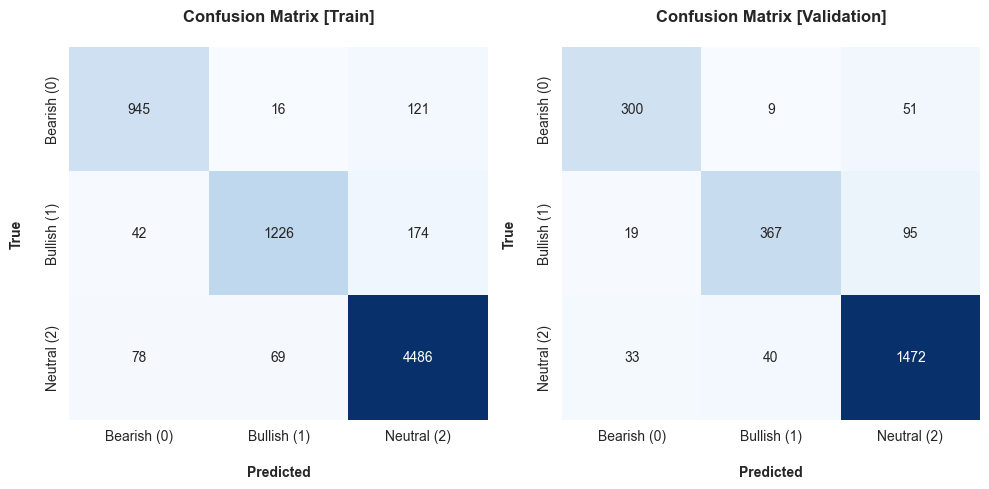

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step

Training with batch_size=64, lstm_units=128, dropout_rate=0.5
Epoch 1/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step - accuracy: 0.8319 - auc: 0.9412 - f1_score: 0.7868 - loss: 0.4253 - precision: 0.8661 - recall: 0.7753 - val_accuracy: 0.8990 - val_auc: 0.9802 - val_f1_score: 0.8683 - val_loss: 0.2681 - val_precision: 0.9053 - val_recall: 0.8940 - learning_rate: 0.0010
Epoch 2/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.8985 - auc: 0.9803 - f1_score: 0.8711 - loss: 0.2647 - precision: 0.9072 - recall: 0.8904 - val_accuracy: 0.8961 - val_auc: 0.9811 - val_f1_score: 0.8654 - val_loss: 0.2630 - val_precision: 0.9048 - val_recall: 0.8919 - learning_rate: 0.0010
Epoch 3/15
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.9074 - auc: 0.9836 - f1_score: 0.8785 - loss: 0.2427 - precision: 0.9156 - recall: 0.8999 - val_accuracy: 0.9028 - val_auc: 0.9816 - val_f1_score: 0.8739 - val_loss: 0.2584 - val_precision: 0.9075 - val_recall: 0

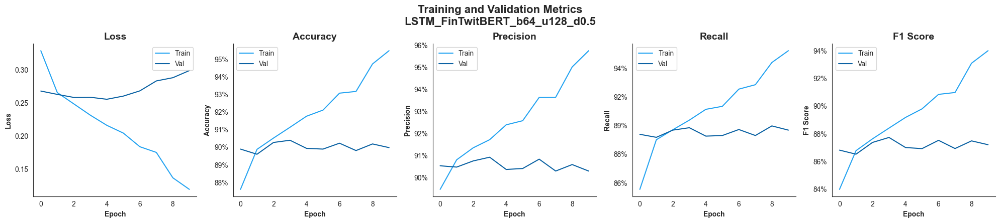

LSTM_FinTwitBERT_b64_u128_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.91      0.84      0.88      1082
 Bullish (1)       0.90      0.92      0.91      1442
 Neutral (2)       0.95      0.96      0.96      4633

    accuracy                           0.94      7157
   macro avg       0.92      0.91      0.91      7157
weighted avg       0.93      0.94      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

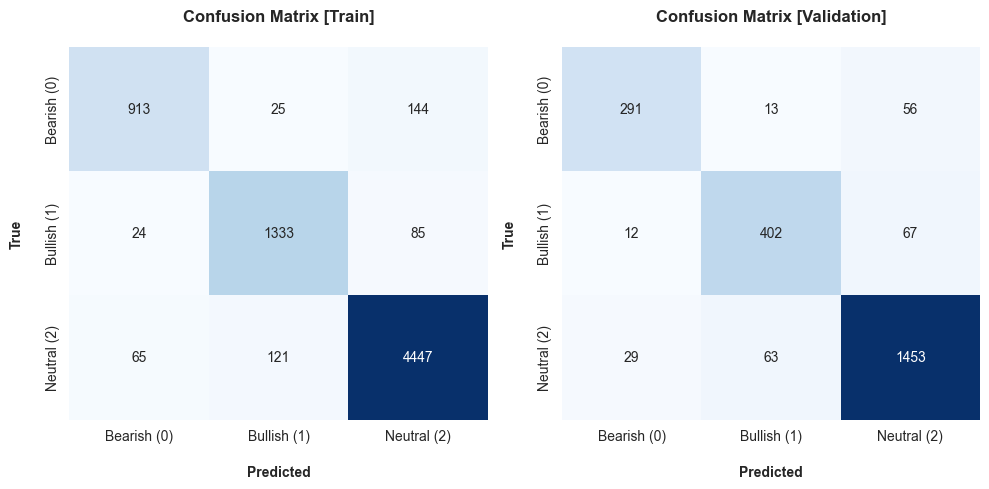

75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step

Training with batch_size=128, lstm_units=16, dropout_rate=0.1
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7519 - auc: 0.8945 - f1_score: 0.6633 - loss: 0.6200 - precision: 0.8409 - recall: 0.5769 - val_accuracy: 0.8977 - val_auc: 0.9783 - val_f1_score: 0.8675 - val_loss: 0.2808 - val_precision: 0.9067 - val_recall: 0.8877 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.8943 - auc: 0.9786 - f1_score: 0.8657 - loss: 0.2770 - precision: 0.9014 - recall: 0.8864 - val_accuracy: 0.8977 - val_auc: 0.9797 - val_f1_score: 0.8680 - val_loss: 0.2732 - val_precision: 0.9017 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9071 - auc: 0.9817 - f1_score: 0.8768 - loss: 0.2554 - precision: 0.9134 - recall: 0.8994 - val_accuracy: 0.9023 - val_auc: 0.9807 - val_f1_score: 0.8756 - val_loss: 0.2694 - val_precision: 0.9062 - val_recall: 0.8948 

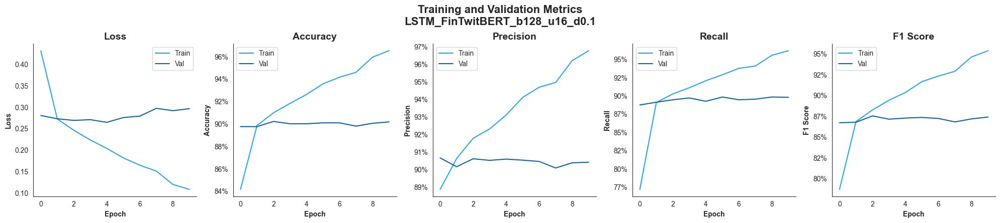

LSTM_FinTwitBERT_b128_u16_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.90      0.89      0.90      1082
 Bullish (1)       0.89      0.93      0.91      1442
 Neutral (2)       0.96      0.95      0.96      4633

    accuracy                           0.94      7157
   macro avg       0.92      0.93      0.92      7157
weighted avg       0.94      0.94      0.94      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

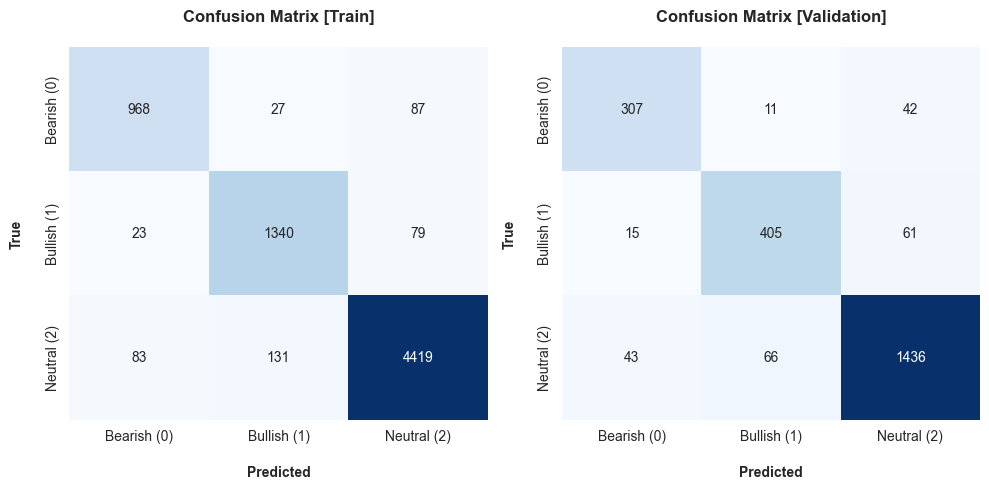

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step

Training with batch_size=128, lstm_units=16, dropout_rate=0.3
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7884 - auc: 0.9102 - f1_score: 0.7041 - loss: 0.5917 - precision: 0.8545 - recall: 0.6167 - val_accuracy: 0.8931 - val_auc: 0.9779 - val_f1_score: 0.8668 - val_loss: 0.2824 - val_precision: 0.8992 - val_recall: 0.8864 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8896 - auc: 0.9757 - f1_score: 0.8578 - loss: 0.2940 - precision: 0.8949 - recall: 0.8797 - val_accuracy: 0.8986 - val_auc: 0.9803 - val_f1_score: 0.8722 - val_loss: 0.2708 - val_precision: 0.9042 - val_recall: 0.8944 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9047 - auc: 0.9801 - f1_score: 0.8757 - loss: 0.2658 - precision: 0.9101 - recall: 0.8970 - val_accuracy: 0.8982 - val_auc: 0.9805 - val_f1_score: 0.8682 - val_loss: 0.2691 - val_precision: 0.9051 - val_recall: 0.8910 

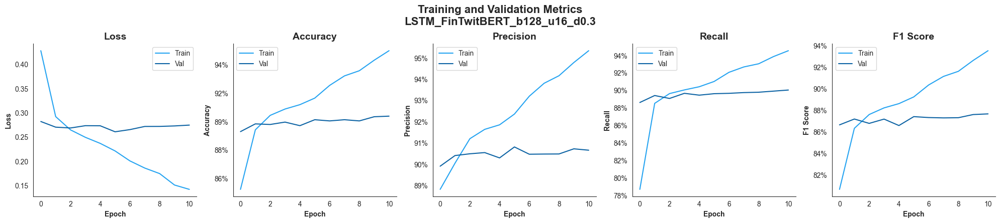

LSTM_FinTwitBERT_b128_u16_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.91      0.88      0.89      1082
 Bullish (1)       0.90      0.90      0.90      1442
 Neutral (2)       0.96      0.96      0.96      4633

    accuracy                           0.94      7157
   macro avg       0.92      0.92      0.92      7157
weighted avg       0.94      0.94      0.94      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

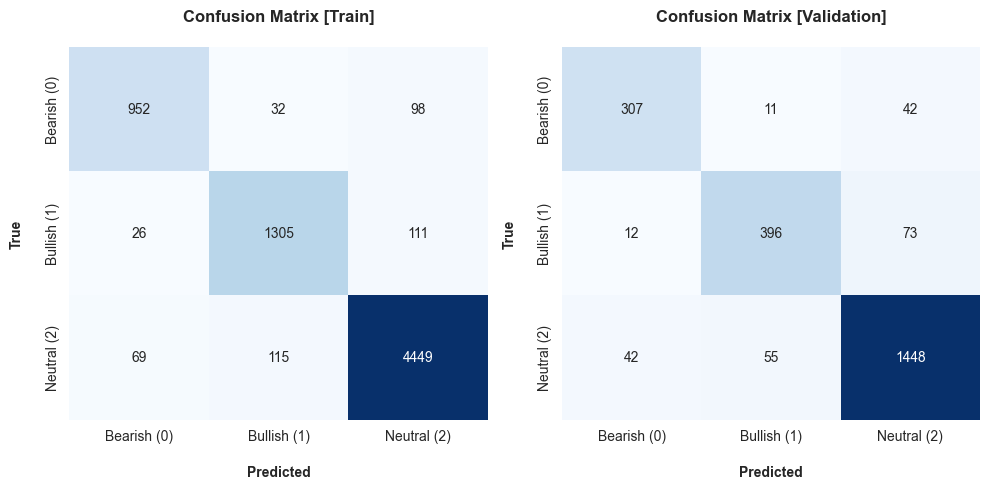

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Training with batch_size=128, lstm_units=16, dropout_rate=0.5
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.7597 - auc: 0.9107 - f1_score: 0.5945 - loss: 0.5929 - precision: 0.8511 - recall: 0.6181 - val_accuracy: 0.8898 - val_auc: 0.9761 - val_f1_score: 0.8632 - val_loss: 0.2970 - val_precision: 0.8980 - val_recall: 0.8814 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8830 - auc: 0.9718 - f1_score: 0.8462 - loss: 0.3169 - precision: 0.8964 - recall: 0.8743 - val_accuracy: 0.8986 - val_auc: 0.9782 - val_f1_score: 0.8727 - val_loss: 0.2809 - val_precision: 0.9042 - val_recall: 0.8898 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.8948 - auc: 0.9783 - f1_score: 0.8644 - loss: 0.2812 - precision: 0.9059 - recall: 0.8867 - val_accuracy: 0.9007 - val_auc: 0.9791 - val_f1_score: 0.8747 - val_loss: 0.2731 - val_precision: 0.9080 - val_recall: 0.8931 

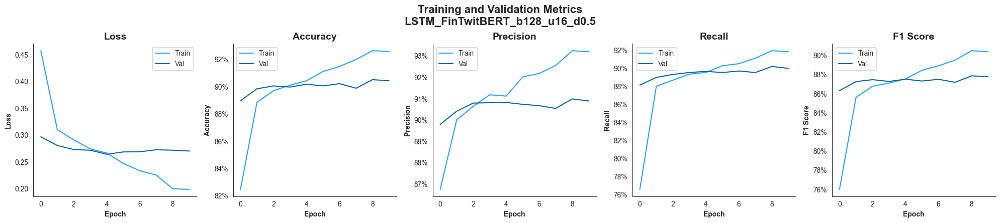

LSTM_FinTwitBERT_b128_u16_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.86      0.87      0.87      1082
 Bullish (1)       0.88      0.90      0.89      1442
 Neutral (2)       0.95      0.94      0.95      4633

    accuracy                           0.92      7157
   macro avg       0.90      0.90      0.90      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

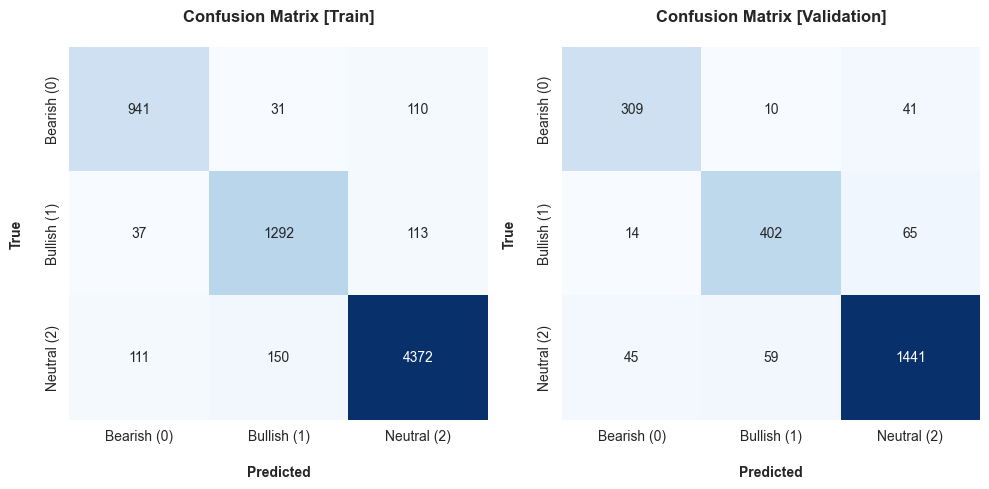

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

Training with batch_size=128, lstm_units=32, dropout_rate=0.1
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.7634 - auc: 0.8986 - f1_score: 0.7022 - loss: 0.5800 - precision: 0.8659 - recall: 0.6191 - val_accuracy: 0.8977 - val_auc: 0.9792 - val_f1_score: 0.8724 - val_loss: 0.2749 - val_precision: 0.9050 - val_recall: 0.8906 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.9025 - auc: 0.9800 - f1_score: 0.8740 - loss: 0.2695 - precision: 0.9096 - recall: 0.8919 - val_accuracy: 0.8994 - val_auc: 0.9808 - val_f1_score: 0.8714 - val_loss: 0.2658 - val_precision: 0.9072 - val_recall: 0.8927 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9208 - auc: 0.9859 - f1_score: 0.8952 - loss: 0.2247 - precision: 0.9272 - recall: 0.9125 - val_accuracy: 0.9032 - val_auc: 0.9815 - val_f1_score: 0.8756 - val_loss: 0.2578 - val_precision: 0.9089 - val_recall: 0.8948 

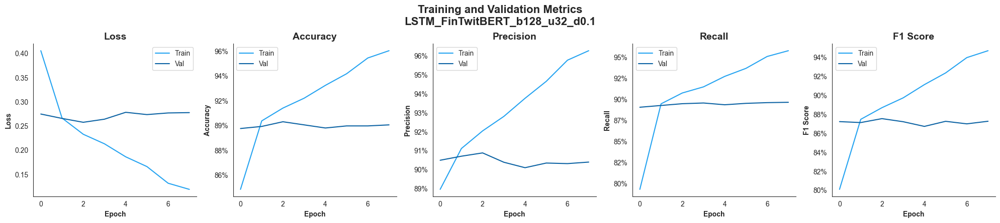

LSTM_FinTwitBERT_b128_u32_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.90      0.85      0.87      1082
 Bullish (1)       0.90      0.89      0.90      1442
 Neutral (2)       0.95      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.92      0.90      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

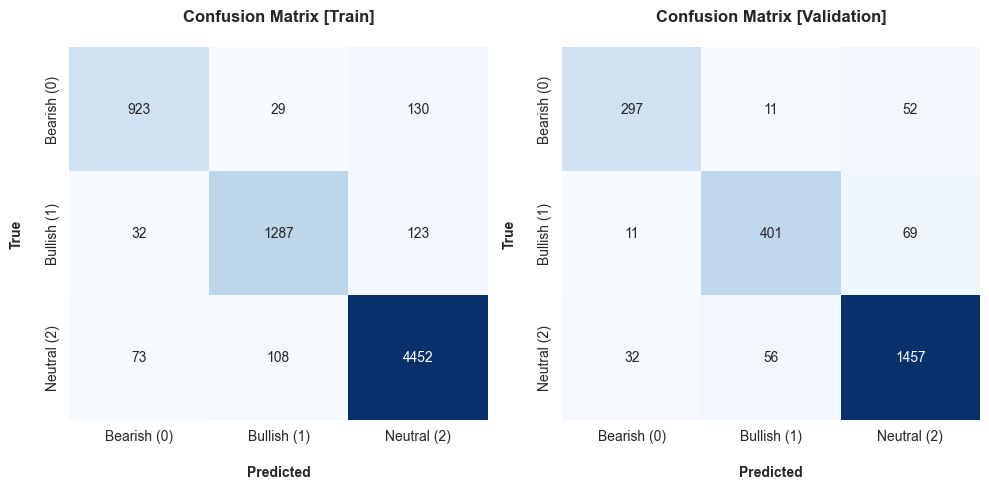

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

Training with batch_size=128, lstm_units=32, dropout_rate=0.3
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.7692 - auc: 0.8934 - f1_score: 0.7140 - loss: 0.5934 - precision: 0.8544 - recall: 0.6093 - val_accuracy: 0.8927 - val_auc: 0.9783 - val_f1_score: 0.8648 - val_loss: 0.2819 - val_precision: 0.9002 - val_recall: 0.8847 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.8955 - auc: 0.9785 - f1_score: 0.8687 - loss: 0.2794 - precision: 0.9020 - recall: 0.8888 - val_accuracy: 0.9003 - val_auc: 0.9802 - val_f1_score: 0.8715 - val_loss: 0.2680 - val_precision: 0.9071 - val_recall: 0.8965 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9038 - auc: 0.9812 - f1_score: 0.8760 - loss: 0.2580 - precision: 0.9110 - recall: 0.8957 - val_accuracy: 0.8969 - val_auc: 0.9798 - val_f1_score: 0.8671 - val_loss: 0.2720 - val_precision: 0.9040 - val_recall: 0.8915 

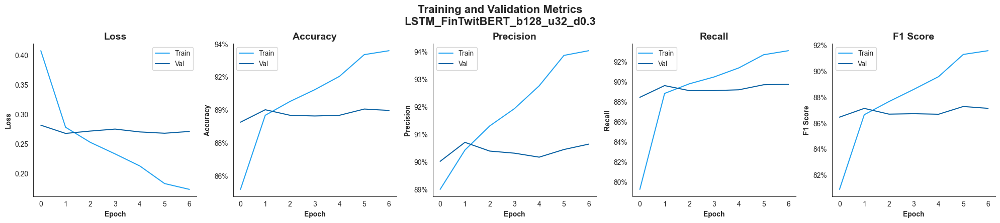

LSTM_FinTwitBERT_b128_u32_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.87      0.84      0.85      1082
 Bullish (1)       0.87      0.86      0.87      1442
 Neutral (2)       0.93      0.95      0.94      4633

    accuracy                           0.91      7157
   macro avg       0.89      0.88      0.89      7157
weighted avg       0.91      0.91      0.91      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

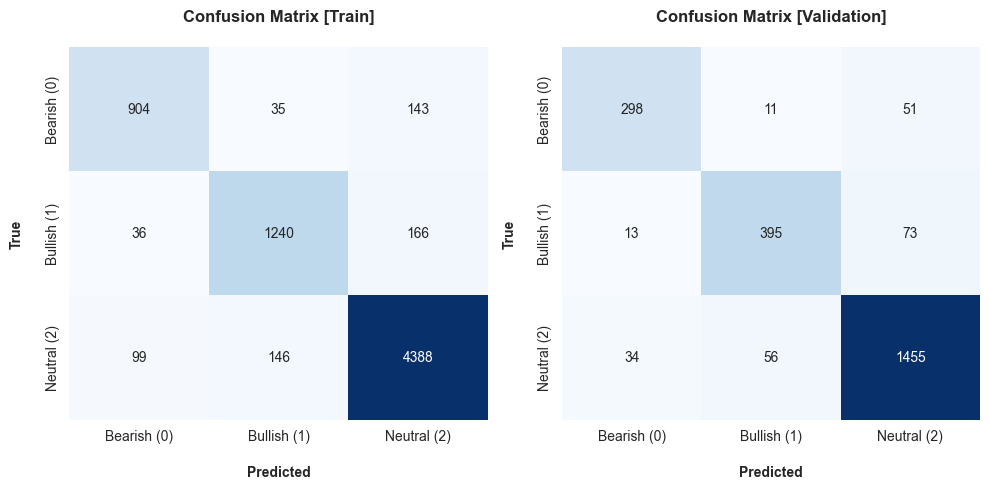

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Training with batch_size=128, lstm_units=32, dropout_rate=0.5
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7694 - auc: 0.9041 - f1_score: 0.6948 - loss: 0.5802 - precision: 0.8483 - recall: 0.6311 - val_accuracy: 0.9044 - val_auc: 0.9790 - val_f1_score: 0.8763 - val_loss: 0.2754 - val_precision: 0.9094 - val_recall: 0.9003 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - accuracy: 0.8995 - auc: 0.9764 - f1_score: 0.8710 - loss: 0.2884 - precision: 0.9062 - recall: 0.8881 - val_accuracy: 0.8982 - val_auc: 0.9798 - val_f1_score: 0.8672 - val_loss: 0.2704 - val_precision: 0.9066 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.9035 - auc: 0.9788 - f1_score: 0.8740 - loss: 0.2710 - precision: 0.9117 - recall: 0.8940 - val_accuracy: 0.9003 - val_auc: 0.9819 - val_f1_score: 0.8723 - val_loss: 0.2564 - val_precision: 0.9082 - val_recall: 0.8961 

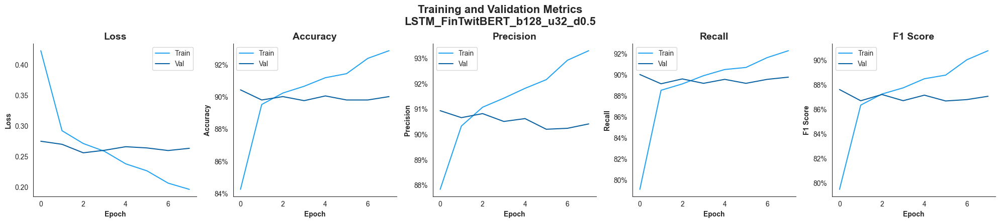

LSTM_FinTwitBERT_b128_u32_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.86      0.86      0.86      1082
 Bullish (1)       0.88      0.86      0.87      1442
 Neutral (2)       0.94      0.95      0.94      4633

    accuracy                           0.92      7157
   macro avg       0.89      0.89      0.89      7157
weighted avg       0.92      0.92      0.92      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

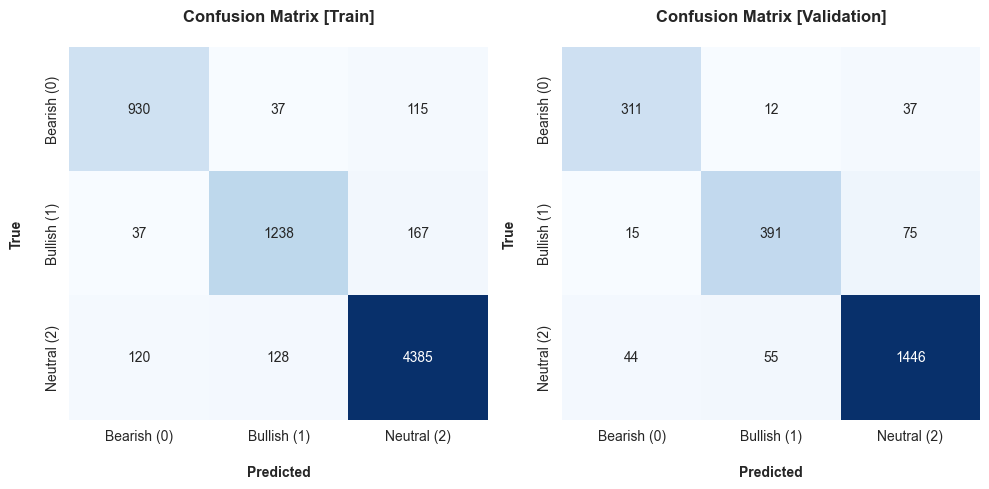

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step

Training with batch_size=128, lstm_units=64, dropout_rate=0.1
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.7936 - auc: 0.9304 - f1_score: 0.7162 - loss: 0.4931 - precision: 0.8625 - recall: 0.7046 - val_accuracy: 0.8994 - val_auc: 0.9790 - val_f1_score: 0.8720 - val_loss: 0.2761 - val_precision: 0.9037 - val_recall: 0.8931 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9028 - auc: 0.9814 - f1_score: 0.8727 - loss: 0.2597 - precision: 0.9116 - recall: 0.8961 - val_accuracy: 0.9007 - val_auc: 0.9804 - val_f1_score: 0.8690 - val_loss: 0.2676 - val_precision: 0.9074 - val_recall: 0.8952 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9201 - auc: 0.9865 - f1_score: 0.8948 - loss: 0.2197 - precision: 0.9262 - recall: 0.9129 - val_accuracy: 0.8986 - val_auc: 0.9808 - val_f1_score: 0.8696 - val_loss: 0.2652 - val_precision: 0.9044 - val_recall: 0.8919 

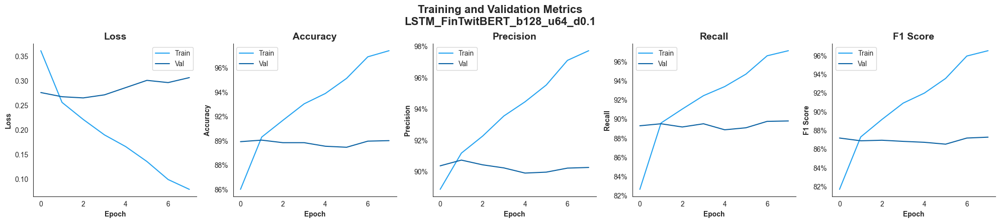

LSTM_FinTwitBERT_b128_u64_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.83      0.93      0.88      1082
 Bullish (1)       0.92      0.88      0.90      1442
 Neutral (2)       0.96      0.95      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.92      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

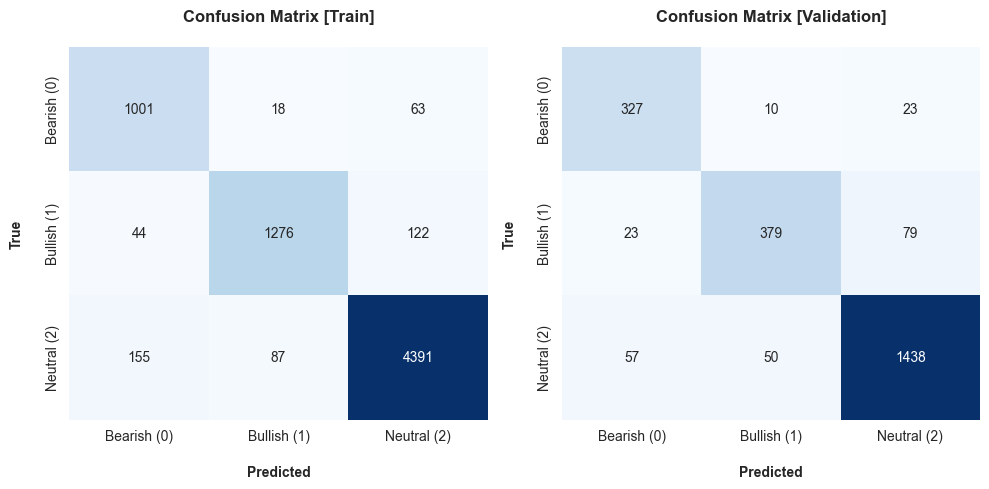

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Training with batch_size=128, lstm_units=64, dropout_rate=0.3
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.7933 - auc: 0.9086 - f1_score: 0.7504 - loss: 0.5287 - precision: 0.8708 - recall: 0.6819 - val_accuracy: 0.8986 - val_auc: 0.9789 - val_f1_score: 0.8725 - val_loss: 0.2772 - val_precision: 0.9082 - val_recall: 0.8910 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9005 - auc: 0.9802 - f1_score: 0.8705 - loss: 0.2688 - precision: 0.9087 - recall: 0.8936 - val_accuracy: 0.8961 - val_auc: 0.9802 - val_f1_score: 0.8642 - val_loss: 0.2706 - val_precision: 0.9016 - val_recall: 0.8910 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9102 - auc: 0.9839 - f1_score: 0.8846 - loss: 0.2397 - precision: 0.9169 - recall: 0.9038 - val_accuracy: 0.9023 - val_auc: 0.9811 - val_f1_score: 0.8737 - val_loss: 0.2646 - val_precision: 0.9075 - val_recall: 0.8961 

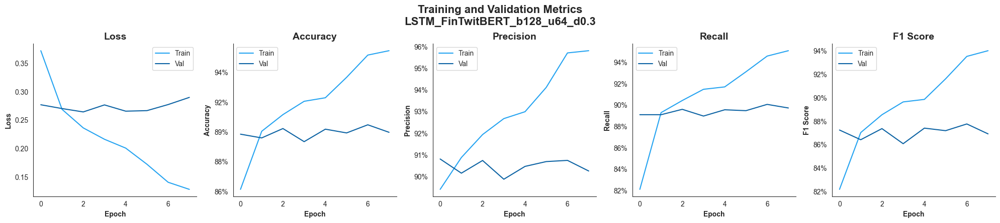

LSTM_FinTwitBERT_b128_u64_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.89      0.85      0.87      1082
 Bullish (1)       0.89      0.89      0.89      1442
 Neutral (2)       0.94      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.91      0.90      0.90      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

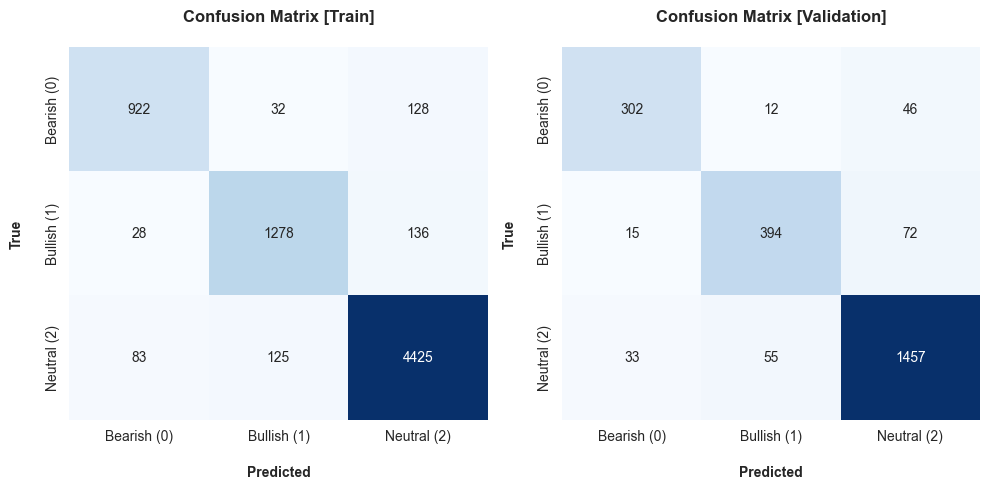

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step

Training with batch_size=128, lstm_units=64, dropout_rate=0.5
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.7703 - auc: 0.9085 - f1_score: 0.7024 - loss: 0.5294 - precision: 0.8289 - recall: 0.6943 - val_accuracy: 0.9003 - val_auc: 0.9791 - val_f1_score: 0.8709 - val_loss: 0.2748 - val_precision: 0.9066 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.9000 - auc: 0.9793 - f1_score: 0.8718 - loss: 0.2725 - precision: 0.9075 - recall: 0.8875 - val_accuracy: 0.9003 - val_auc: 0.9805 - val_f1_score: 0.8716 - val_loss: 0.2652 - val_precision: 0.9062 - val_recall: 0.8948 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.8970 - auc: 0.9799 - f1_score: 0.8662 - loss: 0.2683 - precision: 0.9048 - recall: 0.8915 - val_accuracy: 0.8994 - val_auc: 0.9802 - val_f1_score: 0.8693 - val_loss: 0.2684 - val_precision: 0.9041 - val_recall: 0.8931 

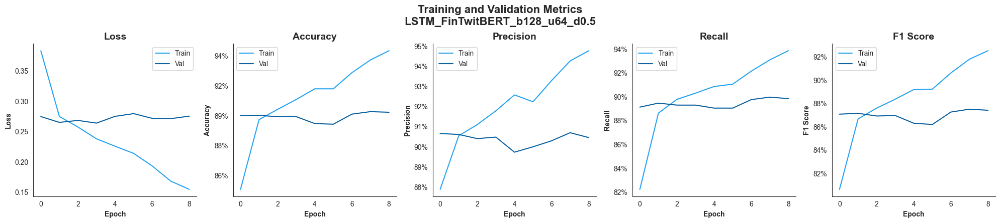

LSTM_FinTwitBERT_b128_u64_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.91      0.82      0.87      1082
 Bullish (1)       0.90      0.87      0.89      1442
 Neutral (2)       0.94      0.96      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.92      0.89      0.90      7157
weighted avg       0.92      0.93      0.92      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

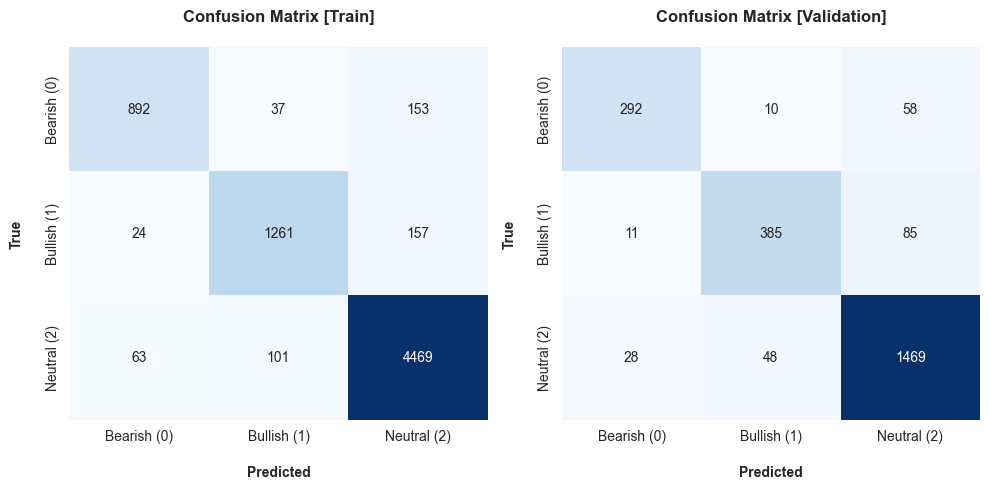

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

Training with batch_size=128, lstm_units=128, dropout_rate=0.1
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.8173 - auc: 0.9390 - f1_score: 0.7578 - loss: 0.4397 - precision: 0.8739 - recall: 0.7484 - val_accuracy: 0.9007 - val_auc: 0.9802 - val_f1_score: 0.8717 - val_loss: 0.2673 - val_precision: 0.9094 - val_recall: 0.8915 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.9101 - auc: 0.9825 - f1_score: 0.8826 - loss: 0.2508 - precision: 0.9190 - recall: 0.9005 - val_accuracy: 0.8969 - val_auc: 0.9793 - val_f1_score: 0.8650 - val_loss: 0.2728 - val_precision: 0.9038 - val_recall: 0.8864 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.9188 - auc: 0.9863 - f1_score: 0.8924 - loss: 0.2203 - precision: 0.9243 - recall: 0.9115 - val_accuracy: 0.8998 - val_auc: 0.9789 - val_f1_score: 0.8754 - val_loss: 0.2774 - val_precision: 0.9063 - val_recall: 0.8956

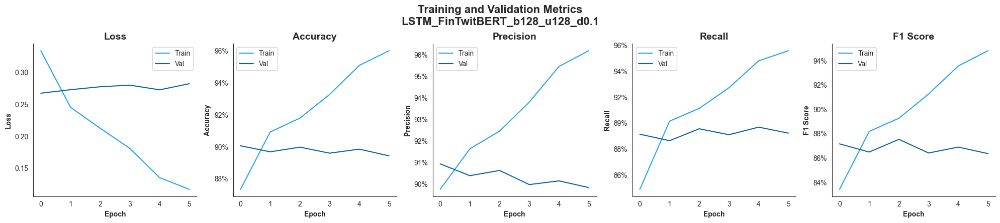

LSTM_FinTwitBERT_b128_u128_d0.1

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.83      0.86      0.84      1082
 Bullish (1)       0.87      0.87      0.87      1442
 Neutral (2)       0.94      0.93      0.94      4633

    accuracy                           0.91      7157
   macro avg       0.88      0.89      0.88      7157
weighted avg       0.91      0.91      0.91      7157


AUROC: 0.98
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

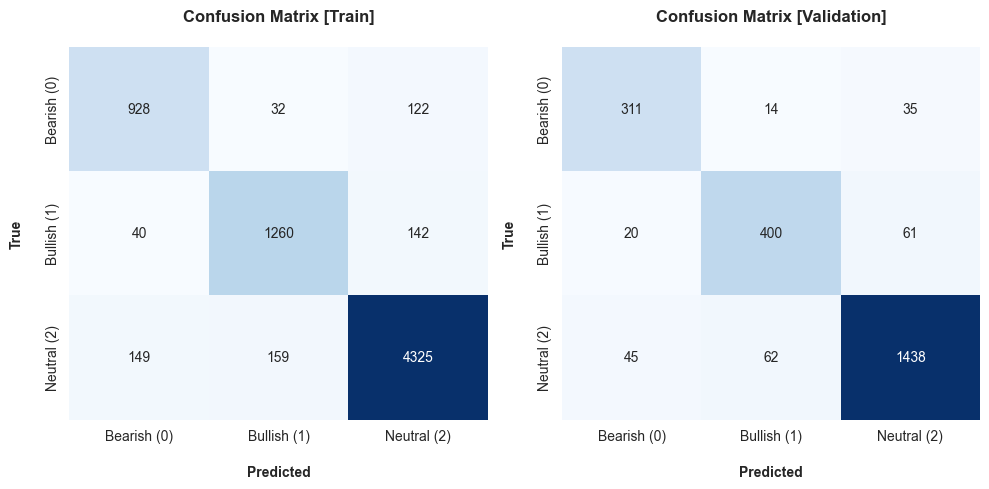

75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step

Training with batch_size=128, lstm_units=128, dropout_rate=0.3
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8125 - auc: 0.9254 - f1_score: 0.7631 - loss: 0.4724 - precision: 0.8556 - recall: 0.7365 - val_accuracy: 0.8998 - val_auc: 0.9799 - val_f1_score: 0.8726 - val_loss: 0.2679 - val_precision: 0.9085 - val_recall: 0.8944 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.9101 - auc: 0.9836 - f1_score: 0.8823 - loss: 0.2429 - precision: 0.9164 - recall: 0.9009 - val_accuracy: 0.9011 - val_auc: 0.9812 - val_f1_score: 0.8730 - val_loss: 0.2611 - val_precision: 0.9055 - val_recall: 0.8956 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9150 - auc: 0.9855 - f1_score: 0.8860 - loss: 0.2274 - precision: 0.9225 - recall: 0.9075 - val_accuracy: 0.8948 - val_auc: 0.9817 - val_f1_score: 0.8639 - val_loss: 0.2597 - val_precision: 0.9027 - val_recall: 0.8902

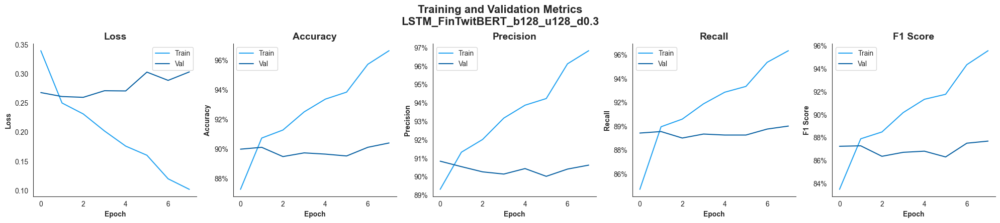

LSTM_FinTwitBERT_b128_u128_d0.3

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.92      0.84      0.88      1082
 Bullish (1)       0.93      0.85      0.89      1442
 Neutral (2)       0.93      0.97      0.95      4633

    accuracy                           0.93      7157
   macro avg       0.93      0.89      0.91      7157
weighted avg       0.93      0.93      0.93      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

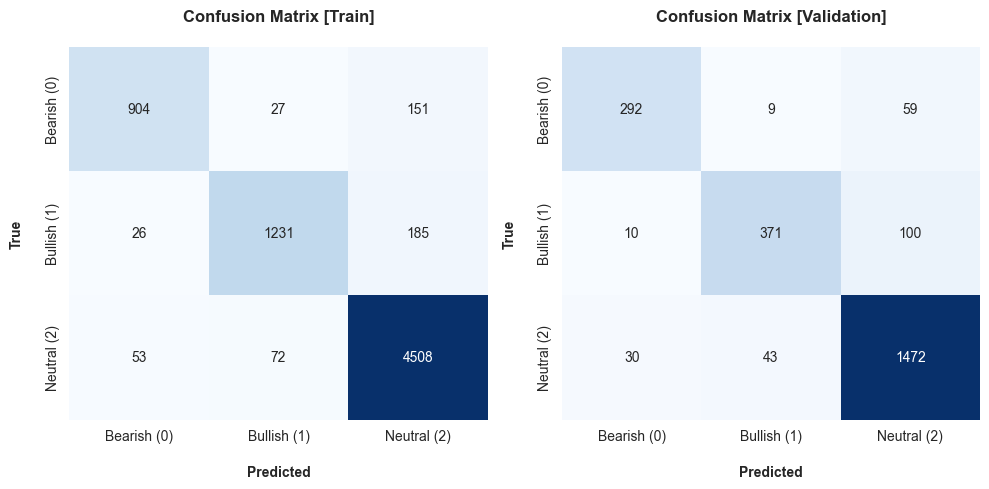

75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step

Training with batch_size=128, lstm_units=128, dropout_rate=0.5
Epoch 1/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8275 - auc: 0.9454 - f1_score: 0.7646 - loss: 0.4365 - precision: 0.8691 - recall: 0.7648 - val_accuracy: 0.8998 - val_auc: 0.9804 - val_f1_score: 0.8717 - val_loss: 0.2637 - val_precision: 0.9079 - val_recall: 0.8927 - learning_rate: 0.0010
Epoch 2/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.9087 - auc: 0.9820 - f1_score: 0.8819 - loss: 0.2539 - precision: 0.9173 - recall: 0.8981 - val_accuracy: 0.9044 - val_auc: 0.9815 - val_f1_score: 0.8788 - val_loss: 0.2579 - val_precision: 0.9120 - val_recall: 0.8952 - learning_rate: 0.0010
Epoch 3/15
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.9099 - auc: 0.9841 - f1_score: 0.8830 - loss: 0.2366 - precision: 0.9197 - recall: 0.9020 - val_accuracy: 0.8982 - val_auc: 0.9806 - val_f1_score: 0.8664 - val_loss: 0.2669 - val_precision: 0.9022 - val_recall: 0.8931

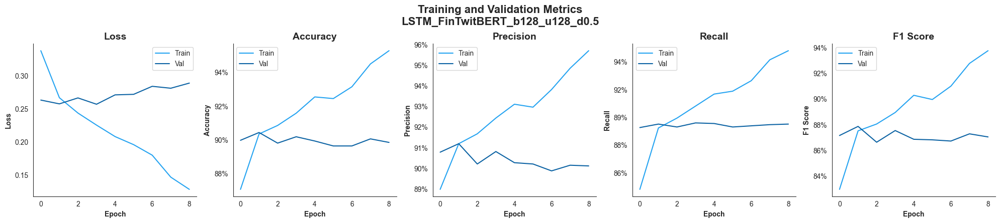

LSTM_FinTwitBERT_b128_u128_d0.5

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

 Bearish (0)       0.90      0.87      0.89      1082
 Bullish (1)       0.89      0.91      0.90      1442
 Neutral (2)       0.96      0.96      0.96      4633

    accuracy                           0.94      7157
   macro avg       0.92      0.91      0.92      7157
weighted avg       0.94      0.94      0.94      7157


AUROC: 0.99
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------

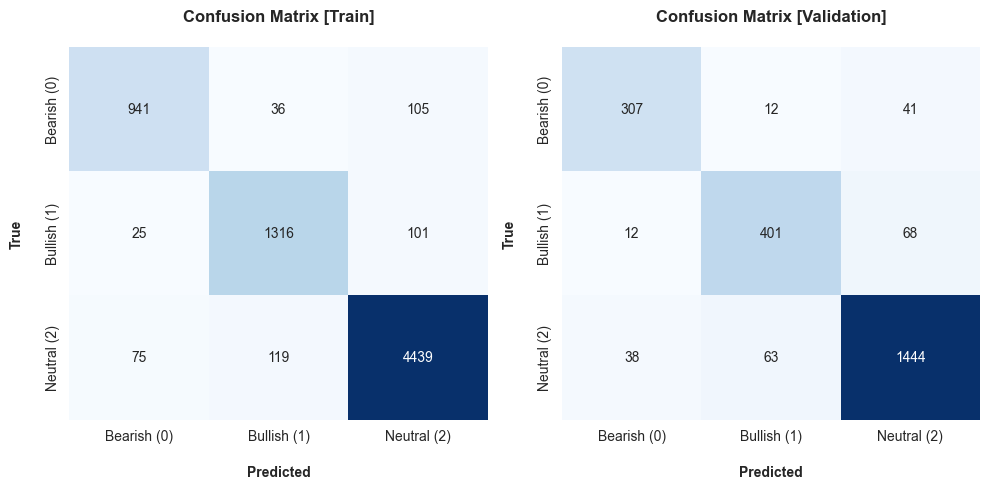

75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step


,Time of Execution,Accuracy,Precision,Recall,F1 Score (Macro),AUROC
LSTM_FinTwitBERT_b32_u16_d0.1,62.54,0.91,0.88,0.89,0.88,0.98
LSTM_FinTwitBERT_b32_u16_d0.3,72.38,0.92,0.90,0.88,0.89,0.98
LSTM_FinTwitBERT_b32_u16_d0.5,143.48,0.93,0.92,0.91,0.91,0.99
LSTM_FinTwitBERT_b32_u32_d0.1,65.07,0.91,0.88,0.89,0.88,0.98
LSTM_FinTwitBERT_b32_u32_d0.3,111.15,0.94,0.92,0.91,0.92,0.99
LSTM_FinTwitBERT_b32_u32_d0.5,111.74,0.93,0.91,0.91,0.91,0.99
LSTM_FinTwitBERT_b32_u64_d0.1,87.87,0.93,0.91,0.91,0.91,0.99
LSTM_FinTwitBERT_b32_u64_d0.3,89.05,0.93,0.91,0.90,0.91,0.99
LSTM_FinTwitBERT_b32_u64_d0.5,102.96,0.92,0.90,0.90,0.90,0.98
LSTM_FinTwitBERT_b32_u128_d0.1,60.40,0.91,0.89,0.88,0.89,0.98


In [60]:
# --------------------- [Hyperparameter Tuning for LSTM with FinTwitBERT] -----------------
# Iterate over all hyperparameter combinations
for batch_size, lstm_units, dropout_rate in hyperparameter_combinations:
    print(f"\n\033[1mTraining with batch_size={batch_size}, lstm_units={lstm_units}, dropout_rate={dropout_rate}\033[0m")
    
    # Train and evaluate the model
    train_results, val_results, _ = train_and_evaluate_lstm(
        batch_size, lstm_units, dropout_rate,
        np.stack(X_train_FinTwitBERT), y_train_ohe,
        np.stack(X_val_FinTwitBERT), y_val_ohe,
        np.stack(X_test_FinTwitBERT), tweets_test_data
    )
    
    # Store results
    all_train_results.update(train_results)
    all_val_results.update(val_results)

# Display all results side by side
display_side_by_side(
    pd.DataFrame(all_train_results).T,
    pd.DataFrame(all_val_results).T,
    titles=['Training Data', 'Validation Data'],
    super_title='Classification Metrics | FinTwitBERT & LSTM Classifier (Fine-Tuned)'
)

---

## **🥇 Ensemble Model (Majority Voting)**

In [88]:
# Print all predictions files within the Predictions directory
predictions_files = os.listdir('./Predictions/')
print("\n\033[1mPredictions Files:\033[0m")
for file in predictions_files:
    print(f" - {file}")


Predictions Files:
 - 1_LSTM&TF-IDF_TestPredictions.csv
 - 2_LSTM&GloVe_TestPredictions.csv
 - 3_LSTM&DeBERTa_TestPredictions.csv
 - 4_LSTM&FinTwitBERT_TestPredictions.csv
 - 5_FinTwitBERT_TestPredictions.csv
 - 6_DeBERTaV3_TestPredictions.csv
 - 7_Phi3_TestPredictions.csv
 - LSTM_FinTwitBERT_FineTune
 - MajorityVote_Ensemble_TestPredictions.csv
 - _


In [ ]:
# Directory containing prediction files
predictions_dir = "./Predictions/"

# List of prediction files
prediction_files = [
    "3_LSTM&DeBERTa_TestPredictions.csv",
    "LSTM_FinTwitBERT_FineTune/LSTM_FinTwitBERT_b64_u128_d0.3_TestPredictions.csv",
    "5_FinTwitBERT_TestPredictions.csv",
]

In [ ]:
# Function to perform majority voting
def majority_vote(labels):
    """
    Returns the label with the most votes. In case of a tie, returns the first label encountered.
    
    Args:
        labels (list): List of labels for a single sample.
        
    Returns:
        int: The majority vote label.
    """
    vote_count = Counter(labels)
    max_count = max(vote_count.values())
    
    # Check for ties by counting how many labels have the max count
    tied_labels = [label for label, count in vote_count.items() if count == max_count]
    
    # If there is more than one label with the max count, return neutral (2)
    if len(tied_labels) > 1:
        return 2 # 'Neutral' label
    
    # Otherwise, return the label with the max count
    return tied_labels[0]

# ----------------- [Majority Voting for Predictions] -----------------
# List of possible labels
labels = [0, 1, 2]  # 0: Bearish, 1: Bullish, 2: Neutral

# Generate all 27 combinations (3x3x3)
combinations = list(product(labels, repeat=3))

# Dictionary to map labels to names
label_name = {0: "Bearish", 1: "Bullish", 2: "Neutral"}

# Test each combination
print("\033[1mCombination\t\t\t\tResult\033[0m")
print("-" * 30)
for i, comb in enumerate(combinations, 1):
    result = majority_vote(comb)
    comb_str = f"{[label_name[l] for l in comb]}"
    result_str = label_name[result]
    print(f"{i}. {comb_str}\t-> {result_str}")

Combination				Result
------------------------------
1. ['Bearish', 'Bearish', 'Bearish']	-> Bearish
2. ['Bearish', 'Bearish', 'Bullish']	-> Bearish
3. ['Bearish', 'Bearish', 'Neutral']	-> Bearish
4. ['Bearish', 'Bullish', 'Bearish']	-> Bearish
5. ['Bearish', 'Bullish', 'Bullish']	-> Bullish
6. ['Bearish', 'Bullish', 'Neutral']	-> Neutral
7. ['Bearish', 'Neutral', 'Bearish']	-> Bearish
8. ['Bearish', 'Neutral', 'Bullish']	-> Neutral
9. ['Bearish', 'Neutral', 'Neutral']	-> Neutral
10. ['Bullish', 'Bearish', 'Bearish']	-> Bearish
11. ['Bullish', 'Bearish', 'Bullish']	-> Bullish
12. ['Bullish', 'Bearish', 'Neutral']	-> Neutral
13. ['Bullish', 'Bullish', 'Bearish']	-> Bullish
14. ['Bullish', 'Bullish', 'Bullish']	-> Bullish
15. ['Bullish', 'Bullish', 'Neutral']	-> Bullish
16. ['Bullish', 'Neutral', 'Bearish']	-> Neutral
17. ['Bullish', 'Neutral', 'Bullish']	-> Bullish
18. ['Bullish', 'Neutral', 'Neutral']	-> Neutral
19. ['Neutral', 'Bearish', 'Bearish']	-> Bearish
20. ['Neutral', 'Bearish'

In [91]:
# Load and merge all prediction files
def load_predictions(files, directory):
    """
    Loads all prediction CSV files and merges them on 'id'.
    
    Args:
        files (list): List of prediction file names.
        directory (str): Path to the predictions directory.
        
    Returns:
        pd.DataFrame: Merged DataFrame with 'id' and labels from each model.
    """
    dfs = []
    for file in files:
        df = pd.read_csv(os.path.join(directory, file))
        model_name = file.replace("_TestPredictions.csv", "")
        df = df.rename(columns={"label": f"label_{model_name}"})
        dfs.append(df[["id", f"label_{model_name}"]])
    
    # Merge all DataFrames on 'id'
    merged_df = dfs[0]
    for df in dfs[1:]:
        merged_df = merged_df.merge(df, on="id", how="outer")
    
    return merged_df

# Perform majority voting
def compute_majority_vote(merged_df):
    """
    Computes majority vote for each sample in the merged DataFrame.
    
    Args:
        merged_df (pd.DataFrame): DataFrame with 'id' and label columns from each model.
        
    Returns:
        pd.DataFrame: DataFrame with 'id' and 'label' (majority vote result).
    """
    # Get label columns (all columns except 'id')
    label_columns = [col for col in merged_df.columns if col.startswith("label_")]
    
    # Initialize result DataFrame
    result = pd.DataFrame({"id": merged_df["id"], "label": None})
    
    # Compute majority vote for each row
    for idx in tqdm(range(len(merged_df)), desc="Computing Majority Vote"):
        labels = merged_df.iloc[idx][label_columns].dropna().astype(int).tolist()
        result.at[idx, "label"] = majority_vote(labels)
    
    result["label"] = result["label"].astype(int)
    return result

# Load predictions from specified files and compute majority vote
merged_predictions = load_predictions(prediction_files, predictions_dir)
ensemble_predictions = compute_majority_vote(merged_predictions)

# Save ensemble predictions to CSV
output_file = "./Predictions/MajorityVote_Ensemble_TestPredictions.csv"
ensemble_predictions.to_csv(output_file, index=False)

# Display summary of predictions
print("\n\033[1mEnsemble Predictions Summary:\033[0m")
pd.DataFrame({
    'n': ensemble_predictions["label"].value_counts().rename({0: "Bearish", 1: "Bullish", 2: "Neutral"}),
    '%': round(ensemble_predictions["label"].value_counts(normalize=True).rename({0: "Bearish", 1: "Bullish", 2: "Neutral"}) * 100, 1)
})

Computing Majority Vote: 100%|██████████| 2388/2388 [00:01<00:00, 1994.41it/s]



Ensemble Predictions Summary:


,n,%
label,,
Neutral,1579,66.1
Bullish,441,18.5
Bearish,368,15.4


---

# **🔗 Bibliography/References**


**[[1]](https://smartasset.com/financial-advisor/bullish-vs-bearish)** Reed, Eric. “Bullish vs. Bearish: What’s the Difference?” SmartAsset, 16 Mar. 2021, smartasset.com/financial-advisor/bullish-vs-bearish.